In [1]:
import pandas as pd
import missingno as mg
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
#import ydata_profiling
import matplotlib_inline
import calendar
import warnings
warnings.filterwarnings('ignore')

In [ ]:
#Reading all files of phillips data set
file1=pd.read_excel("C:\Users\PMLS\OneDrive - Institute of Business Administration\Laptop Imp\IBA Resources\Semester 8\Business Intelligence\Assignment\Project\BI\Sales Report 2013-2017.xlsx")
file2=pd.read_excel("C:\Users\PMLS\OneDrive - Institute of Business Administration\Laptop Imp\IBA Resources\Semester 8\Business Intelligence\Assignment\Project\BI\Total Sales Pakistan 2018 and 2019.xlsx")
file3=pd.read_excel("C:\Users\PMLS\OneDrive - Institute of Business Administration\Laptop Imp\IBA Resources\Semester 8\Business Intelligence\Assignment\Project\BI\sales 2020 1.xlsx")

In [2]:
import pandas as pd

# Specify the encoding (e.g., UTF-8)
file_path = '/content/BankChurners.csv'
file = pd.read_csv(file_path, encoding='utf-8')

# Perform data analysis after reading the CSV


Dropping Columns

In [ ]:
#dropping columns that were either completely empty, not present in other files and were empty or were creating redundancy
#did this so we can concatenate the files easily, and that can be done only when column names are same
cols_to_drop1= ['Unnamed: 39','Unnamed: 38','Unnamed: 37','WEEK','Discount %','Discount Amount', 'Invoice Date.1', 'Invoice Date', 'ZONE','Month #','Product Hierarchy','Amount','Month']
cols_to_drop2= ['Discount %','Discount Amount', 'Invoice Date.1', 'Invoice Date', 'ZONE','Month #','Month','Product Type','Amount','DELIVERY']
cols_to_drop3= ['Discount %','Discount Amount', 'Invoice Date.1', 'Invoice Date', 'ZONE','Month #','Month','Product Type','Net Amount','DELIVERY']
# Drop the specified columns
file1 = file1.drop(cols_to_drop1, axis=1)
file2 = file2.drop(cols_to_drop2, axis=1)
file3 = file3.drop(cols_to_drop3, axis=1)

Merging Dirty Files

In [ ]:
file=pd.concat([file1, file2, file3], ignore_index=True)

Details of the Data

In [3]:
sreport=ydata_profiling.ProfileReport(file)
sreport.to_file("phillips_summary.html")

NameError: ignored

In [4]:
file.shape

(10127, 23)

In [5]:
file.dtypes

CLIENTNUM                                                                                                                               int64
Attrition_Flag                                                                                                                         object
Customer_Age                                                                                                                            int64
Gender                                                                                                                                 object
Dependent_count                                                                                                                         int64
Education_Level                                                                                                                        object
Marital_Status                                                                                                                         object
Income

In [6]:
#to see how many missing values each col has
file.isnull().sum()

CLIENTNUM                                                                                                                             0
Attrition_Flag                                                                                                                        0
Customer_Age                                                                                                                          0
Gender                                                                                                                                0
Dependent_count                                                                                                                       0
Education_Level                                                                                                                       0
Marital_Status                                                                                                                        0
Income_Category                                 

Visual Representation of Missing Values

<Axes: >

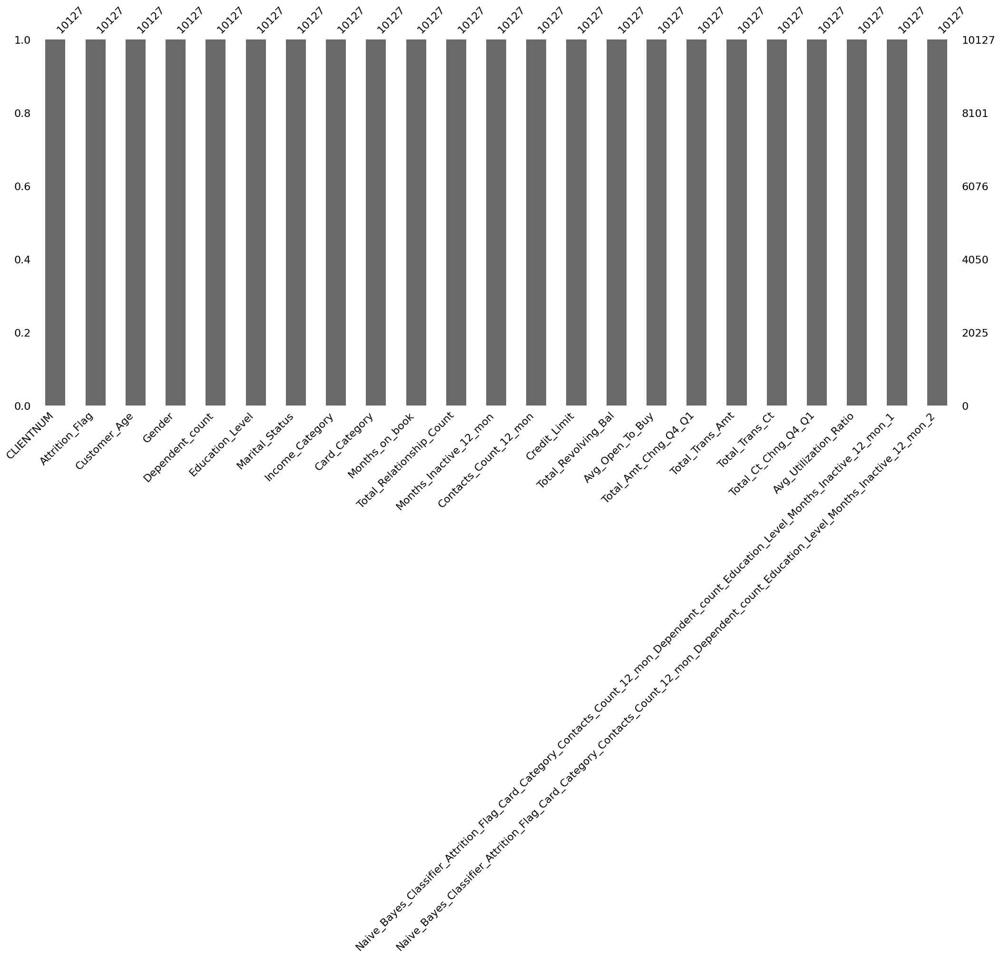

In [7]:
#visualizing the missing values for every column, white spaces represent the missing values
#the data set consist of total 223824 rows, indicating that columns less than 223824 rows have some amount of missing values in them
mg.bar(file)

<Axes: >

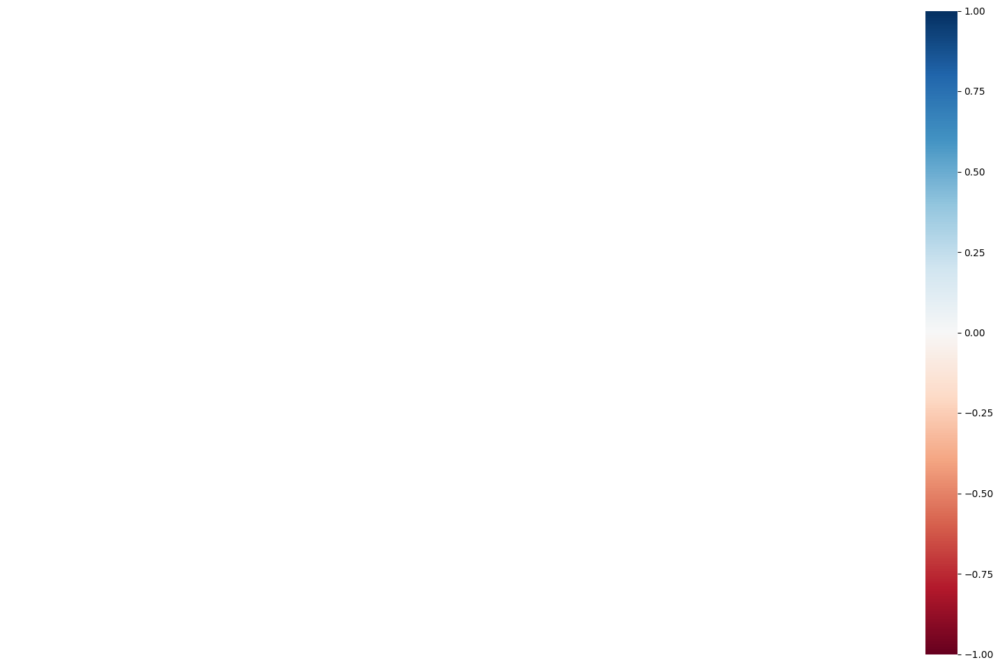

In [9]:
#visualizing the co-relation between the columns on the basis of the missing values
#1 indicates a highly positive co-relation and -1 indicates a highly negative co-relation
#here we can see many highly co-related columns with a few negatively related columns
mg.heatmap(file)

<Axes: >

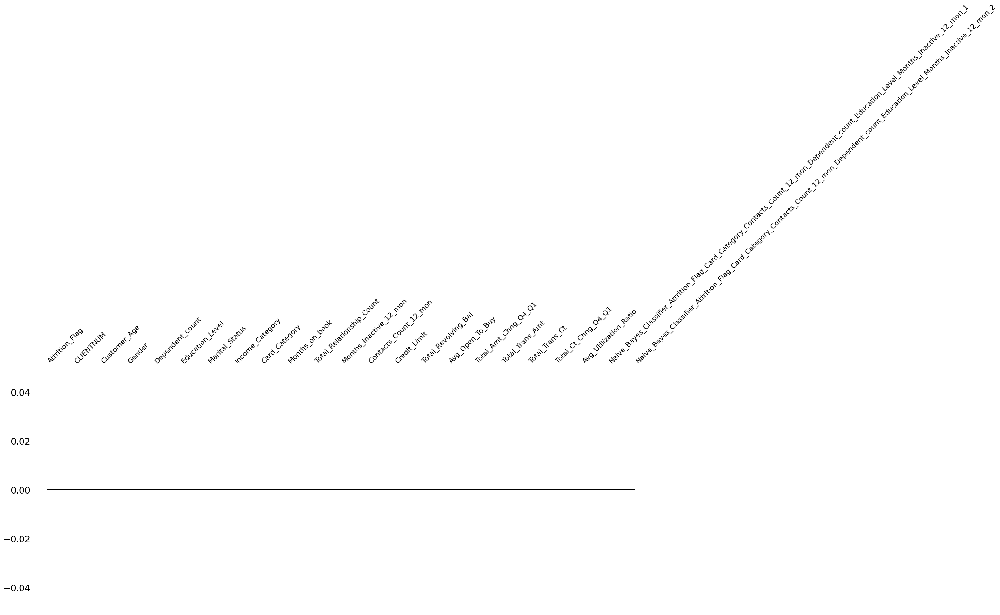

In [10]:
#makes clusters according to the number of missing values each column has and also takes corelation in consideration
mg.dendrogram(file)

Functions\API'S for our Data

In [11]:
#a function to detect outliers and anomalies, the list returns the indexes of outliers and anomalies if any
def outliers(file,col_namee):
    Q1=file[col_namee].quantile(0.25)
    Q3=file[col_namee].quantile(0.75)
    IQR=Q3-Q1
    lower_limit=Q1-1.5*IQR
    upper_limit=Q3+1.5*IQR

    out_list=file.index[(file[col_namee]<lower_limit)| (file[col_namee]>upper_limit)]
    return out_list

In [12]:
#a function to handle outliers and anomalies
#ol is the list of indexes of the outliers and anomalies we determined from the outliers function
#this method will replace all the outliers and anomalies below the q1 range with q1, and above q3 range with q3- to balance out the data
def handle_outliers(file,col_nam,ol):
    q1=file[col_nam].quantile(0.25)
    q3=file[col_nam].quantile(0.75)
    for i in ol:
        if file.loc[i,col_nam]<q1:
            file.loc[i,col_nam]=q1
        elif file.loc[i,col_nam]>q3:
            file.loc[i,col_nam]=q3

Handling Missing Values\Uni-Variate Analysis

PD - Column

In [ ]:
#In Product Division Column we can see inconsistencies as well as nan values
file['PD'].unique()

array(['LIGHT', 'LIGHTS', nan], dtype=object)

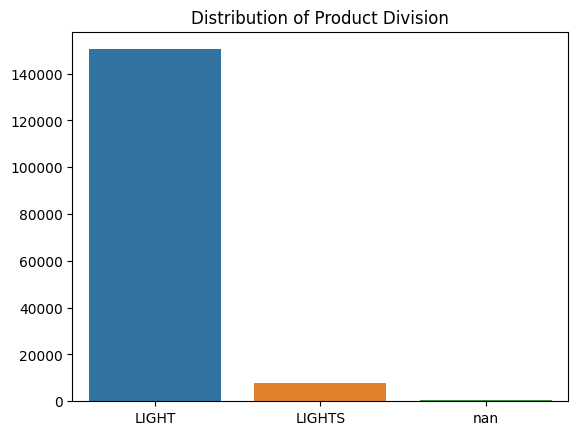

In [ ]:
#making a barplot to see the distribution of the PD and the missing values in it
#we can see that LIGHT has a higher count in the data, so we will replace LIGHTS with LIGHT
#this shows that the company mostly sells or is famous for their lights
import matplotlib.pyplot as plt
PD=['LIGHT','LIGHTS','nan'] #the categories the PD Variable had
pdcount=[150381,7752,521]#frequency count each category had
sns.barplot(x=PD,y=pdcount)
plt.title('Distribution of Product Division')
plt.show()

In [ ]:
#dealing with inconsistencies
#since both light and lights means the same thing and in the upper barplot we saw that LIGHT has more values, so we will replace LIGHTS with LIGHT
file['PD']=file['PD'].replace('LIGHTS','LIGHT')

In [ ]:
#after going through the items given in the file and researching about them we found out that these all are light products, so we will fill the missing values in product division with light only
#also in other files it is the only product division type we have
file['Item Description'].value_counts()

TL-D 36W/54-765 1SL/25                  5836
TL RS 40W/54-765 1SL/25                 4794
TORNADO 23W CDL E27 220-240V 1CT/12     3649
TORNADO 24W CDL E27 220-240V 1CT/12     3561
TL-D 18W/54-765 1SL/25                  2938
                                        ... 
PABPA-WW-L-FF-Baby Room                    1
PABPA-WW-L-FF-Boy D/Bath                   1
PABPA-WW-L-FF-Boy Play Room                1
PABPA-WW-L-FF-Master Lounge                1
BRP381 LED119/WW 90W 220-240V DM PSC       1
Name: Item Description, Length: 3072, dtype: int64

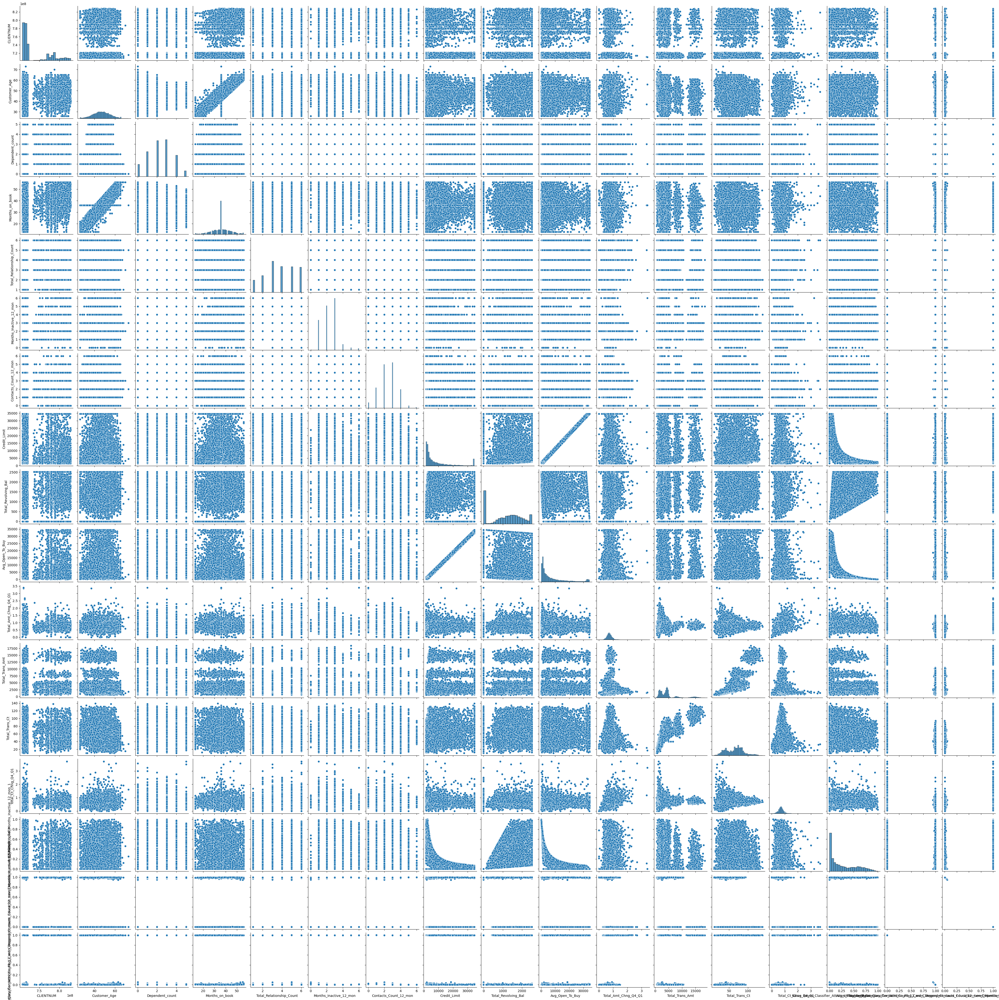

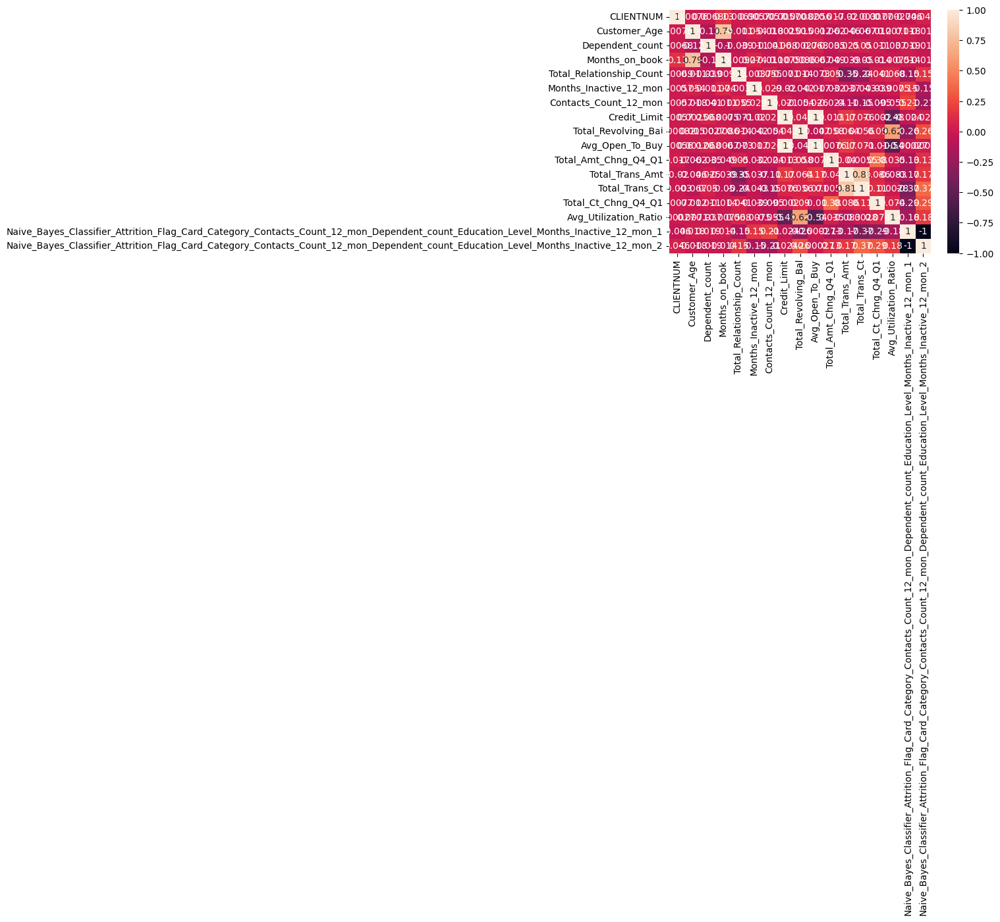

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Pairplot for all numerical features
sns.pairplot(file.select_dtypes(include=['int64', 'float64']))
plt.show()

# Heatmap for correlations
sns.heatmap(file.corr(), annot=True)
plt.show()


In [ ]:
file['PD'].fillna("LIGHT",inplace=True)
#veryfying if null values have been filled and inconsistencies are removed
file['PD'].unique()

array(['LIGHT'], dtype=object)

DC - Column

In [ ]:
#In Distribution Center of phillips, we can see there are inconsistencies as well as missing values
file['DC'].unique()

#since there are more counts of PROF, so we will replace Prof by PROF
file['DC'].value_counts()

CONS    194743
PROF     28135
Prof       425
Name: DC, dtype: int64

In [ ]:
#handling inconsistency
file['DC']=file['DC'].replace('Prof','PROF')

In [ ]:
#since the products are being distributed from the center, one startegy we can do is to map them with the customer name to find where they are usually supllied the product from
#and then fill the missing values according to that
file[file['DC'].isna()]

,PD,DC,MONTH,YEAR,Customer Code,Customer Name,CITY,Invoice #,Invoice Date.2,12NC CODE,...,Amount,Sales Tax,Gross Amount,BG Code,BU,BG NAME,Sub BG,Order Date,Order #,OFFICE NAME
158133,LIGHT,NaN,NaN,2013,92000039,NATIONAL ENGINEERING COMPANY,KARACHI,NaN,NaT,NaN,...,NaN,NaN,8.232790e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN
158134,LIGHT,NaN,NaN,2013,92000060,PESCO 1,NOWSHERA,NaN,NaT,NaN,...,NaN,NaN,9.500000e+02,NaN,NaN,NaN,NaN,NaN,NaN,NaN
158135,LIGHT,NaN,NaN,2013,92000096,PEPCO - PAKISTAN ELECTRIC POWER COM,LAHORE,NaN,NaT,NaN,...,NaN,NaN,2.800000e+09,NaN,NaN,NaN,NaN,NaN,NaN,NaN
158136,LIGHT,NaN,NaN,2013,92000101,METRO HABIB CASH & CARRY PAKISTAN,LAHORE,NaN,NaT,NaN,...,NaN,NaN,1.597568e+07,NaN,NaN,NaN,NaN,NaN,NaN,NaN
158137,LIGHT,NaN,NaN,2013,92000103,PAKISTAN SECURITY PRITING,KARACHI,NaN,NaT,NaN,...,NaN,NaN,6.713679e+05,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
158649,LIGHT,NaN,NaN,2013,92000971,AQIB LIGHT HOUSE,PESHAWAR,NaN,NaT,NaN,...,NaN,NaN,1.000350e+07,NaN,NaN,NaN,NaN,NaN,NaN,NaN
158650,LIGHT,NaN,NaN,2013,92000972,A.R.ENTERPRISES KARACHI,KARACHI,NaN,NaT,NaN,...,NaN,NaN,5.003637e+07,NaN,NaN,NaN,NaN,NaN,NaN,NaN
158651,LIGHT,NaN,NaN,2013,92000973,AL-HIJAZ ENTERPRISES,LAHORE,NaN,NaT,NaN,...,NaN,NaN,1.074260e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN
158652,LIGHT,NaN,NaN,2013,92000974,AYAN ENTERPRISES (REL & TRADE LUMN),RAWALPINDI,NaN,NaT,NaN,...,NaN,NaN,2.852990e+07,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# New Section

In [ ]:
#list of those that were duplicate in data and can be mapped
prof_cust = ['PC HOTEL KARACHI', 'THE EDUCATORS', 'DGWR PAKISTAN NAVY', 'FATIMA FERTILIZER COMPANY LIMITED','SIZA FOODS (PVT) LIMITED', 'FAUJI FERTILIZER CO.LTD. (FFC)', 'KAIF TRADERS', 'DIN SONS',
            'DOLMEN PRIVATE LTD','KARSAZ INTERNATIONAL', 'GADOON TEXTILE MILLS LIMITED', 'NATIONAL BANK OF PAKISTAN','AAA-RAK JOINT VENTURE', 'CANTEEN STORES DEPTT', 'CANTONMENT BOARD CLIFTON',
            'AVARI HOTELS LIMITED', 'M.M. ENTERPRISES', 'PROFESSIONAL LIGHTING SERVICES','SIEMENS PAK. ENGG. CO', 'M/S WAZIR AHMED CO', 'JAMSHORO POWER COMPANY','JAVEDAN CORPORATION LIMITED (TP&S)',
            'SARTAJ ELECTRIC COMPANY','CENTRAL ORDANCE DEPOT ARMY (KAR)', 'AGHA KHAN HOSPITAL', 'MARRIOTT KARACHI','ZAMINS ENGINEERING SERVICES', 'MS ELECTRIC SERVICES', 'ASIA TECH LIGHTING',
            'JASCO INTERNATIONAL .PROF.LIGHT.', 'ZIAI LIGHTING', 'GAM CORPORATION (PVT) LIMITED','ABBASI SHAHEED HOSPITAL', 'LIAQUAT NATIONAL HOSPITAL', 'HBH COMPANY','KESTRAL SPD (PVT) LIMITED',
            'M.TALIB ENTERPRISE', 'SADIQ FEEDS (PVT) LIMITED','G E AIR (PAF)', 'PAKISTAN CRICKET BOARD', 'PEARL CONTINENTAL HOTEL BHURBAN','LIGHTO POWER', 'MIMA & BROS', 'TPL PROPERTIES PVT LTD',
            'YELLOW','ARTISTIC MILLINERS (PVT) LTD', 'THE KIDNEY CENTRE', 'TEKCELLENT PVT LIMITED','SUMAIR ELECTRIC STORE', 'CLASSIC LIGHTING SOLUTIONS', 'NAZEER & SONS','MEHR PATWALLA SONS',
            'ADNAN ENTERPRISES', 'TMA GULBERG TOWN', 'THE CITY SCHOOL','SHAMIM AGRICULTURE FARAM', 'UNILEVER PAKISTAN LIMITED.', 'S.M.ENGINEERING','K.K SHAHZAD & CO', 'LIGHT CENTRE', 'STYLO SHOES',
            'CAPITAL BUILDERS','AHMED & SONS', 'PACIFIC BUSINESS ASSOCIATES', 'OMV PAKISTAN','TOTAL PARCO PAKISTAN LTD.', 'MA SATTAR & SONS', 'ASIM ENTERPRISES (PROF.)', 'PARADISE LIGHTING (PROF.)',
            'ISLAMABAD CLUB ISLAMABAD', 'A&B GENERAL ORDER & SUPPLIER','SCHNEIDER ELECTRIC PAKISTAN PVT', 'ELITE ENGINEERING PVT LTD','NATIONALL REFINERY LIMITED', 'BANU MUKHTAR CONTRACTING PVT LTD',
            'KING ENTERPRISES','TOWN MUNICIPAL ADMINISTRATION', 'NATIONAL ENGINEERING COMPANY','ONE TIME CUSTOMER PAKISTAN','FAUJI FERTILIZER BIN QASIM LIMITED','HOUSING DIRECTORATE ARMY CHQ. RWP']

cons_cust=['INTERNATIONAL FANCY LIGHT', 'HAQ TRADERS', 'CHANDNI DISTRIBUTORS', 'SHAHID BROTHERS', 'STAR ENTERPRISES (HID LAMPS)', 'WAHID ELECTRIC STORE', 'HAMZA MARKETING', 'SHAHEEN TRADERS',
           'HILAL ELECTRIC STORE', 'LITE LINE AGENCY', 'MISC DIRECT SALES .STAFF', 'RAVI MARKETING', 'A-T-H-ENTERPRISES', 'MALIK ARIF KARYANA MARCHANT', 'ABUBAKAR TRADERS', 'M.J DISTRIBUTOR',
           'IRFAN TRADERS', 'HAFIZ AHSAN ELAHI', 'GOLDEN AGENCIES', 'INTERNATIONAL LIGHTING CENTRE', 'TAQ ENTERPRISES', 'RAHIM ELECTRIC STORES', 'M & S ENTERPRISES', 'QAMAR ELECTRIC', 'SUBHAN TRADERS',
           'FEROZI ELECTRIC STORE', 'MAKRO SADDAR STORE', 'PAK TRADERS', 'AWAN MARKETING SERVICES', 'ZUBAIR TRADERS (TLD)', 'A-ONE TRADERS', 'JUBLEE LIGHT HOUSE', 'ATTIQUE ELECTRIC STORE (HID)',
           'KHURRAM ENTERPRISES', 'WALEED TRADERS', 'SETHI ELECTRICAL STORE', 'ALI TRADERS (M)', 'WASEEM BROTHER', 'ARSHAD & CO.', 'WALEED TRADERS', 'FARAZ ENTERPRISES', 'MILLAT TRADERS', 'TANZEEL TRADERS',
           'SAJJAD ELECTRIC & SANITARY STORE', 'INTERNATIONAL MARKETING SERVICES', 'CHARAGH TRADERS', 'SIERRA-LED', 'NOOR DISTRIBUTOR', 'ABBAS TRADERS', 'KHALIL ELECTRIC', 'MUHAMMAD FAROOQ TRADERS',
           'SHEWA RAM & SONS', 'MUGHAL ELECTRIC STORE', 'ZUBAIR DISTRIBUTORS', 'AJMAL TRADERS', 'RAUSHAN ELECTRIC STORES', 'JASCO INTERNATIONAL', 'ROYAL TRADERS', 'TRIPLE R ENTERPRISES', 'M.M TRADERS',
           'METRO CASH & CARRY', 'ALI TRADERS (A)', 'SHAHBAZ TRADERS', 'ASIM ENTERPRISES', 'NOVELTY MARKETING SERVICES', 'RAJAB ALI BROTHERS', 'ELECTRO LIGHT', 'AL MUSTAFA ELECTRIC TRADERS',
           'DYNAMIC LIGHTING', 'METRO CASH & CARY ISLAMABAD', 'INSAF ELECTRIC STORE', 'MAHROSH MARKETING SERVICES', 'S.M.BASHIR AGENCIES', 'HAJI ABDUL MALIK GENERAL STORE', 'IQBAL RADIO SERVICE',
           'ARSLAN TRADERS', 'HAMMAD TRADERS', 'PARADIZE TRADERS', 'IFTIKHAR & SONS (REL)', 'TUFAIL SONS TRADERS', 'MEMON ENTERPRISES', 'CHOUDHARY ELECTRONICS', 'Z.A. TRADERS', 'A.A ENTERPRISES',
           'PROFESSIONAL TRADERS', 'FASAIL ENTERPRISE', 'PANTHER DISTRIBUTORS', 'INDUS DISTRIBUTION CENTRE', 'NEW NATIONAL ELECTRONICS CENTRE', 'STAR ENTERPRISES', 'MINHAL ENTERPRISES','MEER TRADERS',
           'ALLIED DISTRIBUTORS', 'NASEEM LIGHT CENTRE', 'ALLIED TRADING COMPANY', 'SYED SONS', 'SWIFT LINK DISTRIBUTION', 'SHAN ELECTRIC STORE', 'THE STAR TRADERS', 'ZUBAIR TRADERS (HID SPECIAL LAMP)',
            'AL-REHMAN ELECTRICAL TRADERS', 'ISLAMABAD LIGHTS', 'HAYAT TRADERS', 'LITELOGY', 'M.M.TRADERS KARACHI', 'INTERNATIONAL LIGHT HOUSE', 'EHSAN TRADERS', 'S.S. ENTERPRISES', 'UJALA ENTERPRISES',
            'RAH ENTERPRISES', 'UNTED DISTRIBUTORS', 'IMRAN ENTERPRISES', 'AHMED TRADERS', 'SHOUKAT AND BROTHERS', 'METRO MULTAN ROAD LAHORE', 'AAMIR TRADERS', 'SUMAN ASSSOCIATES', 'AQIB LIGHT HOUSE',
            'SANI DISTRIBUTOR', 'FAIZAN TRADERS', 'MEHRAN INTERNATIONAL - 1', 'MAF HYPPERMARKETS PVT LTD', 'AL-REHMAN DISTRIBUTER', 'A.R.ENTERPRISES KARACHI', 'AL-HIJAZ ENTERPRISES', 'HAMZA ENTERPRISES (LAHORE)',
            'AYAN ENTERPRISES (REL & TRADE LUMN)', 'NATIONAL TRADERS', 'JAVED AGNCIES', 'WAQAS AZHAR', 'FAHEEM TRADERS', 'ROSHNI DISTRIBUTORS','HYPERSTAR KARACHI', 'GLOBAL MARKETING SERVICES', 'SHEIKH TRADERS',
            'MADINA TRADERS', 'AL QASIM ENTERPRISES', 'ITTEFAQ TRADERS', 'HUSSAIN TRADERS', 'BILAL TRADERS', 'GLOBAL SERVICES & TRADING HOUSE' ]

file.loc[file['DC'].isna() & (file['Customer Name'].isin(prof_cust)), 'DC'] = 'PROF'
file.loc[file['DC'].isna() & (file['Customer Name'].isin(cons_cust)), 'DC'] = 'CONS'

In [ ]:
#the ones that need to be deleted considering they don't have any duplicated values from which i can map from, also more than 70% of the roow is empty so better to delete
delcol=['TOWN MUNICIPAL ADMIN. IQBAL TOWN','HATIMI VALVES & FITTINGS','PESCO 1','PEPCO - PAKISTAN ELECTRIC POWER COM','METRO HABIB CASH & CARRY PAKISTAN','TOWN MUNICIPAL ADMIN.AZIZ BHATTI','DELTA ENGINEERING SERVICES',
        'Metro - Habib Cash & Carry Pakistan','M/S MUKHTAR MANGI & BROTHERS','Metro – Habib Cash & Carry Pakistan','TMA PAKPATTAN','BYCO OIL PAKISTAN LIMITED','THAL LIMITED ENGINEERING DIVISION','K. MOIZ & ASSOCIATES',
        'HASSAN ENTERPRISES','MOIZ ASGHAR ALI','AAA ENTERPRISES','HYDERABAD ELECTRICAL CO.(HESCO)','TEHSIL MUNICIPAL ADMINIST.SARAI','MEHRAM TRADERS','CLARIANT PAKISTAN LIMITED','HEERA ELECTRIC WORKS',
        'STAFF SALES MELA-LIGHT','DEFENCE AUTHORITY COUNTRY & GOLF','THE UNIVERSITY OF LAHORE','PEARL CONTINENTAL HOTEL','AZAN ELECTRIC & CO','UNIBUILD ASSOCIATES (PVT) LTD','LUCKY ONE PRIIVATED LIMITED',
        'PAKISTAN SECURITY PRITING','ALLAINCE MARKETING SERVICES', 'AL-AHMAD ENTERPRISES', 'THE DAWOOD FOUNDATION', 'INTERNATIONAL LIGHTING SYSTEM', 'TRAFFIC ENG. & TRAN. PLANNING','ALAM TRADERS','DEFENCE CREEK CLUB KARACHI D.H.A.',
        'ALLMED SOLUTIONS','TAMEER ASSOCIATES','USMANI ASSOCIATES','CHAUDHRY LAMPS SERVICE','TMA RAHIM YAR KHAN','ZAFFAR ENTERPRISE','HASHMI ENTERPRISES','COTTON CRAFT (PVT) LIMITED','SALAMAT SCHOOL SYSTEM (PVT) LTD',
       'MAKKAH TRADERS','SHAYAN TRADERS','MEHRUNNISA WELFARE TRUST','SUKKUR INSTITUTE OF BUSINESS','LOTIA SONS PVT LTD','HASSAN TRADERS','TMA SAMANABAD LAHORE','M.Z AWAN & SONS','MARINE SERVICES (PVT) LIMITED','NISAR TRADERS',
       'QAVI ENGINEERS PVT LIMITED','ITTEHAD ENGINEERING & CONSTR (PVT)','R & R ENGINEERING ASSOCIATES','DI-TECH ENGINEERING SERVICES','ABDUL GHAFFAR & SONS','NOVARTIS PHARMA (PAKISTAN) LIMITED','NOVARTIS PHARMA (PAKISTAN) LIMITED',
       'PAK ELEKTRON LIMITED (KARACHI)','FORESENIC DESIGN (PROF.)','SHAMIM SUGAR MILLS (PVT) LTD','ASSOCIATED TECHNOLOGIES','PAKISTAN TELEVISION CORP. PTV','ELECTRA TRADERS','ACCRESCENT ENGINEERS','D.R-CONSTRUCTION CO. (FOR IBA KU)',
       'FAMOUS ELECTRIC','STEELMAN INTERNATIONAL ENGINEERS','KB INTERNATIONAL','WHITE ROSE PVT. LIMITED','MOON INTERNATIONAL','HYDRO SAFE','I.H ENTERPRISES','MJA ARCHITECTS','DLEEP GERNAL STORE','CANTONMENT EXECUTIVE OFFICER','FARAH ELECTRIC SERVICES',
        'ROTOCAST ENGINERING CO. PVT. LTD','AL-HAMD ENGINEERS & CONTRACTORS','S.M. KAZMI CONSTRUCTION','BELTEXCO LIMITED','KAMIL DISTRIBUTORS','LIAQAT PAPER AND STATIONERY MART','IMRAN TRADERS','FAUJI FERTILIZER COMPANY LIMITED',
       'GIZELLE COMMUNICATIONS','PHILIP MORRIS PAKISTAN LIMITED','ZOOM ENGINEERS','S.Q. DISTRIBUTORS - I','THERMEC ENGINEERING COMPANY','SAWIRA INTERNATIONAL','OPTEC LIGHTING & SYSTEMS','KINGCRETE BUILDERS',
       'ASIA PETROLIUM LIMITED','ASIA PETROLEUM LIMITED (TKY)','ROYAL ENTERPRISES (PROF.)','SHAFIQ CONSTRUCTION COMPANY','FIBREGLASS DESIGNER','KADIOGLU GLOBAL CONSTRUCTION','D.G KHAN CEMENT CO LTD',
       'METRO CASH & CARY SARGODA ROAD','ADEEL ELECTRIC & GENERAL STORE','HARAJ ELECTRICAL CONSTRUCTION','CAPT.KARNAL SHER KHAN','INTERNATIONAL COMPLEX PROJECTS','SHAHEED ZULFIKAR ALI BHUTTO','PEBBLES (PVT) LIMITED',
       'NATIONAL LOGISTIC CELL (NLC) GHQ','PSO PROJECT','PAKISTAN TELECOMMUNICATION COMPANY','FAUJI OIL TERMINAL & DIST. CO. LTD.','SOORTY ENTERPRISES PVT LTD','ARTISTIC FABRIC MILLS (PVT) LTD',
      'PEPSI-COLA INTERNATIONAL (PVT)LTD.','RIASAT ALI GOVERNMENT CONTRACTOR','PROTECH','A. RAHIM FOODS (PVT) LIMITED','FIELD ENGINEERS','ARTISTIC MILLINERS (X)','SHER ALI & BROTHERS','ORIENT ENERGY SYSTEMS (PVT) LIMITED','S.M & CO.',
      'NAVEENA EXPORTS LIMITED','MLS BUILDING SYSTEMS','PAKISTAN SYNTHETICS LIMITED','BUILDERS ASSOCIATES PVT LTD','PACE PAKISTAN LIMITED','PAKISTAN SERVICES LIMITED','SHAMA CORPORATION','TUWAIRQI STEEL MILLS LIMITED','ROSHNI HEE ROSHNI',
      'PAKISTAN SAFETY GLASS (PVT) LTD','MOL PAKISTAN OIL & GAS CO. BV.','BZ ENTERPRISES','S.I.S.ENGINEERING SERVICES','S. MAQSOOD ASSOCIATES','PAK. ORDINANCE FACTORIES (P.O.F.)','KARACHI INTL CONTAINER TERMINAL','MISC DIRECT SALES LIGHT.KARACHI',
      'LUCKY TEXTILE MILLS LTD','FAZAL TEXTILE MILLS LTD.','LAKHRA POWER GENERATION COMPANY','QAZI ELECTRIC AGENCY','BASIT TRADERS','ISLAMABAD SERENA HOTEL','KHALID MARWAT GORAKKA ELECTRIC','SUPER STAR ELECTRIC STORE',
       'CONCRETE MASTER','ALLIED ENGINEERING AND SERVICES','INTERNATIONAL TEXTILE LIMITED','STOC ENTERPRISE','DIGITS & BYTES.','DAWLANCE (PRIVATE) LIMITED','MULTAN FEEDS','SAMBU CONSTRUCTION CO. LTD.','QUALITY (PVT) LIMITED',
       'M/S AFTAB AHMED TAHIR','PAK. DEFENCE OFFICERS HOUSING','BANK AL HABIB LIMITED','PAKARAB FERTILIZERS (PVT) LTD.','DEWAN CEMENT LIMITED','IRSHAD IRON WORKS (IIW)','SADIA RIZWAN & ASSOCIATES','SUNNY BUILDERS','TECHNOLOGIX TRADERS',
       'M-TECH (MULTI TECHNOLOGY) (PVT)','TARSEEL (PVT) LTD','AL-MAJEED PETROLEUM','REDCO CONSTRUCT PVT LTD','SH. ATTA MOHD. ABDUL SALAM','RIMTAJ INDUSTRIES MG (PVT) LTD','NORTHERN ENGINEERING CORPORATION',
        'AL-IBRAHIM EYE HOSPITAL','TMA NISHTAR TOWN,LAHORE (I & S)','FAHEEM ENTERPRISES','SADIQ POULTRY (PVT) LIMITED','MISC DIRECT SALES (REGISTERED)','NADEEM CONSTRUCTION CO.','AL TECHNIQUE CORPORATION OF PAK LTD','AL HAMAD ENTERPRISE & ENGINEERING',
        'ENVIRONMENTAL ENGINEERING CENTRE','NOVATEX LIMITED','ENGRO POWERGEN QADIRPUR LIMITED','CANTONMENT BOARD PESHAWAR','MAKRO HABIB PAKISTAN LTD','NATIONAL HOCKEY STADIUM','CONSULTRONIX INTERNATIONAL (PVT)',
        'ENVIRONMENTAL ENGINEERING CENTRE','AMIN ENTERPRISES','REHMAN MEDICAL INSTITUTE (PVT)','ALI TRADERS (G)','IZHAR (PVT) LIMITED','THE QUETTA DISTRIBUTERS','HABIB RAFIQ (PVT) LIMITED','AHMED ORIENTAL TEXTILE MILLS',
        'P.E.I STAFF SALES','AHMED ORIENTAL TEXTILE MILLS','ZAIN ELECTRIC COMPANY','GLOBEL MARKETING SERVICES','SIGN AD','S.M.ZAMAN TRADERS','IJAZ QUTAB & SONS','MECATECH (PVT) LIMITED','KARACHI ELECTRIC SUPPLY COMPANY',
        'FIBER GLASS SERVICES','QUALITY BUILDERS LTD.','MARGALA ELECTRIC CO.','PAKISTAN STATE OIL HOUSE','CREATIVE CONSTRUCTION','FAREED CO (PVT) LIMITED','YASIR ENTERPRISES','MADINA ELECTRIC','THE HUB POWER COMPANY LIMITED','IBRAHIM TEXTILES MILLS LTD.',
        'TMA MADINA TOWN FAISALABAD','RANYAL TEXTILES','POWER CONCERN','UMER FARMS (PVT) LIMITED','PROGRESSIVE INTERNATIONAL','THE PROGRESSIVE DISTRIBUTORS','S. S. ELECTRIC WORKS','SHOUKAT KHAN AND COMPANY',
        'N. A. ELECTRIC CONCERNS','CENTRAL ORDANANCE DEPOT ARMY (RWP)','ATCON','ARCIKA TRADERS & CONTRACTORS','F.O.C. STAFF SALES FIVE-YEAR','MUSAFA INTERNATIONAL (PVT) LIMITED','PACIFIC ENGINEERING SERVICES',
         'TRIPLE TREE ASSOCIATES','ENGRO FERTILIZER LIMITED','FREEZOL INTERNATIONAL (PVT) LTD.','SHAMSI BUILDER LTD','AFAQ TRADERS','H.S.MARKETING SERVICES','INTERNATIONAL LIGHTING CENTER','NEW SPEEDWAY CONSTRUCTION','AFAQ TRADERS',
         'QUTBI SUPPLY AGENCY','TUFAIL ELECTRIC STORE','MANAGEMENT CONSULTANTS ENG &','K.U ELECTRIC WORKS','HAJI HABIB & SONS','SHAIKH ABDULLAH & SONS','MIAN MARKETING','PAK LITON ASSOCIATES','ETIMAAD ENGINEERING PVT LTD',
         'KASHIF ENTERPRISES','SULTAN CONSTRUCTION COMPANY','SULTAN CONSTRUCTION COMPANY','5-ENGINEER BATTALION','M.B ENGINEERS & CONTRACTORS','MUSLIM COMMERCIAL COMPANY','ALLIED BANK LIMITED','HABIB METROPOLITAN BANK LIMITED',
          'SHELL PAKISTAN LIMITED','PAKISTAN INT CONTAINER TERMINAL','S.K. BUILDERS','ANR TRADERS','CHINA INTERNATIONAL WATER & ELEC','SAGHIR TRADERS','ASHIQ SALEEM','INDIGO TEXTILE (PVT) LTD','LIGHT TRADERS',
          'SAIF TEXTILE MILLS LIMITED','ENVOY FACILITATION SERVICES PVT LTD','SAIF TEXTILE MILLS LIMITED','LIGHT TRADERS','ALI RAZA GENERAL STORE','AL ASIM ENTERPRISES','GHULAM SIDDIQUE GHULAM HABIB','M. BABAR ELECTRIC ENTERPRISE',
          'AL SHAMAS TRADERS','DIN MOHAMMAD SHAKIR AND COMPANY','PAK ARAB ENGINEERING COMPANY','JAMMY TECH (PVT) LIMITED','S.A. TRADERS','KHAADI','ENGRO POLYMER & CHEMICALS LTD','INTERNATIONAL CENTER (PANJWANI','DEFENCE OFFICERS HOUSING SCHEME',
          'DIN LEATHER (PVT) LIMITED','DIN TEXTILE MILLS LIMITED','MEMON HEALTH & EDUCATION FOUNDATION','TARIQ SIDDIQ & BROTHERS','TABISH ASSOCIATES','METRO CASH & CARY DEFFENCE ROAD','G.E. Army',
          'SHAMSHER KHAN & CO.','MUSTAQIM DYEING & PRINTING PVT.','INTEGRATED GRAPHIX','CITY DISTRICT GOVERNMENT LAHORE','SHAMS PETROLEUM SERVICE','FATHI ULLAH ELECTRIC STORE','NLC ENGRS',
          'NEW SOLAR MARKETING SERVICES (REL)','BLTB CONSTRUCTION COMPANY']

#deleting rows because more than 70% of the row is empty, also there weren't any duplicate values for them acc to which i could have mapped them
file = file.loc[~file['Customer Name'].isin(delcol)]
#indexes that were having problem to be deleted, hence deleted them by their index location
index_to_delete = [158210,158361,158511]
file = file.drop(index_to_delete)

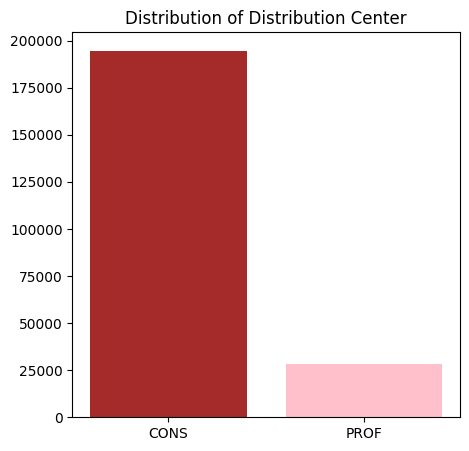

In [ ]:
#we can see that phillips make the most distributions from CONS (consolidation center) rather than PROFS (profit center)
#can be because they might be located closer to Phillips' suppliers, enabling faster supply chain operations, optimizing transportation routes,
#and reducing overall logistics costs compared to the profit center (PROFS).
plt.figure(figsize=(5,5))
dccounts = file['DC'].value_counts()
plt.bar(dccounts.index, dccounts.values,color=['brown', 'pink'])
plt.title('Distribution of Distribution Center')
plt.show()

In [ ]:
#verifying if inconsistencies have been removed and null values have been filled
file['DC'].unique()

array(['CONS', 'PROF'], dtype=object)

MONTH - Column

In [ ]:
file['MONTH'].unique()

array(['JANUARY', 'FEBRUARY', 'MARCH', 'APRIL', 'MAY', 'JUNE', 'JULY',
       'AUGUST', 'SEPTEMBER', 'OCTOBER', 'NOVEMBER', 'DECEMBER', 'AUG',
       nan, 'NOV'], dtype=object)

In [ ]:
#handling inconsistencies and replacing months name to their short forms so there can be proper visulaization in charts with short names
file['MONTH']=file['MONTH'].replace('JANUARY','JAN')
file['MONTH']=file['MONTH'].replace('FEBRUARY','FEB')
file['MONTH']=file['MONTH'].replace('AUGUST','AUG')
file['MONTH']=file['MONTH'].replace('SEPTEMBER','SEPT')
file['MONTH']=file['MONTH'].replace('OCTOBER','OCT')
file['MONTH']=file['MONTH'].replace('NOVEMBER','NOV')
file['MONTH']=file['MONTH'].replace('DECEMBER','DEC')

In [ ]:
file[file['MONTH'].isna()]

,PD,DC,MONTH,YEAR,Customer Code,Customer Name,CITY,Invoice #,Invoice Date.2,12NC CODE,...,Amount,Sales Tax,Gross Amount,BG Code,BU,BG NAME,Sub BG,Order Date,Order #,OFFICE NAME
158133,LIGHT,PROF,NaN,2013,92000039,NATIONAL ENGINEERING COMPANY,KARACHI,NaN,NaT,NaN,...,NaN,NaN,8.232790e+04,NaN,NaN,NaN,NaN,NaN,NaN,NaN
158139,LIGHT,PROF,NaN,2013,92000105,NATIONALL REFINERY LIMITED,KARACHI,NaN,NaT,NaN,...,NaN,NaN,6.961500e+03,NaN,NaN,NaN,NaN,NaN,NaN,NaN
158140,LIGHT,PROF,NaN,2013,92000108,BANU MUKHTAR CONTRACTING PVT LTD,LAHORE,NaN,NaT,NaN,...,NaN,NaN,7.289590e+03,NaN,NaN,NaN,NaN,NaN,NaN,NaN
158141,LIGHT,PROF,NaN,2013,92000112,SCHNEIDER ELECTRIC PAKISTAN PVT,KARACHI,NaN,NaT,NaN,...,NaN,NaN,6.211031e+06,NaN,NaN,NaN,NaN,NaN,NaN,NaN
158142,LIGHT,PROF,NaN,2013,92000116,ELITE ENGINEERING PVT LTD,LAHORE,NaN,NaT,NaN,...,NaN,NaN,6.312709e+05,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
158649,LIGHT,CONS,NaN,2013,92000971,AQIB LIGHT HOUSE,PESHAWAR,NaN,NaT,NaN,...,NaN,NaN,1.000350e+07,NaN,NaN,NaN,NaN,NaN,NaN,NaN
158650,LIGHT,CONS,NaN,2013,92000972,A.R.ENTERPRISES KARACHI,KARACHI,NaN,NaT,NaN,...,NaN,NaN,5.003637e+07,NaN,NaN,NaN,NaN,NaN,NaN,NaN
158651,LIGHT,CONS,NaN,2013,92000973,AL-HIJAZ ENTERPRISES,LAHORE,NaN,NaT,NaN,...,NaN,NaN,1.074260e+08,NaN,NaN,NaN,NaN,NaN,NaN,NaN
158652,LIGHT,CONS,NaN,2013,92000974,AYAN ENTERPRISES (REL & TRADE LUMN),RAWALPINDI,NaN,NaT,NaN,...,NaN,NaN,2.852990e+07,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#the 3 strategies i am opting for is to see if their is a duplicate data for the customer name of the same year then i will fill the month with the month of the duplicate value
#else if month is not there for the duplicate value then i will use the invoice date or order date to fill in the month
#since their are 2 extra months column, one of the strategy is to use locf strategy and if there is value in the month # or Month column then wil copy to the column MONTH
#if no dupliacte value, or value in invoice date or month # or Month, then i will drop the row if more than 70% data in the row is empty

file[(file['Customer Name']=='AL-HIJAZ ENTERPRISES') & (file['YEAR']==2013)] #through this line of code first saw if any duplicates or any matching in any way of every customer name in above table,
#when none found then added the names in the list below and deleted them because more than 70% f the data is missing

mdel=['NATIONAL ENGINEERING COMPANY','NATIONALL REFINERY LIMITED','BANU MUKHTAR CONTRACTING PVT LTD','SCHNEIDER ELECTRIC PAKISTAN PVT','ONE TIME CUSTOMER PAKISTAN','AL-HIJAZ ENTERPRISES'
      'ELITE ENGINEERING PVT LTD','AQIB LIGHT HOUSE','A.R.ENTERPRISES KARACHI','AYAN ENTERPRISES (REL & TRADE LUMN)','MEHRAN INTERNATIONAL - 1','AAMIR TRADERS','METRO MULTAN ROAD LAHORE',
      'SUMAN ASSSOCIATES','SANI DISTRIBUTOR','FAIZAN TRADERS','RAH ENTERPRISES','UNTED DISTRIBUTORS','IMRAN ENTERPRISES','AHMED TRADERS','SHOUKAT AND BROTHERS','UJALA ENTERPRISES','SWIFT LINK DISTRIBUTION',
      'S.S. ENTERPRISES','EHSAN TRADERS','INTERNATIONAL LIGHT HOUSE','TOTAL PARCO PAKISTAN LTD.','ISLAMABAD LIGHTS','ZUBAIR TRADERS (HID SPECIAL LAMP)','THE STAR TRADERS','PACIFIC BUSINESS ASSOCIATES',
      'ALLIED DISTRIBUTORS','CAPITAL BUILDERS','NASEEM LIGHT CENTRE','ALLIED TRADING COMPANY','GLOBAL MARKETING SERVICES','JAVED AGNCIES','SYED SONS','STYLO SHOES','TANZEEL TRADERS','A.A ENTERPRISES',
      'MADINA TRADERS','HYPERSTAR KARACHI','NATIONAL TRADERS','MINHAL ENTERPRISES','K.K SHAHZAD & CO','LIGHT CENTRE','PANTHER DISTRIBUTORS','PROFESSIONAL TRADERS','MEMON ENTERPRISES','TMA GULBERG TOWN',
      'THE CITY SCHOOL','UNILEVER PAKISTAN LIMITED.','PARADIZE TRADERS','ADNAN ENTERPRISES','HAMMAD TRADERS','FAUJI FERTILIZER BIN QASIM LIMITED','MEHR PATWALLA SONS','CLASSIC LIGHTING SOLUTIONS',
      'SUMAIR ELECTRIC STORE','TEKCELLENT PVT LIMITED','TPL PROPERTIES PVT LTD','YELLOW','LIGHTO POWER','M.TALIB ENTERPRISE','SADIQ FEEDS (PVT) LIMITED','NOVELTY MARKETING SERVICES',
      'ASIM ENTERPRISES','HBH COMPANY','JASCO INTERNATIONAL','HUSSAIN TRADERS','JASCO INTERNATIONAL .PROF.LIGHT.','AJMAL TRADERS','ASIA TECH LIGHTING','MUGHAL ELECTRIC STORE','BILAL TRADERS',
      'ZUBAIR DISTRIBUTORS','ZIAI LIGHTING','MS ELECTRIC SERVICES','SHEWA RAM & SONS','GLOBAL SERVICES & TRADING HOUSE','ITTEFAQ TRADERS','SHEIKH TRADERS','ZAMINS ENGINEERING SERVICES','SIERRA-LED',
      'MARRIOTT KARACHI','AGHA KHAN HOSPITAL','MILLAT TRADERS','FARAZ ENTERPRISES','WASEEM BROTHER','WALEED TRADERS','FAHEEM TRADERS','AL QASIM ENTERPRISES','JAVEDAN CORPORATION LIMITED (TP&S)',
      'ZUBAIR TRADERS (TLD)','ATTIQUE ELECTRIC STORE (HID)','PAK TRADERS','FEROZI ELECTRIC STORE','SIEMENS PAK. ENGG. CO','RAHIM ELECTRIC STORES','M/S WAZIR AHMED CO','HAMZA ENTERPRISES (LAHORE)',
      'M & S ENTERPRISES','INTERNATIONAL LIGHTING CENTRE','GOLDEN AGENCIES','AVARI HOTELS LIMITED','AL-REHMAN DISTRIBUTER','CANTONMENT BOARD CLIFTON','AAA-RAK JOINT VENTURE','IRFAN TRADERS',
      'DIN SONS','PC HOTEL KARACHI','HAQ TRADERS','MISC DIRECT SALES .STAFF','MALIK ARIF KARYANA MARCHANT','INTERNATIONAL FANCY LIGHT','THE EDUCATORS','CHANDNI DISTRIBUTORS','DGWR PAKISTAN NAVY',
      'SHAHID BROTHERS','FATIMA FERTILIZER COMPANY LIMITED','STAR ENTERPRISES (HID LAMPS)','HAMZA MARKETING','WAHID ELECTRIC STORE','KAIF TRADERS','SIZA FOODS (PVT) LIMITED','FAUJI FERTILIZER CO.LTD. (FFC)',
      'DOLMEN PRIVATE LTD','KARSAZ INTERNATIONAL','SHAHEEN TRADERS','LITE LINE AGENCY','HILAL ELECTRIC STORE','A-T-H-ENTERPRISES','RAVI MARKETING','GADOON TEXTILE MILLS LIMITED','NATIONAL BANK OF PAKISTAN',
      'CANTEEN STORES DEPTT','ABUBAKAR TRADERS','M.J DISTRIBUTOR','HAFIZ AHSAN ELAHI','M.M. ENTERPRISES','SUBHAN TRADERS','PROFESSIONAL LIGHTING SERVICES','TAQ ENTERPRISES','QAMAR ELECTRIC',
      'JAMSHORO POWER COMPANY','MAKRO SADDAR STORE','JUBLEE LIGHT HOUSE','A-ONE TRADERS','ALI TRADERS (M)','SETHI ELECTRICAL STORE','KHURRAM ENTERPRISES','AWAN MARKETING SERVICES','ARSHAD & CO.',
      'SARTAJ ELECTRIC COMPANY','SAJJAD ELECTRIC & SANITARY STORE','CENTRAL ORDANCE DEPOT ARMY (KAR)','INTERNATIONAL MARKETING SERVICES','ELITE ENGINEERING PVT LTD','ABBAS TRADERS','KHALIL ELECTRIC',
      'NOOR DISTRIBUTOR','CHARAGH TRADERS','GAM CORPORATION (PVT) LIMITED','MUHAMMAD FAROOQ TRADERS','RAUSHAN ELECTRIC STORES','TRIPLE R ENTERPRISES','ROYAL TRADERS','LIAQUAT NATIONAL HOSPITAL',
      'ABBASI SHAHEED HOSPITAL','METRO CASH & CARRY','M.M TRADERS','ALI TRADERS (A)','SHAHBAZ TRADERS','RAJAB ALI BROTHERS','KESTRAL SPD (PVT) LIMITED','ELECTRO LIGHT','AL MUSTAFA ELECTRIC TRADERS',
      'G E AIR (PAF)','DYNAMIC LIGHTING','PEARL CONTINENTAL HOTEL BHURBAN','PAKISTAN CRICKET BOARD','MIMA & BROS','METRO CASH & CARY ISLAMABAD','ARTISTIC MILLINERS (PVT) LTD','THE KIDNEY CENTRE',
      'INSAF ELECTRIC STORE','S.M.BASHIR AGENCIES','MAHROSH MARKETING SERVICES','HAJI ABDUL MALIK GENERAL STORE','NAZEER & SONS','IQBAL RADIO SERVICE','ARSLAN TRADERS','SHAMIM AGRICULTURE FARAM',
      'TUFAIL SONS TRADERS','IFTIKHAR & SONS (REL)','S.M.ENGINEERING','CHOUDHARY ELECTRONICS','Z.A. TRADERS','FASAIL ENTERPRISE','INDUS DISTRIBUTION CENTRE','NEW NATIONAL ELECTRONICS CENTRE',
      'STAR ENTERPRISES','MEER TRADERS','AHMED & SONS','SHAN ELECTRIC STORE','OMV PAKISTAN','AL-REHMAN ELECTRICAL TRADERS','TOWN MUNICIPAL ADMINISTRATION','LITELOGY','M.M.TRADERS KARACHI','HAYAT TRADERS',
      'MA SATTAR & SONS','ASIM ENTERPRISES (PROF.)','PARADISE LIGHTING (PROF.)','A&B GENERAL ORDER & SUPPLIER','ISLAMABAD CLUB ISLAMABAD','KING ENTERPRISES','MAF HYPPERMARKETS PVT LTD',
      'ROSHNI DISTRIBUTORS','HOUSING DIRECTORATE ARMY CHQ. RWP','WAQAS AZHAR','AL-HIJAZ ENTERPRISES']


file = file.drop(file[file['Customer Name'].isin(mdel) & (file['YEAR'] == 2013)].index)

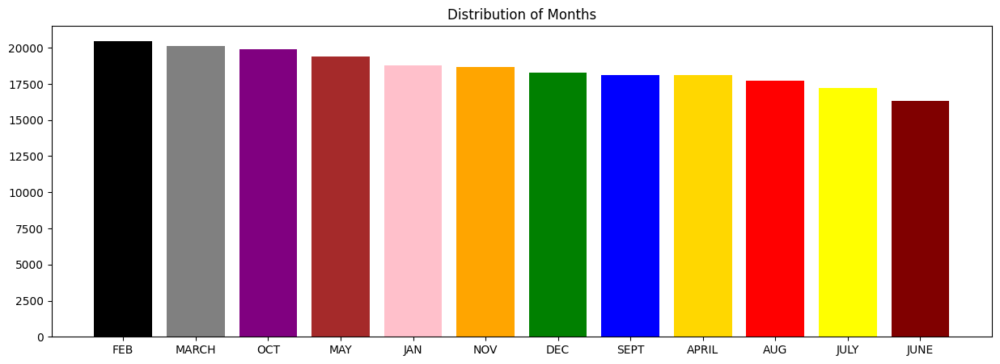

In [ ]:
#we can see that phillips make the most sales in the month of December
#It's possible that consumers purchase more lights during this time to compensate for the reduced natural light and illuminate their homes, also to decorate their homes for festivals, shadis etc
plt.figure(figsize=(15,5))
mcounts = file['MONTH'].value_counts()
plt.bar(mcounts.index, mcounts.values,color=['black', 'grey', 'purple', 'brown', 'pink','orange','green','blue','gold','red','yellow','maroon'])
plt.title('Distribution of Months')
plt.show()

YEAR - Column

In [ ]:
#no inconsistencies or inaccurate data
file['YEAR'].unique()
file['YEAR'].value_counts()

2015    45391
2016    38918
2014    37604
2017    36220
2018    25727
2019    23737
2020    15525
Name: YEAR, dtype: int64

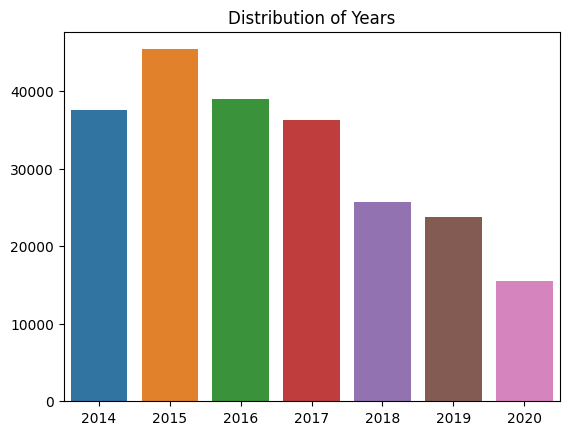

In [ ]:
#since 2015 is the year with the highest count, we can say that maybe phillips had some type of scheme or something that enabled such sales or returns in that year
year=[2014,2015,2016,2017,2018,2019,2020] #values the YEAR Variable had
ycount=[37604,45391,38918,36220,25727,23737,15525]#frequency count each year had
sns.barplot(x=year,y=ycount)
plt.title('Distribution of Years')
plt.show()

Customer Code - Column

In [ ]:
#no inaccurate data
file['Customer Code'].unique()

array([92000559, 92000561, 92000496, 92000466, 92000707, 92000277,
       92000340, 92000452, 92000394, 92000500, 92000483, 92000973,
       92000585, 92000152, 92000489, 92000335, 92000158, 92000361,
       92000163, 92000572, 92000592, 92000624, 92000563, 92000209,
       92000172, 92000425, 92000952, 92000501, 92000531, 92000958,
       92000955, 92000670, 92000631, 92999999, 92000472, 92000957,
       92000443, 92000972, 92000186, 92000399, 92000577, 92000547,
       92000671, 92000348, 92000211, 92000240, 92000705, 92000421,
       92000974, 92000194, 92000299, 92000366, 92000423, 92000969,
       92000480, 92000628, 92000642, 92000246, 92000363, 92000375,
       92000694, 92000951, 92000333, 92000157, 92000428, 92000293,
       92000168, 92000950, 92000600, 92000199, 92000961, 92000477,
       92000676, 92000356, 92000259, 92000307, 92000190, 92000686,
       92000640, 92000921, 92000570, 92000185, 92000451, 92000275,
       92000964, 92000646, 92000427, 92000132, 92000971, 92000

Customer Name - Column

In [ ]:
#a function that helps us identifying inconsistency in this column, which are then replaced below
unique_names = file['Customer Name'].unique()

# Create a list to store the duplicate or similar names
duplicate_names = []

# Iterate over each unique name
for name in unique_names:
    # Check if any other name contains the current name or vice versa
    if any(name in other_name or other_name in name for other_name in unique_names if other_name != name):
        duplicate_names.append(name)

# Print the list of duplicate or similar names
#print(duplicate_names)

In [ ]:
file['Customer Name'].unique()

array(['RAUSHAN ELECTRIC STORES', 'TRIPLE R ENTERPRISES',
       'KHURRAM ENTERPRISES', 'M.J DISTRIBUTOR', 'M.M.TRADERS KARACHI',
       'ASIM ENTERPRISES', 'WALEED TRADERS', 'RAVI MARKETING',
       'HAQ TRADERS', 'SETHI ELECTRICAL STORE', 'QAMAR ELECTRIC',
       'AL-HIJAZ ENTERPRISES', 'ELECTRO LIGHT',
       'INTERNATIONAL LIGHT HOUSE', 'JUBLEE LIGHT HOUSE',
       'FARAZ ENTERPRISES', 'ZUBAIR TRADERS (HID SPECIAL LAMP)',
       'INTERNATIONAL LIGHTING CENTRE', 'THE STAR TRADERS',
       'SHAHBAZ TRADERS', 'DYNAMIC LIGHTING',
       'HAJI ABDUL MALIK GENERAL STORE', 'ROYAL TRADERS',
       'PANTHER DISTRIBUTORS', 'SWIFT LINK DISTRIBUTION',
       'WAHID ELECTRIC STORE', 'HAMZA ENTERPRISES (LAHORE)',
       'ALI TRADERS (M)', 'NOOR DISTRIBUTOR', 'BILAL TRADERS',
       'AL QASIM ENTERPRISES', 'NEW NATIONAL ELECTRONICS CENTRE',
       'TUFAIL SONS TRADERS', 'ONE TIME CUSTOMER PAKISTAN',
       'HAFIZ AHSAN ELAHI', 'GLOBAL SERVICES & TRADING HOUSE',
       'LITE LINE AGENCY', 'A.R.ENT

In [ ]:
#handling inconsistencies
file['Customer Name']=file['Customer Name'].replace('SCHNEIDER ELECTRIC PAKISTAN PVT','SCHNEIDER ELECTRIC PAKISTAN PVT LIMITED')
file['Customer Name']=file['Customer Name'].replace('NATIONAL ENTERPRISE','NATIONAL ENTERPRISES')
file['Customer Name']=file['Customer Name'].replace('M/S FARID TRADERS (PROJECTS)','FARID TRADERS')
file['Customer Name']=file['Customer Name'].replace('LIGHT CENTRE','NASEEM LIGHT CENTRE')
file['Customer Name']=file['Customer Name'].replace('UMER SONS (CONSUMER)','UMER SONS')
file['Customer Name']=file['Customer Name'].replace('PARAGON CONSTRUCTORS PVT LIMITE','PARAGON CONSTRUCTORS PVT LIMITED')
file['Customer Name']=file['Customer Name'].replace('New Islamabad Lights - 1','New Islamabad Lights')
file['Customer Name']=file['Customer Name'].replace('DIRECTORATE GENERAL PROCUREMENT ARMY','DIRECTORATE GENERAL PROCUREMENT')
file['Customer Name']=file['Customer Name'].replace('IQBAL TRADING COMPANY (LED)','IQBAL TRADING COMPANY')
file['Customer Name']=file['Customer Name'].replace('INSTITUTE OF BUSINESS','INSTITUTE OF BUSINESS ADMINISTRATION')
file['Customer Name']=file['Customer Name'].replace('SUKKUR INSTITUTE OF BUSINESS ADMINISTRA','INSTITUTE OF BUSINESS ADMINISTRATION')
file['Customer Name']=file['Customer Name'].replace('CLEVTRON ','CLEVTRON')
file['Customer Name']=file['Customer Name'].replace('SYED SONS (LED)','SYED SONS')
file['Customer Name']=file['Customer Name'].replace('ZAHEER KHAN & BROTHERS PKG-1 RWP,','ZAHEER KHAN & BROTHERS')
file['Customer Name']=file['Customer Name'].replace('ZAHEER KHAN & BROTHERS PKG-4 ISB,','ZAHEER KHAN & BROTHERS')
file['Customer Name']=file['Customer Name'].replace('ZUBAIR TRADERS (HID SPECIAL LAMP)','ZUBAIR TRADERS')
file['Customer Name']=file['Customer Name'].replace('ZUBAIR TRADERS (TLD)','ZUBAIR TRADERS')
file['Customer Name']=file['Customer Name'].replace('TOWN MINICIPAL ADMIISTRATION','TOWN MUNICIPAL ADMINISTRATION')
file['Customer Name']=file['Customer Name'].replace('TOWN MUNICIPAL ADMIN.AZIZ BHATTI TOWN','TOWN MUNICIPAL ADMINISTRATION')
file['Customer Name']=file['Customer Name'].replace('TOWN MUNICIPAL ADMIN. IQBAL TOWN FASLBD','TOWN MUNICIPAL ADMINISTRATION')
file['Customer Name']=file['Customer Name'].replace('TOWN MUNICIPAL ADMINISTRATION DATA','TOWN MUNICIPAL ADMINISTRATION')
file['Customer Name']=file['Customer Name'].replace('TOWN MUNICIPAL ADMINISTRATION RAVI','TOWN MUNICIPAL ADMINISTRATION')
file['Customer Name']=file['Customer Name'].replace('UNILEVER PAKISTAN FOODS LIMITED','UNILEVER PAKISTAN LIMITED.')
file['Customer Name']=file['Customer Name'].replace('TOTAL PARCO MARKET ING LIMITED','TOTAL PARCO PAKISTAN LTD.')
file['Customer Name']=file['Customer Name'].replace('National Logistic Cell PKG 2 RWP','National Logistic Cell')
file['Customer Name']=file['Customer Name'].replace('NATIONAL LOGISTIC CELL PKG-2 ISB,','National Logistic Cell')
file['Customer Name']=file['Customer Name'].replace('MISC DIRECT SALES .STAFF','MISC DIRECT SALES')
file['Customer Name']=file['Customer Name'].replace('MISC DIRECT SALES (REGISTERED) KARACHI','MISC DIRECT SALES')
file['Customer Name']=file['Customer Name'].replace('M.M.TRADERS KARACHI','M.M TRADERS')
file['Customer Name']=file['Customer Name'].replace('FAUJI FERTILIZER BIN QASIM LIMITED','FAUJI FERTILIZER CO.LTD. (FFC)')
file['Customer Name']=file['Customer Name'].replace('ASIM ENTERPRISES (PROF.)','ASIM ENTERPRISES')
file['Customer Name']=file['Customer Name'].replace('AL-QASIM ENTERPRISES II','AL QASIM ENTERPRISES')
file['Customer Name']=file['Customer Name'].replace('HABIB CONSTRUCTION SERVICES','HABIB CONSTRUCTION SERVICES PVT LTD')
file['Customer Name']=file['Customer Name'].replace('ALI TRADERS (M)','ALI TRADERS')
file['Customer Name']=file['Customer Name'].replace('ALI TRADERS (LHR)','ALI TRADERS')
file['Customer Name']=file['Customer Name'].replace('ALI TRADERS (A)','ALI TRADERS')
file['Customer Name']=file['Customer Name'].replace('JASCO INTERNATIONAL .PROF.LIGHT.','JASCO INTERNATIONAL')
file['Customer Name']=file['Customer Name'].replace('STAR ENTERPRISES (HID LAMPS)','STAR ENTERPRISES')
file['Customer Name']=file['Customer Name'].replace('METRO CASH & CARY ISLAMABAD','Metro Cash & Carry - Cross Dock')
file['Customer Name']=file['Customer Name'].replace('METRO CASH & CARY DEFFENCE ROAD LAHORE','Metro Cash & Carry - Cross Dock')
file['Customer Name']=file['Customer Name'].replace('METRO HABIB CASH & CARRY','Metro Cash & Carry - Cross Dock')
file['Customer Name']=file['Customer Name'].replace('METRO CASH & CARY SARGODA ROAD FAISALBAD','Metro Cash & Carry - Cross Dock')
file['Customer Name']=file['Customer Name'].replace('METRO CASH & CARRY','Metro Cash & Carry - Cross Dock')
file['Customer Name']=file['Customer Name'].replace('PEARL CONTINENTAL HOTEL LAHORE','PEARL CONTINENTAL HOTEL')
file['Customer Name']=file['Customer Name'].replace('PEARL CONTINENTAL HOTEL BHURBAN','PEARL CONTINENTAL HOTEL')
file['Customer Name']=file['Customer Name'].replace('PEARL CONTINENTAL HOTEL LAHORE ','PEARL CONTINENTAL HOTEL')
file['Customer Name']=file['Customer Name'].replace('PC HOTEL KARACHI','PEARL CONTINENTAL HOTEL')
file['Customer Name']=file['Customer Name'].replace('PEARL CONTINENTAL HOTEL (MUZAFFARABAD)','PEARL CONTINENTAL HOTEL')
file['Customer Name']=file['Customer Name'].replace('INTERNATIONAL LIGHTING SYSTEM (TRADE)','INTERNATIONAL LIGHTING SYSTEM')
file['Customer Name']=file['Customer Name'].replace('INTERNATIONAL LIGHTING SYSTEM (Prof.)','INTERNATIONAL LIGHTING SYSTEM')
file['Customer Name']=file['Customer Name'].replace('INTERNATIONAL LIGHTING CENTER (PROF.)','INTERNATIONAL LIGHTING CENTRE')
file['Customer Name']=file['Customer Name'].replace('MAKRO-Habib Pakistan Ltd','MAKRO')
file['Customer Name']=file['Customer Name'].replace('MAKRO HABIB MANGHOPIR','MAKRO')
file['Customer Name']=file['Customer Name'].replace('MAKRO STAR GATE STORE','MAKRO')
file['Customer Name']=file['Customer Name'].replace('MAKRO SADDAR STORE','MAKRO')
file['Customer Name']=file['Customer Name'].replace('MAKRO HABIB RAVI ROAD','MAKRO')
file['Customer Name']=file['Customer Name'].replace('MAKRO HABIB MODEL TOWN','MAKRO')
file['Customer Name']=file['Customer Name'].replace('LITEOLOGY','LITELOGY')
names=['On Time Customer','ONE TIME CUSTOMER PAKISTAN','ONE TIME CUSTOMER (UN REGISTERED)','One Time Customer - TAX unregistered for Pakistan']
file.loc[file['Customer Name'].isin(names), 'Customer Name'] = 'ONE TIME CUSTOMER'
file['Customer Name'] = file['Customer Name'].str.upper() #to make sure the entire column is in caps, to avoid inaccuracy

City - Column

In [ ]:
#we can see inconsistencies
file['CITY'].unique()

array(['KARACHI', 'LAHORE', 'GUJRAT', 'SIALKOT', 'FAISALABAD', 'OKARA',
       'HYDERABAD', 'RAWALPINDI', 'SHEKHUPURA', 'QUETTA', 'MULTAN',
       'TEXILA', 'MUZAFARABAD', 'D.I.KHAN', 'BANNU', 'ATTOCK', 'CHAKWAL',
       nan, 'HALA', 'GUJRANWALA', 'HARIPUR', 'ABBOTTABAD',
       'RAHIM YAR KHAN', 'BAHAWALPUR', 'DERA GHAZI KHAN', 'BHAKKAR',
       'KHANEWAL', 'MAILSI', 'GUJAR KHAN', 'ISLAMABAD', 'PESHAWAR',
       'MUZAFFARGARH', 'THARPARKAR', 'SARGODHA', 'NAWABSHAH.', 'MIANWALI',
       'MURREE', 'SUKKUR', 'JAM PUR', 'KOHAT', 'SADIQABAD', 'LARKANA',
       'TALAGANG', 'KHANPUR', 'MANDI BAHAUDDIN', 'AZAD KASHMIR',
       'BHAI PHERU', 'KASUR', 'BAHAWALNAGAR', 'GILGIT', 'SKARDU',
       'SAHIWAL', 'BUREWALA', 'PATTOKI', 'CHICHAWATNI', 'JHELUM', 'KOTLI',
       'MARDAN', 'SHUJABAD', 'GOJRA', 'PIND DADAN KHAN', 'TANDLIANWALA',
       'AHMEDPUR EAST', 'MIAN CHANNUU', 'NAROWAL', 'BALAKOT', 'SWAT',
       'SHAKARGARH', 'PINDI', 'CHARSADDA', 'PASROOR', 'D.G. KHAN',
       'MIRPUR KHAS', 'TIMER

In [ ]:
#handling inconsistencies
file['CITY']=file['CITY'].replace('Karachi','KARACHI')
file['CITY']=file['CITY'].replace('KARACHI OFFICE','KARACHI')
file['CITY']=file['CITY'].replace('Hyderabad','HYDERABAD')
file['CITY']=file['CITY'].replace('GUJRANWALA ','GUJRANWALA')
file['CITY']=file['CITY'].replace('SHEKHUPURA','SHEIKHUPURA')
file['CITY']=file['CITY'].replace('LAHORE ','LAHORE')
file['CITY']=file['CITY'].replace('Lahore','LAHORE')
file['CITY']=file['CITY'].replace('LAHORE OFFICE','LAHORE')
file['CITY']=file['CITY'].replace('PINDI','RAWALPINDI')
file['CITY']=file['CITY'].replace('PINDI OFFICE','RAWALPINDI')
file['CITY']=file['CITY'].replace('Haripur','HARIPUR')
file['CITY']=file['CITY'].replace('Islamabad','ISLAMABAD')
file['CITY']=file['CITY'].replace('R. Y. KHAN','RAHIM YAR KHAN')
file['CITY']=file['CITY'].replace('R.Y.KHAN','RAHIM YAR KHAN')
file['CITY']=file['CITY'].replace('D.G. KHAN','DERA GHAZI KHAN')
file['CITY']=file['CITY'].replace('NAWABSHAH.','NAWABSHAH')
file['CITY']=file['CITY'].replace('Gujrat','GUJRAT')
file['CITY'] = file['CITY'].replace(0, np.nan)
file['CITY'] = file['CITY'].replace('SOUTH', np.nan)

In [ ]:
#the strategy is to find a duplicate data for the customer and if there is the city name i will just fill th missing value with it.
#if no duplicate then will search the internet and will fill the city
file[file['CITY'].isna()]

,PD,DC,MONTH,YEAR,Customer Code,Customer Name,CITY,Invoice #,Invoice Date,12NC CODE,...,Order Type,Qty,Amount,Sales Tax,Gross Amount,BG Code,BU,Sub BG,Order #,OFFICE NAME
169974,LIGHT,PROF,MAY,2018,92001133,PARAGON CONSTRUCTORS PVT LIMITED,NaN,9292593717,2018-05-15 00:00:00,911401565121,...,ZE01,55,194590.00,10080.0,227670.30,Professional,Professional Products,B23,1.018554e+09,NaN
171191,LIGHT,PROF,MAY,2018,92001133,PARAGON CONSTRUCTORS PVT LIMITED,NaN,9292593678,2018-05-15 00:00:00,911401565121,...,ZE0B,-55,18221.25,0.0,20551.14,Professional,Professional Products,B23,6.389651e+07,NaN


In [ ]:
#line of code to seeing duplicates for customer names that had NAN in the city column above
file[file['Customer Name']=='OLYMPUS INTERNATIONAL PVT LTD']

,PD,DC,MONTH,YEAR,Customer Code,Customer Name,CITY,Invoice #,Invoice Date.2,12NC CODE,...,Amount,Sales Tax,Gross Amount,BG Code,BU,BG NAME,Sub BG,Order Date,Order #,OFFICE NAME
1130,LIGHT,PROF,JAN,2014,92000100,OLYMPUS INTERNATIONAL PVT LTD,LAHORE,9.292515e+09,2014-01-17,929000296708,...,12471.76,2120.20,14591.96,LS&E,LED Lamps,LS&E,D57,2014-01-17 00:00:00,1.010308e+09,0
8534,LIGHT,PROF,MARCH,2014,92000100,OLYMPUS INTERNATIONAL PVT LTD,LAHORE,9.292518e+09,2014-03-26,929000296708,...,12600.00,2142.00,14742.00,LS&E,LED Lamps,LS&E,D57,2014-03-26 00:00:00,1.010699e+09,NORTH
8535,LIGHT,PROF,MARCH,2014,92000100,OLYMPUS INTERNATIONAL PVT LTD,LAHORE,9.292518e+09,2014-03-26,929000296708,...,57400.00,9758.00,67158.00,LS&E,LED Lamps,LS&E,D57,2014-03-26 00:00:00,1.010699e+09,NORTH
10476,LIGHT,PROF,APRIL,2014,92000100,OLYMPUS INTERNATIONAL PVT LTD,LAHORE,9.292519e+09,NaT,910401681880,...,6282.00,1067.94,7349.94,PLS,PLS,PLS,B23,2014-04-11 00:00:00,1.010789e+09,0
10477,LIGHT,PROF,APRIL,2014,92000100,OLYMPUS INTERNATIONAL PVT LTD,LAHORE,9.292519e+09,NaT,913710031102,...,6282.00,1067.94,7349.94,LS&E,Lamp Electronics,LS&E,B59,2014-04-11 00:00:00,1.010789e+09,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170575,LIGHT,PROF,MAY,2018,92000100,OLYMPUS INTERNATIONAL PVT LTD,NaN,9.292594e+09,2018-05-22,824110153461,...,146581.20,24918.80,171500.00,Professional,PLS,Professional,A41,2018-05-22 00:00:00,1.018582e+09,NaN
191845,LIGHT,PROF,APRIL,2019,92000100,OLYMPUS INTERNATIONAL PVT LTD,LAHORE,9.292605e+09,NaT,928487200098,...,31795.00,5405.15,37200.15,Lamps,Conventional Products,Lamps,PA0,2019-04-06 00:00:00,1.025689e+09,0
193138,LIGHT,PROF,APRIL,2019,92000100,OLYMPUS INTERNATIONAL PVT LTD,LAHORE,9.292606e+09,NaT,928487100096,...,55983.00,9517.11,65500.11,Lamps,Conventional Products,Lamps,PA0,2019-04-26 00:00:00,1.025784e+09,0
193139,LIGHT,PROF,APRIL,2019,92000100,OLYMPUS INTERNATIONAL PVT LTD,LAHORE,9.292606e+09,NaT,928487200098,...,159615.00,27134.55,186749.55,Lamps,Conventional Products,Lamps,PA0,2019-04-26 00:00:00,1.025784e+09,0


In [ ]:
#find it through duplicate
cutK=['ABDUL HADI TRADING','AL-SHAFI ENTERPRISES', 'GULF CONSTRUCTORS PVT LTD', 'FARID TRADERS', 'MUSANI ENTERPRISE', 'NOOR THE LIGHT', 'ITTEFAQ CONSTRUCTION COMPANY','AAMIR TRADERS',
      'AL-NOOR PETROLEUM','SYED TRADERS','PARAGON CONSTRUCTORS PVT LIMITED','METRO CASH & CARRY - CROSS DOCK','HP LIGHTING & SOLUTION','UMER SONS','INSTITUTE OF BUSINESS ADMINISTRATION',
      'CRESCENT ENERGY COMPANY']
cutR=['ONE TIME CUSTOMER', 'AZAD TRADERS', 'AL QASIM ENTERPRISES', 'SHAN TRADERS','ATTOCK REFINERY LIMITED','M/S. SATLUJ MARKETING']
cutL=['BARKAT TRADING COMPANY','RAH ENTERPRISES','SERVIS INDUSTRIES LIMITED','ALI TRADERS','TM ASSOCIATES TRADERS & CONSULTANTS','G.M TRADERS','SMARTLINK TRADERS','ESQUIRE ENGINEERING',
      'IFTIKHAR ELECTRIC COMPANY','OLYMPUS INTERNATIONAL PVT LTD']
cutH=['ZAHID TRADERS','PAK ENTERPRISES','LASANI ENTERPRISES']
cutF=['SIGMA ENTERPRISES','BIN MUMTAZ INTERNATIONAL','EXCEL TRADERS']

file.loc[(file['Customer Name'].isin(cutK)) & (file['CITY'].isna()), 'CITY'] = 'KARACHI'
file.loc[(file['Customer Name'].isin(cutR)) & (file['CITY'].isna()), 'CITY'] = 'RAWALPINDI'
file.loc[(file['Customer Name'].isin(cutL)) & (file['CITY'].isna()), 'CITY'] = 'LAHORE'
file.loc[(file['Customer Name'].isin(cutH)) & (file['CITY'].isna()), 'CITY'] = 'HYDERABAD'
file.loc[(file['Customer Name'].isin(cutF)) & (file['CITY'].isna()), 'CITY'] = 'FAISALABAD'
file.loc[(file['Customer Name']=='AL - MURTAZA ACADEMY') & (file['CITY'].isna()), 'CITY'] = 'GILGIT'
file.loc[(file['Customer Name']=='LIGHT VISION & SERVICES') & (file['CITY'].isna()), 'CITY'] = 'ABBOTTABAD'
file.loc[(file['Customer Name']=='AHMED TRADERS') & (file['CITY'].isna()), 'CITY'] = 'KASUR'
file.loc[(file['Customer Name']=='TOP STAR TRADERS') & (file['CITY'].isna()), 'CITY'] = 'MANDI BAHAUDDIN'
file.loc[(file['Customer Name']=='AYYAN TRADERS') & (file['CITY'].isna()), 'CITY'] = 'GUJRANWALA'
file.loc[(file['Customer Name']=='ORIENT ENTERPRISES') & (file['CITY'].isna()), 'CITY'] = 'QUETTA'
file.loc[(file['Customer Name']=='JUNAID ELECTRIC TRADERS') & (file['CITY'].isna()), 'CITY'] = 'MIRPUR KHAS'
file.loc[(file['Customer Name']=='ORAKZAI ELECTRIC STORE') & (file['CITY'].isna()), 'CITY'] = 'KOHAT'
file.loc[(file['Customer Name']=='CUBE ELECTRIC') & (file['CITY'].isna()), 'CITY'] = 'BHAKKAR'
file.loc[(file['Customer Name']=='SUNLIGHT HOUSE') & (file['CITY'].isna()), 'CITY'] = 'PESHAWAR'
file.loc[(file['Customer Name']=='MALIK TRADERS') & (file['CITY'].isna()), 'CITY'] = 'WAH CANTT'
file.loc[(file['Customer Name']=='ARIRA TRADERS') & (file['CITY'].isna()), 'CITY'] = 'MULTAN'
file.loc[(file['Customer Name']=='MANZOOR ELECTRIC') & (file['CITY'].isna()), 'CITY'] = 'TURBAT'
file.loc[(file['Customer Name']=='AL-BARQA TRADERS') & (file['CITY'].isna()), 'CITY'] = 'GUJRAT'
file.loc[(file['Customer Name']=='HAROON LIGHTS') & (file['CITY'].isna()), 'CITY'] = 'ATTOCK'
file.loc[(file['Customer Name']=='INTERNATIONAL TRADERS') & (file['CITY'].isna()), 'CITY'] = 'SARGODHA'
ind=[169974,171191]
file.loc[ind,'CITY']='KARACHI'
#searched the internet to know where they were located
file.loc[(file['Customer Name']=='GULF CONSTRUCTORS Pvt Ltd') & (file['CITY'].isna()), 'CITY'] = 'KARACHI'
file.loc[(file['Customer Name']=='TATA BEST FOODS LIMITED') & (file['CITY'].isna()), 'CITY'] = 'KARACHI'

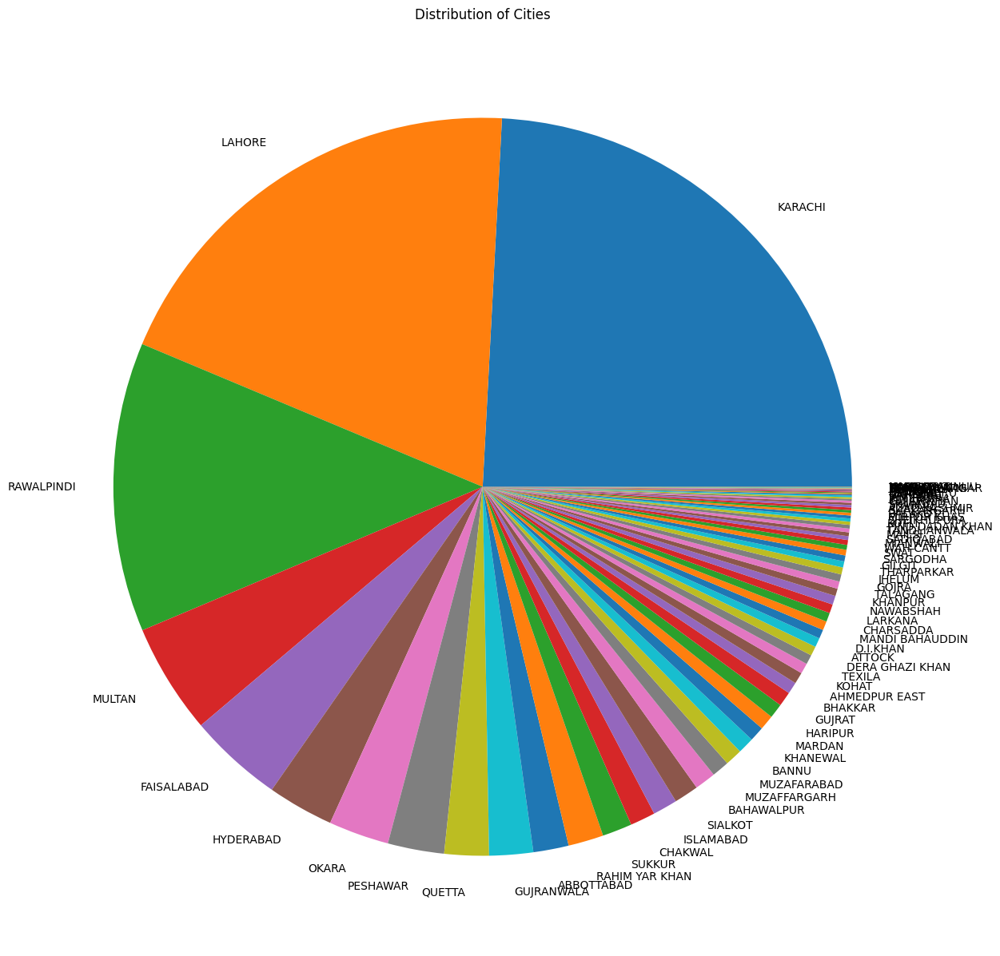

In [ ]:
#we can see that karachi has the highest proportion, means phillips sends tons of material to karachi based offices
plt.figure(figsize=(15,15))
counts = file['CITY'].value_counts()
plt.pie(counts.values, labels=counts.index)
plt.title('Distribution of Cities')
plt.show()

Invoice # - Column

In [ ]:
file['Invoice #'].value_counts() #no inaccurate data or inconsistencies
#converting to int cauz discrete
file['Invoice #']=file['Invoice #'].astype('Int64')

12NC CODE - Column

In [ ]:
#an item code
file['12NC CODE'].unique()

array([929689626501, 929000250007, 929000248507, ..., 913703057009,
       824110132901, 824110132911], dtype=object)

In [ ]:
#there is few inaccurate data because service charges and Phi Comprehensive Maintenance is not an item they sell so since it is considered as an item,
#their code needs to be changed in order to maatch their items
#so the strategy is to see through the order type, from it i will find which has been their best selling product in that type and will replace the code with the item of that code,
#will also replace item description, amount, gross amount for them too
mode=file[(file['Order Type']=='ZE01')]['Item Description'].mode()[0] # a line of code i use to check for the mode for the types the 12NCcode that needs to be changed has
mode

'TL-D 36W/54-765 1SL/25'

In [ ]:
#order type was same in these inaccurate codes which belonged to not items but inappropriate data that were not items
code = ['STT-610-BG.LUM', 'STT-044', 'SRV-2402', 'SRV-2272', 'SRV-2182', 'SRV-2142', 'SRV-2112']
mask = file['12NC CODE'].isin(code)
file.loc[mask,'12NC CODE']=928048505436
file.loc[mask, 'Item Description'] = 'TL-D 36W/54-765 1SL/25'
file.loc[mask, 'Amount '] = file.loc[mask, 'Qty'] * 67
file.loc[mask, 'Gross Amount'] = file.loc[mask, 'Amount '] + file.loc[mask, 'Sales Tax ']

In [ ]:
#since inaccurate data has been removed so converting the data type from object to int64
file['12NC CODE']=file['12NC CODE'].astype('Int64')

Item Description - Column

In [ ]:
file['Item Description'].value_counts()

TL-D 36W/54-765 1SL/25                  6167
TL RS 40W/54-765 1SL/25                 4791
TORNADO 23W CDL E27 220-240V 1CT/12     3649
TORNADO 24W CDL E27 220-240V 1CT/12     3561
TL-D 18W/54-765 1SL/25                  2931
                                        ... 
BBP500 LED140/NW PSU A-WB EN               1
BBP500 LED140/NW PSU S-WB EN               1
DR2PA-BC-MLX-X-C-T-C-Y                     1
WT118C LED45 NW PSU L1500                  1
BRP381 LED119/WW 90W 220-240V DM PSC       1
Name: Item Description, Length: 3048, dtype: int64

In [ ]:
#replacing them because they also tell where the products are needed for when the column states it to be a mere description of the item
file['Item Description']=file['Item Description'].replace('PATPA-WW-L-Office','PATPA-WW-L')
file['Item Description']=file['Item Description'].replace('PATPA-WW-L-Senior_Office','PATPA-WW-L')
file['Item Description']=file['Item Description'].replace('PATPA-WW-L-Conference_Room','PATPA-WW-L')
file['Item Description']=file['Item Description'].replace('PATPA-WW-L-Bed Panels','PATPA-WW-L')
file['Item Description']=file['Item Description'].replace('PATPA-WW-L-Board_Room','PATPA-WW-L')
file['Item Description']=file['Item Description'].replace('PATPA-WW-L-Meeting Room PRJ-190215A01','PATPA-WW-L')
file['Item Description']=file['Item Description'].replace('PATPA-WW-L-Reception PRJ-190215A01','PATPA-WW-L')
file['Item Description']=file['Item Description'].replace('PATPA-WW-L-DEMO-3','PATPA-WW-L')
file['Item Description']=file['Item Description'].replace('PATPA-WW-L-FF Bath 4 - K22','PATPA-WW-L-FF')
file['Item Description']=file['Item Description'].replace('PATPA-WW-L-FF Sitting / Passage - K12','PATPA-WW-L-FF')
file['Item Description']=file['Item Description'].replace('PATPA-WW-L-FF Study - K19','PATPA-WW-L-FF')
file['Item Description']=file['Item Description'].replace('PATPA-WW-L-LGF Multipurpose Hall - K1','PATPA-WW-L-LGF')
file['Item Description']=file['Item Description'].replace('PATPA-WW-L-M. Bath Panels','PATPA-WW-L-M')
file['Item Description']=file['Item Description'].replace('PATPA-WW-L-GF Drawing - K5','PATPA-WW-L-GF')
file['Item Description']=file['Item Description'].replace('PATPA-WW-L-GF Formal Dining - K4','PATPA-WW-L-GF')
file['Item Description']=file['Item Description'].replace('PATPA-WW-L-GF Outdoor / Pool - K11','PATPA-WW-L-GF')
file['Item Description']=file['Item Description'].replace('PATPA-WW-L-GF Kitchen - K10','PATPA-WW-L-GF')

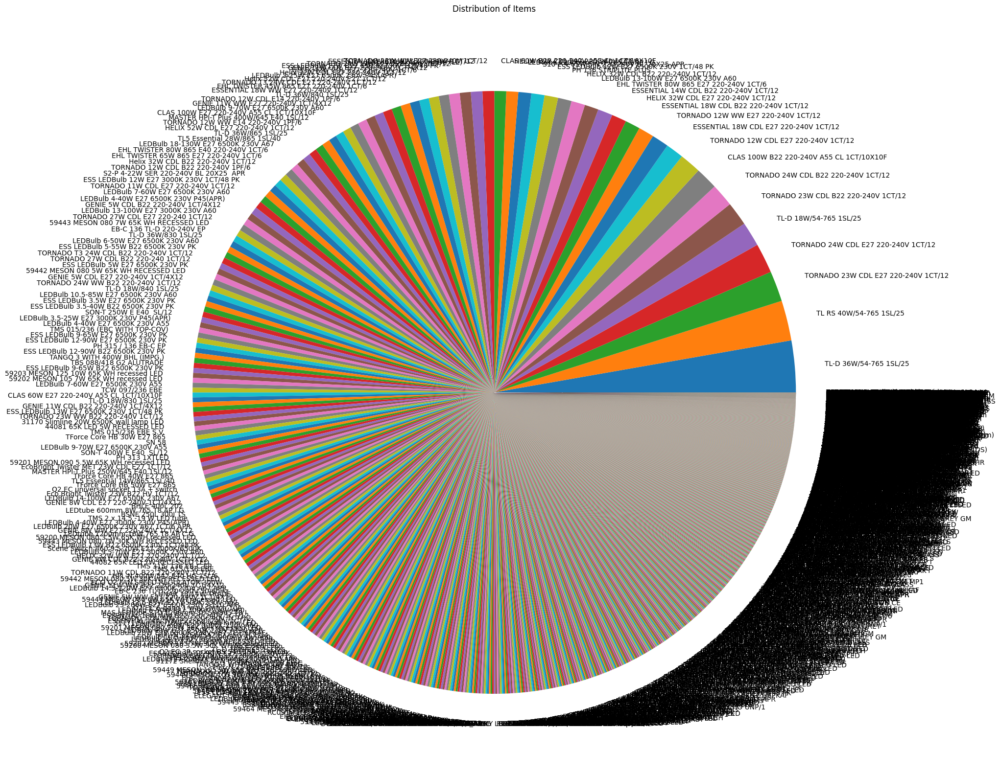

In [ ]:
#we can see that TL-D 36W/54-765 1SL/25 is the most popular product among customers, maybe because of reasonable price or good battery or duable power
plt.figure(figsize=(20,20))
icounts = file['Item Description'].value_counts()
plt.pie(icounts.values, labels=icounts.index)
plt.title('Distribution of Items')
plt.show()

Dropping Columns

In [ ]:
#Group is same as Material Group, hence to avoid redundancy i am dropping it
#Product Hierarchy and Purchase order is just codes not relevant for our analysis
col2drop=['Group','PURCHASE ORDER']
file = file.drop(col2drop, axis=1)

Branch Plant - Column

In [ ]:
#no inconsistency or inaccurate data
file['Branch Plant'].unique()

array(['PKS1', 'PKS2'], dtype=object)

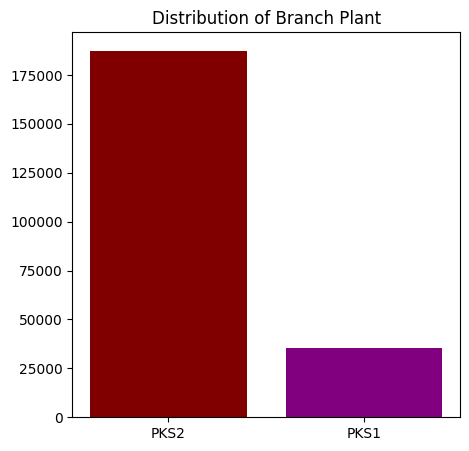

In [ ]:
plt.figure(figsize=(5,5))
bcounts = file['Branch Plant'].value_counts()
plt.bar(bcounts.index, bcounts.values,color=['maroon', 'purple'])
plt.title('Distribution of Branch Plant')
plt.show()

Order Type - Column

In [ ]:
#no inconsistency or inaccurate data
file['Order Type'].unique()

array(['ZE01', 'ZE0B', 'S1', 'ZE05', 'ZE08', 'ZE09', 'ZE02'], dtype=object)

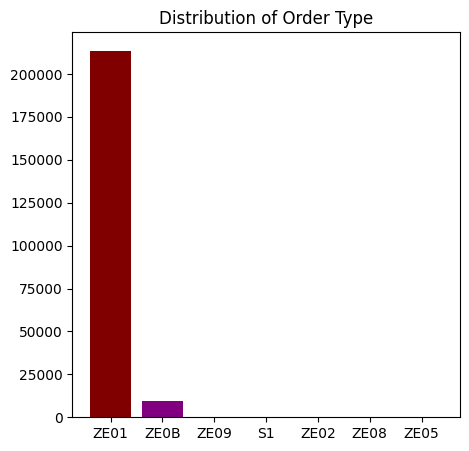

In [ ]:
plt.figure(figsize=(5,5))
ocounts = file['Order Type'].value_counts()
plt.bar(ocounts.index, ocounts.values,color=[ 'maroon', 'purple', 'gold', 'pink','orange','green','blue'])
plt.title('Distribution of Order Type')
plt.show()

Qty - Column

In [ ]:
#here positive quantity represents items sold, while negative represents items refunded or returned
file['Qty'].unique()

array([1.4400e+02, 9.0000e+01, 1.2000e+01, ..., 1.6170e+03, 1.3830e+03,
       1.7037e+04])

In [ ]:
file[file['Qty'].isna()]

,PD,DC,MONTH,YEAR,Customer Code,Customer Name,CITY,Invoice #,Invoice Date.2,12NC CODE,...,Amount,Sales Tax,Gross Amount,BG Code,BU,BG NAME,Sub BG,Order Date,Order #,OFFICE NAME
165831,LIGHT,CONS,MARCH,2018,72018079,UMER SONS,KARACHI,9292591612,2018-03-28,919052710721,...,596.00,101.32,697.32,Lamps,Lamp Electronics,Lamps,B56,2018-03-28 00:00:00,70552064.0,NaN
165869,LIGHT,CONS,MARCH,2018,72018079,UMER SONS,KARACHI,9292591638,2018-03-28,929001377567,...,994.68,188.99,1183.67,LED,LED Lamps,LED,L66,2018-03-28 00:00:00,70553119.0,NaN
165870,LIGHT,CONS,MARCH,2018,72018079,UMER SONS,KARACHI,9292591638,2018-03-28,929001162437,...,1735.68,329.78,2065.46,LED,LED Lamps,LED,L66,2018-03-28 00:00:00,70553119.0,NaN
165871,LIGHT,CONS,MARCH,2018,72018079,UMER SONS,KARACHI,9292591638,2018-03-28,929001163937,...,3471.36,659.56,4130.92,LED,LED Lamps,LED,L66,2018-03-28 00:00:00,70553119.0,NaN
165872,LIGHT,CONS,MARCH,2018,72018079,UMER SONS,KARACHI,9292591638,2018-03-28,929001377267,...,331.56,63.00,394.56,LED,LED Lamps,LED,L66,2018-03-28 00:00:00,70553119.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
166094,LIGHT,CONS,MARCH,2018,92000983,SYED TRADERS,KARACHI,9292591748,2018-03-30,928048505436,...,62640.00,13154.40,75794.40,Lamps,Professional Products,Lamps,A10,2018-03-30 00:00:00,70552968.0,NaN
166095,LIGHT,CONS,MARCH,2018,92000983,SYED TRADERS,KARACHI,9292591748,2018-03-30,929001163937,...,86784.00,18224.64,105008.64,LED,LED Lamps,LED,L66,2018-03-30 00:00:00,70552968.0,NaN
166096,LIGHT,CONS,MARCH,2018,92000983,SYED TRADERS,KARACHI,9292591748,2018-03-30,929001355208,...,31314.00,6575.94,37889.94,LED,LED Lamps,LED,L66,2018-03-30 00:00:00,70552968.0,NaN
166097,LIGHT,CONS,MARCH,2018,92000983,SYED TRADERS,KARACHI,9292591748,2018-03-30,929001355608,...,36742.80,7715.99,44458.79,LED,LED Lamps,LED,L66,2018-03-30 00:00:00,70552968.0,NaN


In [ ]:
#since the data is missing at random and we know that it can be predicted through other columns
#the strategy is to match the amount and the item code, and to see what quantity has such an amount
def fill_null_qty(data):
    for index, row in data.iterrows():
        if pd.isnull(row['Qty']):
            item_code = row['12NC CODE']
            amount = row['Amount ']
            c_name = row['Customer Name']
            i_des = row['Item Description']
            non_null_row = data.loc[(data['12NC CODE'] == item_code) & (data['Qty'].notnull()) & (data['Item Description'].eq(i_des)) & (data['Customer Name'].eq(c_name))]
            price = non_null_row['Amount '] / non_null_row['Qty']
            qty = amount / price.values[0]
            data.loc[(data['12NC CODE'] == item_code) & (data['Amount '] == amount) & (data['Customer Name'].eq(c_name))  & (data['Item Description'].eq(i_des)), 'Qty'] = qty
    return data

In [ ]:
des=fill_null_qty(file)

In [ ]:
file['Qty']=des['Qty']

In [ ]:
#verifying if right qunatity is placed
specific_columns = file.loc[(file['12NC CODE'] == 928048505436) & (file['Amount '] == 313200.00), ['12NC CODE', 'Amount ', 'Gross Amount', 'Sales Tax ', 'Qty']]
specific_columns

,12NC CODE,Amount,Gross Amount,Sales Tax,Qty
166098,928048505436,313200.0,372708.0,59508.0,4674.626866


In [ ]:
file[file['Qty'].isna()] #making sure no NAN values anymore

,PD,DC,MONTH,YEAR,Customer Code,Customer Name,CITY,Invoice #,Invoice Date.2,12NC CODE,...,Amount,Sales Tax,Gross Amount,BG Code,BU,BG NAME,Sub BG,Order Date,Order #,OFFICE NAME


In [ ]:
#converting to int cauz discrete
file['Qty']=file['Qty'].astype(int)

<AxesSubplot: >

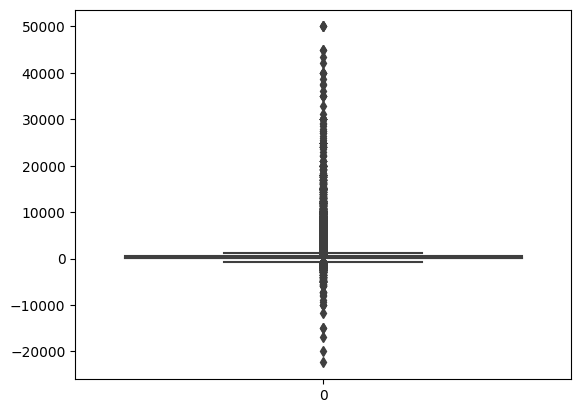

In [ ]:
#there are outliers in data because no company can supply such heavy quantity of products, considering they would be having an inventory limitation
sns.boxplot(file['Qty'])

In [ ]:
#a descriptive way of defining the box plot
file.describe()[['Qty']]

,Qty
count,223122.000000
mean,565.616497
std,1433.439269
min,-22392.000000
25%,40.000000
50%,144.000000
75%,500.000000
max,50000.000000


In [ ]:
#handling outliers
abs1=outliers(file,col_namee='Qty')
handle_outliers(file,col_nam='Qty',ol=abs1)

<AxesSubplot: >

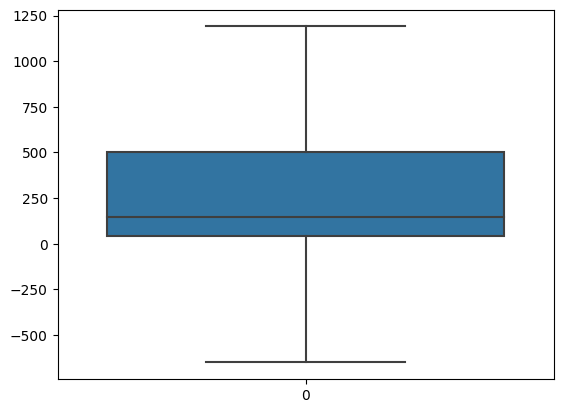

In [ ]:
#verifying if outliers have been removed or not, now we can see that the data is within a reasonable amount of qty a company can afford or has enough enough storage to store them
sns.boxplot(file['Qty'])

<AxesSubplot: xlabel='Qty', ylabel='Density'>

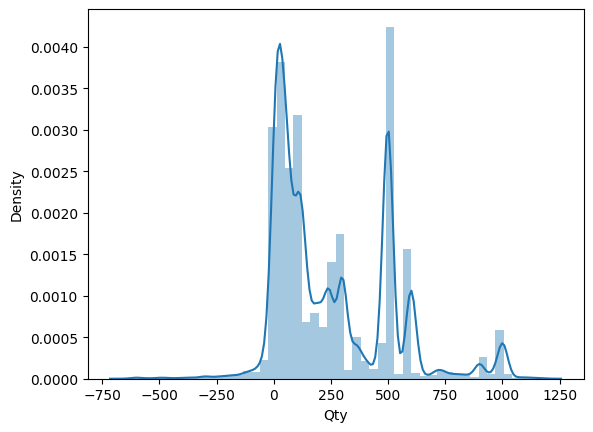

In [ ]:
sns.distplot(file['Qty'])

Amount - Column

In [ ]:
file['Amount '].unique() # no inconsistency or inaccurate data
file.rename(columns={'Amount ': 'Amount'}, inplace=True)

<AxesSubplot: >

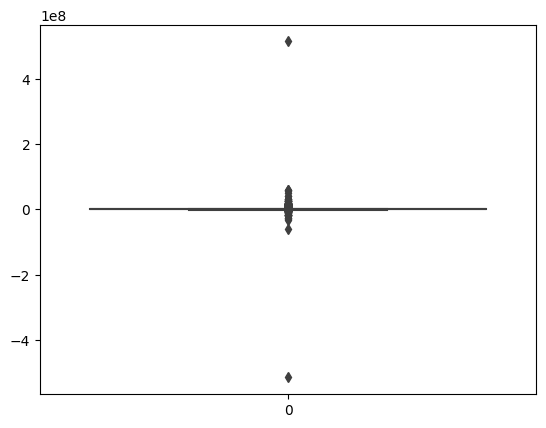

In [ ]:
#there are outliers, one reason of such high and low amounts can be some materials are much more expensive as others and have been sold once or twice that they deviate from other data
sns.boxplot(file['Amount'])

In [ ]:
#a descriptive representation of the boxplot
file.describe()[['Amount']]

,Amount
count,2.231220e+05
mean,1.373546e+05
std,1.648752e+06
min,-5.160256e+08
25%,1.822125e+04
50%,5.250000e+04
75%,1.340000e+05
max,5.160256e+08


In [ ]:
#handling outliers
abs2=outliers(file,col_namee='Amount')
handle_outliers(file,col_nam='Amount',ol=abs2)

<AxesSubplot: >

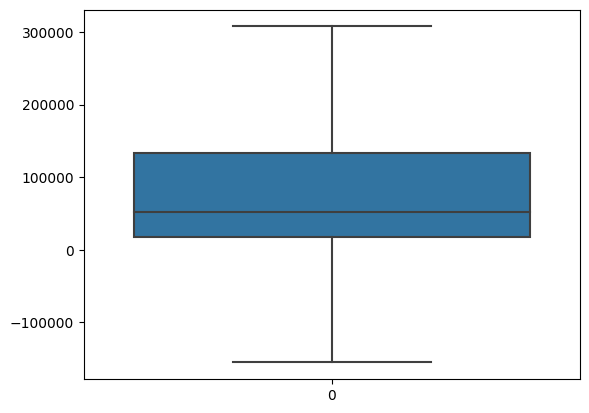

In [ ]:
#verifying if outliers have been removed or not
sns.boxplot(file['Amount'])

<AxesSubplot: xlabel='Amount', ylabel='Density'>

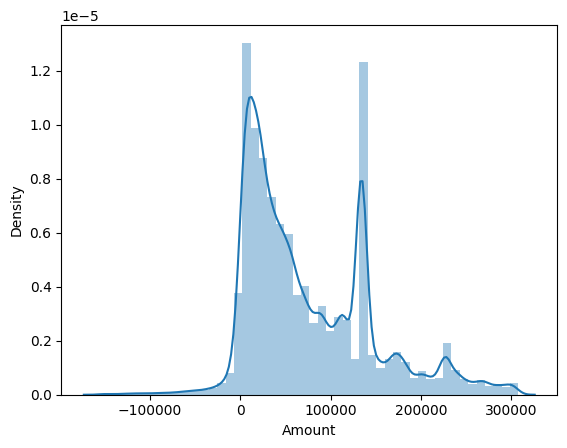

In [ ]:
sns.distplot(file['Amount'])

Sales Tax - Column

In [ ]:
#negative sales tax appears when a customers returns a product, the associated sales tax is also refunded
#positive sales tax can be additional fees such as shipment or a surcharge on the product
#sales tax can be 0 also, considering no extra charges were added
file.rename(columns={'Sales Tax ': 'Sales Tax'}, inplace=True)
file['Sales Tax'].unique()

array([    0.  , 15300.  ,   900.  , ..., 18290.  ,  6743.22,  2091.35])

<AxesSubplot: >

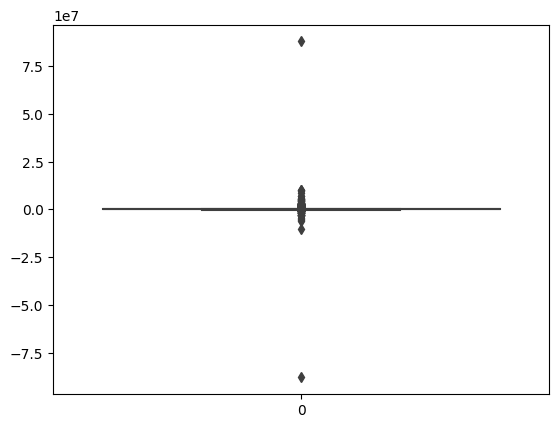

In [ ]:
#there are outliers because no company can charge such a huge amount of sales tax no matter how much the quantity or the type of the product is
#one of the possible reason for such values could be that they might have been manipulated or intentionally misrepresented for illicit purposes.
sns.boxplot(file['Sales Tax'])

In [ ]:
#descriptive way of defining a box plot to see if any outliers
file.describe()[['Sales Tax']]

,Sales Tax
count,2.231220e+05
mean,1.275324e+04
std,2.777683e+05
min,-8.772436e+07
25%,0.000000e+00
50%,1.292000e+03
75%,1.008000e+04
max,8.772436e+07


In [ ]:
abs3=outliers(file,col_namee='Sales Tax')
handle_outliers(file,col_nam='Sales Tax',ol=abs3)

<AxesSubplot: >

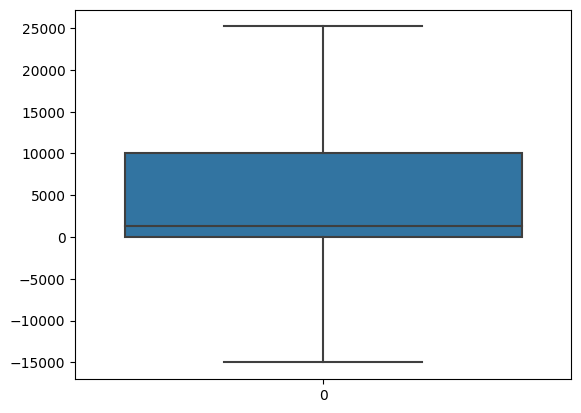

In [ ]:
#verifying if outliers have been removed or not
sns.boxplot(file['Sales Tax'])

<AxesSubplot: xlabel='Sales Tax', ylabel='Density'>

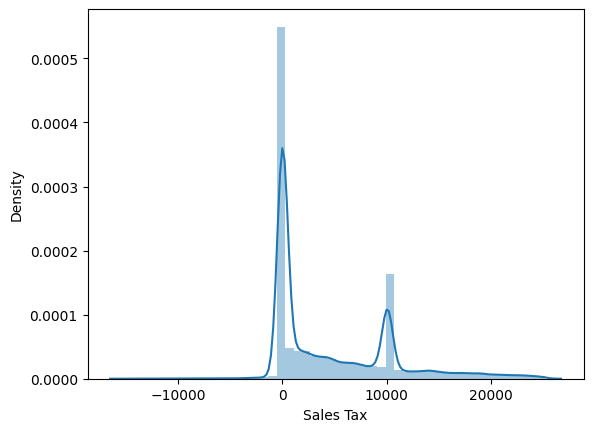

In [ ]:
sns.distplot(file['Sales Tax'])

Gross Amount - Column

In [ ]:
#total value of a transaction without considering any discounts, refunds, or other deductions
#positive gross amount is the revenue generated from the sales
#negtive gross amount is may be because of refunds or discount or any other adjustments
file['Gross Amount'].unique()

array([ 26496.  ,  91800.  ,   5400.  , ..., 160625.  ,  46409.22,
        14393.43])

<AxesSubplot: >

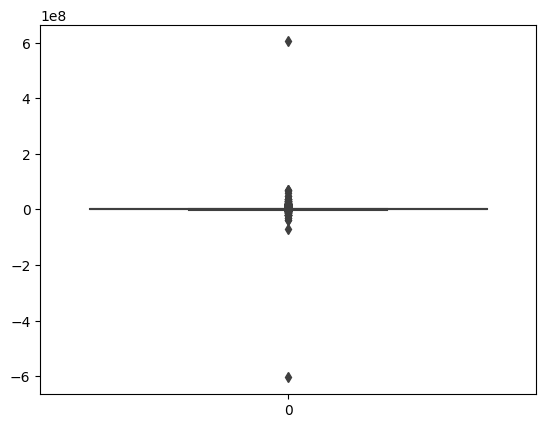

In [ ]:
#we can see outliers, reason is same as amount and sales tax, because it is their sum
sns.boxplot(file['Gross Amount'])

In [ ]:
#descriptive way of defining a box plot to see if any outliers
file.describe()[['Gross Amount']]

,Gross Amount
count,2.231220e+05
mean,1.501079e+05
std,1.922797e+06
min,-6.037500e+08
25%,2.055114e+04
50%,5.700000e+04
75%,1.489934e+05
max,6.037500e+08


In [ ]:
abs4=outliers(file,col_namee='Gross Amount')
handle_outliers(file,col_nam='Gross Amount',ol=abs4)

<AxesSubplot: >

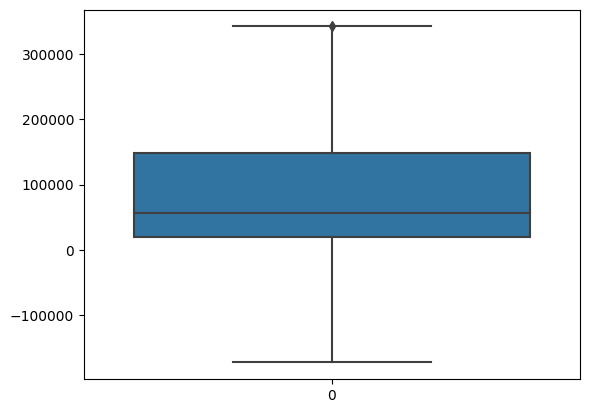

In [ ]:
#verifying if outliers have been removed or not
sns.boxplot(file['Gross Amount'])

<AxesSubplot: xlabel='Gross Amount', ylabel='Density'>

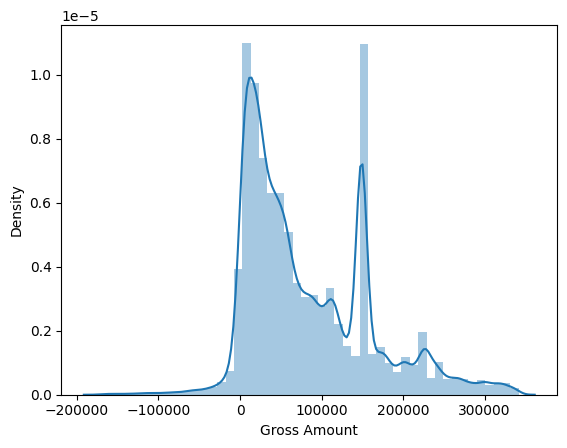

In [ ]:
sns.distplot(file['Gross Amount'])

BG CODE - Column

In [ ]:
#business group or divisions in the org, categorizing business based on specific market segments
file['BG Code'].unique()

array(['LS&E', 'CL', 'PLS', 'Lamps', 'LED', 'Professional', 'Home',
       'Emerging Business', 'Dig. Solutions', 'Dig. Products',
       'Conv. Products'], dtype=object)

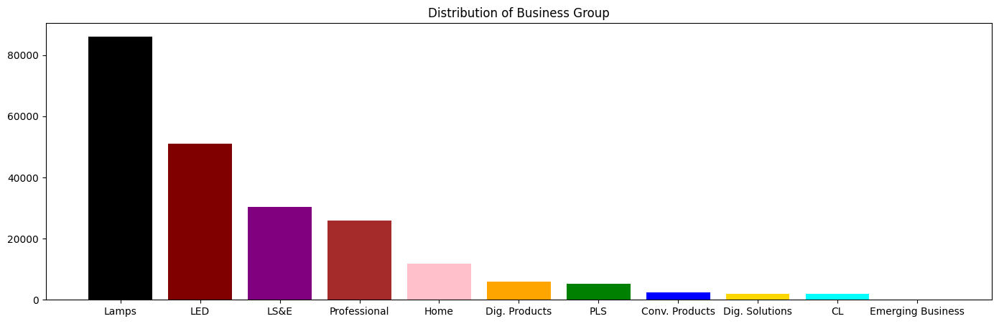

In [ ]:
#Lamps being the group having the highest potential
plt.figure(figsize=(17,5))
bcounts = file['BG Code'].value_counts()
plt.bar(bcounts.index, bcounts.values,color=['black', 'maroon', 'purple', 'brown', 'pink','orange','green','blue','gold','cyan','yellow'])
plt.title('Distribution of Business Group')
plt.show()

BU - Column

In [ ]:
#sub divisions within a business group, focusing on diff product lines, services or segments
file['BU'].unique()

array(['Consumer Products', 'LED Lamps', 'Professional Products',
       'Consumer Luminaires', 'Lamp Electronics', 'PLS', 'LED Modules',
       'Emerging Business A', 'LED Electronics', 'Luceplan',
       'Prof Services', 'Conventional Products', 'Prof Luminaires',
       'LED Lamps&Luminaires', 'Conventional Lamps', 'Hue Connected',
       'Home LFL', 'WiZ Connected'], dtype=object)

In [ ]:
consumer=['Consumer Luminaires','Home LFL','Hue Connected'] #all consumer products
professional=['Prof Services','Prof Luminaires','PLS'] #all professional products
leds=['LED Modules','LED Lamps&Luminaires','LED Electronics'] #all LED products
lamps=['Conventional Lamps','Lamp Electronics','LED Lamps'] #all lamp products
file.loc[(file['BU'].isin(consumer)),'BU']='Consumer Products'
file.loc[(file['BU'].isin(professional)),'BU']='Professional Products'
file.loc[(file['BU'].isin(leds)),'BU']='LED Products'
file.loc[(file['BU'].isin(lamps)),'BU']='Lamp Products'
file['BU']=file['BU'].replace('WiZ Connected','Smart Products')
file['BU']=file['BU'].replace('Emerging Business A','Others')

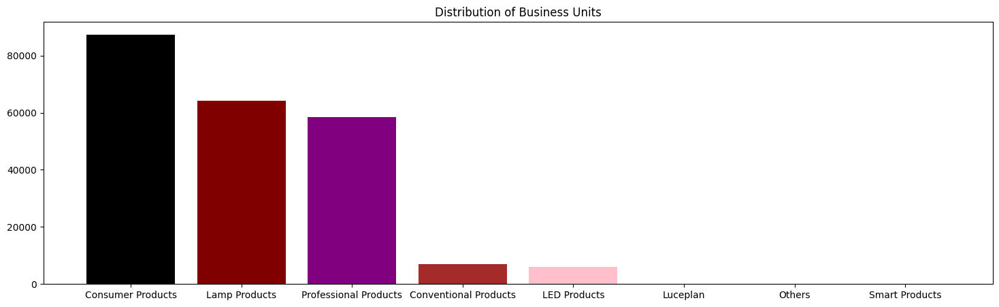

In [ ]:
plt.figure(figsize=(18,5))
bucounts = file['BU'].value_counts()
plt.bar(bucounts.index, bucounts.values,color=['black', 'maroon', 'purple', 'brown', 'pink','orange','green','yellow'])
plt.title('Distribution of Business Units')
plt.show()

BG Name - Column

In [ ]:
#deleting this col beacuse it is the same as BG Code column, also it consist of inaccurate date: A12,014 they are alpha numeric codes that do not correspong to business group names
file['BG NAME'].unique()
file=file.drop('BG NAME',axis=1)

Sub BG - Column

In [ ]:
file['Sub BG'].unique()

array(['A16', 'L66', 'A10', 'A51', 'A13', 'H02', 'G92', 'D57', 'A12',
       'B54', 'B25', 'G97', 'B31', 'B23', 'G96', 'A09', 'B30', 'B55',
       'A43', 'B38', 'A41', 'B39', 'A02', 'A14', 'B53', 'B43', 'B56',
       'B28', 'G87', 'C46', 'B37', 'A42', 'G94', 'G93', 'A49', 'G91',
       'B59', 'A47', 'B41', 'D38', 'Q63', '20B', 'H33', 'L70', 'A85',
       'G89', 'B29', 'Q56', 'B22', 'A17', 'Q55', 'C41', 'C62', 'B50',
       'A50', 'B33', 'A88', 'Q13', 'C58', 'B49', 0, 'Q18', 'B42', 'O15',
       'O14', 'G88', 'O16', 'B24', 'A54', 'C44', 'Q44', nan, 'B44', 'B27',
       'B35', 'O18', 'F10', 'O19', 'Q19', 'B45', 'B26', 'C56', 'AA8',
       'I60', 'I76', 'I82', 'AG2', 'G82', 'AG0', 'AF8', 'G79', 'G76',
       'D17', 'G86', 'G77', 'D16', 'PA1', 'PA0', 'PA2', 'AU4', 'AU5',
       'AV1', 'O21', 'AV3', 'B40', 'AX9', 'AW2', 'AY4', 'AU8', 'PA3'],
      dtype=object)

In [ ]:
file['Sub BG'] = file['Sub BG'].replace(0, np.nan)

In [ ]:
file[file['Sub BG'].isna()]

,PD,DC,MONTH,YEAR,Customer Code,Customer Name,CITY,Invoice #,Invoice Date.2,12NC CODE,...,Qty,Amount,Sales Tax,Gross Amount,BG Code,BU,Sub BG,Order Date,Order #,OFFICE NAME
22341,LIGHT,CONS,JULY,2014,92000399,INTERNATIONAL FANCY LIGHT,LAHORE,9292524802,2014-07-25,915004018601,...,2,43332.0,8233.08,51565.080,CL,Consumer Products,NaN,2014-07-25 00:00:00,1.011348e+09,LAHORE OFFICE
22393,LIGHT,CONS,JULY,2014,92000933,PARACHA BROTHERS,RAWALPINDI,9292524809,2014-07-25,915003431301,...,12,28200.0,5076.00,33276.000,CL,Consumer Products,NaN,2014-07-25 00:00:00,1.011347e+09,0
22473,LIGHT,CONS,JULY,2014,92000747,LITELOGY,KARACHI,9292524851,2014-07-25,915004018601,...,1,21666.0,4333.20,25999.200,CL,Consumer Products,NaN,2014-07-25 00:00:00,1.011349e+09,KARACHI OFFICE
55917,LIGHT,CONS,JUNE,2015,92000955,AL QASIM ENTERPRISES,RAWALPINDI,9292543023,2015-06-26,911401687602,...,25,134000.0,10080.00,148993.425,Professional,Professional Products,NaN,2015-06-26 00:00:00,1.013135e+09,NaN
61689,LIGHT,PROF,AUG,2015,92001077,MATRIX ENGINEERING PVT LTD,LAHORE,9292545374,2015-08-07,911401549221,...,25,162393.0,10080.00,189999.810,Professional,Professional Products,NaN,2015-08-07 00:00:00,1.013338e+09,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64556,LIGHT,CONS,AUG,2015,92000528,INTERNATIONAL MARKETING SERVICES,MULTAN,9292547119,2015-08-28,929689208706,...,600,112200.0,0.00,112200.000,Lamps,Consumer Products,NaN,2015-08-28 00:00:00,1.013454e+09,NaN
64564,LIGHT,CONS,AUG,2015,92000585,ELECTRO LIGHT,OKARA,9292547120,2015-08-28,929001155907,...,240,108720.0,20656.80,129376.800,LED,Lamp Products,NaN,2015-08-28 00:00:00,1.013454e+09,NaN
64582,LIGHT,CONS,AUG,2015,92000932,AL QASIM ENTERPRISES,RAWALPINDI,9292547123,2015-08-28,929001155907,...,480,217440.0,10080.00,254404.800,LED,Lamp Products,NaN,2015-08-28 00:00:00,1.013454e+09,NaN
64625,LIGHT,CONS,AUG,2015,92000496,KHURRAM ENTERPRISES,KARACHI,9292547142,2015-08-28,929689208706,...,600,112200.0,0.00,112200.000,Lamps,Consumer Products,NaN,2015-08-28 00:00:00,1.013457e+09,NaN


In [ ]:
#using this line of code to fill in the missing values, cauz we know a item will belong to the same BU and BG, hence using them and code to map the sub bg which will be the same for the item
file[(file['BU']=='Professional Products') & (file['BG Code']=='Professional') & (file['12NC CODE']==911401566321)]

,PD,DC,MONTH,YEAR,Customer Code,Customer Name,CITY,Invoice #,Invoice Date.2,12NC CODE,...,Qty,Amount,Sales Tax,Gross Amount,BG Code,BU,Sub BG,Order Date,Order #,OFFICE NAME
62900,LIGHT,PROF,AUG,2015,92000211,STOC ENTERPRISE,KARACHI,9292545924,2015-08-19,911401566321,...,1,3649.57,620.43,4270.000,Professional,Professional Products,NaN,2015-08-19 00:00:00,1.013397e+09,NaN
64395,LIGHT,PROF,AUG,2015,92001094,HP LIGHTING & SOLUTION,KARACHI,9292547077,2015-08-27,911401566321,...,320,134000.00,10080.00,148993.425,Professional,Professional Products,NaN,2015-08-27 00:00:00,1.013452e+09,NaN
65707,LIGHT,PROF,SEPT,2015,92001094,HP LIGHTING & SOLUTION,KARACHI,9292547245,2015-09-05,911401566321,...,20,64649.60,10990.43,75640.030,Professional,Professional Products,B23,2015-09-05 00:00:00,1.013501e+09,NaN
74079,LIGHT,PROF,NOV,2015,92001094,HP LIGHTING & SOLUTION,KARACHI,9292550880,2015-11-05,911401566321,...,100,134000.00,10080.00,148993.425,Professional,Professional Products,B23,2015-11-05 00:00:00,1.013835e+09,0
79787,LIGHT,PROF,DEC,2015,92001094,HP LIGHTING & SOLUTION,KARACHI,9292553398,2015-12-11,911401566321,...,350,134000.00,10080.00,148993.425,Professional,Professional Products,B23,2015-12-11 00:00:00,1.014063e+09,0
80107,LIGHT,PROF,DEC,2015,92001094,HP LIGHTING & SOLUTION,KARACHI,9292553644,2015-12-17,911401566321,...,209,134000.00,10080.00,148993.425,Professional,Professional Products,B23,2015-12-17 00:00:00,1.014079e+09,0
101058,LIGHT,PROF,JUNE,2016,92001094,HP LIGHTING & SOLUTION,KARACHI,9292562335,2016-06-06,911401566321,...,1,3232.48,549.52,3782.000,Professional,Professional Products,B23,2016-06-06 00:00:00,1.014079e+09,0
101902,LIGHT,PROF,JUNE,2016,92000950,INTERNATIONAL LIGHTING SYSTEM,MULTAN,9292562627,2016-06-11,911401566321,...,2,8974.34,1525.64,10499.980,Professional,Professional Products,B23,2016-06-11 00:00:00,1.014976e+09,LAHORE OFFICE
126916,LIGHT,PROF,FEB,2017,92000713,STANDARD CHARTERED BANK LIMITED,KARACHI,9292574626,2017-02-16,911401566321,...,95,134000.00,10080.00,148993.425,Professional,Professional Products,B23,2017-02-16 00:00:00,1.016294e+09,NaN
128642,LIGHT,PROF,MARCH,2017,92000713,STANDARD CHARTERED BANK LIMITED,KARACHI,9292575635,2017-03-08,911401566321,...,20,70000.00,11900.00,81900.000,Professional,Professional Products,B23,2017-03-08 00:00:00,1.016400e+09,NaN


In [ ]:
file.loc[(file['BU']=='Consumer Products') & (file['BG Code']=='CL') & (file['12NC CODE']==915004018601) & (file['Sub BG'].isna()),'Sub BG']='G91'
file.loc[(file['BU']=='Consumer Products') & (file['BG Code']=='CL') & (file['12NC CODE']==915003431301) & (file['Sub BG'].isna()),'Sub BG']='G94'
file.loc[(file['BU']=='Professional Products') & (file['BG Code']=='Professional') & (file['12NC CODE']==911401687602) & (file['Sub BG'].isna()),'Sub BG']='A49'
file.loc[(file['BU']=='Professional Products') & (file['BG Code']=='Professional') & (file['12NC CODE']==911401549221) & (file['Sub BG'].isna()),'Sub BG']='B37'
file.loc[(file['BU']=='Consumer Products') & (file['BG Code']=='Lamps') & (file['12NC CODE']==929689208706) & (file['Sub BG'].isna()),'Sub BG']='O15'
file.loc[(file['BU']=='Lamp Products') & (file['BG Code']=='LED') & (file['12NC CODE']==929001155907) & (file['Sub BG'].isna()),'Sub BG']='L66'

file.loc[(file['BU']=='Professional Products') & (file['BG Code']=='Professional') & (file['12NC CODE']==824110150421) & (file['Sub BG'].isna()),'Sub BG']='A41'
file.loc[(file['BU']=='Professional Products') & (file['BG Code']=='Professional') & (file['12NC CODE']==911401566321) & (file['Sub BG'].isna()),'Sub BG']='B23'
file.loc[(file['BU']=='Professional Products') & (file['BG Code']=='Professional') & (file['12NC CODE']==911401565121) & (file['Sub BG'].isna()),'Sub BG']='B23'
file.loc[(file['BU']=='Professional Products') & (file['BG Code']=='Professional') & (file['12NC CODE']==911401567521) & (file['Sub BG'].isna()),'Sub BG']='B23'
file.loc[(file['BU']=='Professional Products') & (file['BG Code']=='Professional') & (file['12NC CODE']==911401564521) & (file['Sub BG'].isna()),'Sub BG']='B23'
file.drop(62903,inplace=True) #no matching for this, nor this product ever supplied more than once hence deleting it was the best option

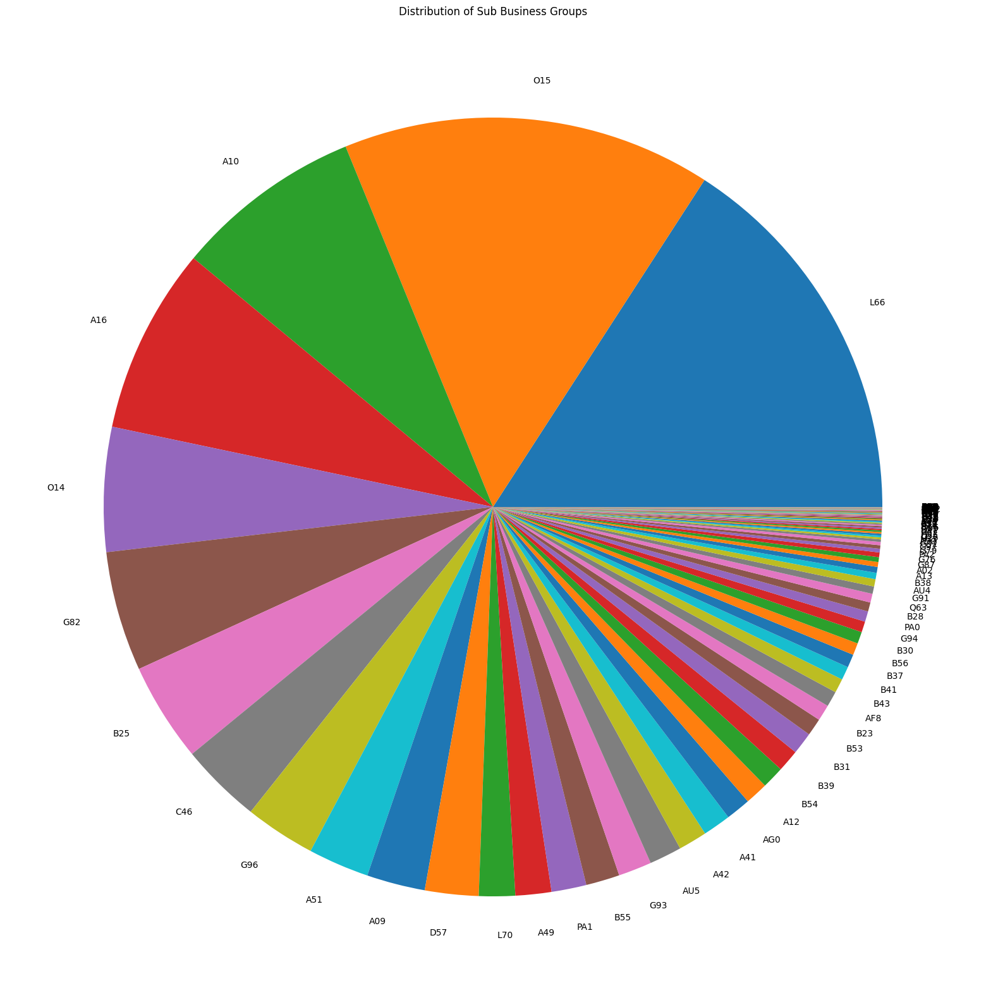

In [ ]:
plt.figure(figsize=(20,20))
sbcounts = file['Sub BG'].value_counts()
plt.pie(sbcounts.values, labels=sbcounts.index)
plt.title('Distribution of Sub Business Groups')
plt.show()

Material Group - Column

In [ ]:
file['Material Group'].unique()

array([nan, 'Other', 'Ledino', 'F. Spot', 'F. Desk', 'Conventional',
       'AquaFit', 'OuterStylers', 'RoomStylers', 'LED Flood Light',
       'LED Road Light', 'F. Ceiling', 'Lenia', 'LivingColors',
       'Kidsplace', 'myLiving', 'Ambiance Accessories', 'EcoMoods',
       'outdoor', 'Accents', 'myBathroom', 'M. Desk / Promo',
       'myGarden / Contemporary', 'myGarden', 'myGarden / Ledino', 'Desk',
       'FLOOD LIGHT', 'ROAD LIGHT', 0], dtype=object)

In [ ]:
#handling inconsistencies, since they all mean the same and come in one category only so categorizing them
group=['Ledino','LED Road Light','EcoMoods','LED Flood Light']
other=['Kidsplace','LivingColors','Ambiance Accessories','myLiving']
garden=['myGarden / Contemporary','myGarden / Ledino','myGarden','outdoor','AquaFit','OuterStylers','RoomStylers']
ceil=['Conventional','Lenia','F. Spot','F. Desk','F. Ceiling']
desk=['Desk','M. Desk / Promo']

file['Material Group'] = file['Material Group'].replace(group, 'LED Lights')
file['Material Group'] = file['Material Group'].replace(other, 'Other')
file['Material Group']=file['Material Group'].replace(garden,'Outdoor Lights')
file['Material Group']=file['Material Group'].replace(ceil,'Ceiling Lights')
file['Material Group']=file['Material Group'].replace(desk,'Desk Lights')
file['Material Group']=file['Material Group'].replace('myBathroom','Bathroom Lights')
file['Material Group']=file['Material Group'].replace('ROAD LIGHT','Road Lights')
file['Material Group']=file['Material Group'].replace('FLOOD LIGHT','Flood Lights')
file['Material Group']=file['Material Group'].replace(0,np.nan)

In [ ]:
file[file['Material Group'].isna()]

,PD,DC,MONTH,YEAR,Customer Code,Customer Name,CITY,Invoice #,Invoice Date.2,12NC CODE,...,Qty,Amount,Sales Tax,Gross Amount,BG Code,BU,Sub BG,Order Date,Order #,OFFICE NAME
0,LIGHT,CONS,JAN,2014,92000559,RAUSHAN ELECTRIC STORES,KARACHI,9292514433,2014-01-08,929689626501,...,144,26496.00,0.00,26496.00,LS&E,Consumer Products,A16,2014-01-08 00:00:00,1.010241e+09,KARACHI OFFICE
1,LIGHT,CONS,JAN,2014,92000559,RAUSHAN ELECTRIC STORES,KARACHI,9292514433,2014-01-08,929000250007,...,90,76500.00,15300.00,91800.00,LS&E,Lamp Products,L66,2014-01-08 00:00:00,1.010241e+09,KARACHI OFFICE
2,LIGHT,CONS,JAN,2014,92000559,RAUSHAN ELECTRIC STORES,KARACHI,9292514434,2014-01-08,929000248507,...,12,4500.00,900.00,5400.00,LS&E,Lamp Products,L66,2014-01-08 00:00:00,1.010241e+09,KARACHI OFFICE
3,LIGHT,CONS,JAN,2014,92000559,RAUSHAN ELECTRIC STORES,KARACHI,9292514434,2014-01-08,929000248807,...,24,12600.00,2520.00,15120.00,LS&E,Lamp Products,L66,2014-01-08 00:00:00,1.010241e+09,KARACHI OFFICE
4,LIGHT,CONS,JAN,2014,92000559,RAUSHAN ELECTRIC STORES,KARACHI,9292514434,2014-01-08,929000249707,...,30,19890.00,3978.00,23868.00,LS&E,Lamp Products,L66,2014-01-08 00:00:00,1.010241e+09,KARACHI OFFICE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
223819,LIGHT,CONS,NOV,2020,92000370,BILAL AND COMPANY,TANDLIANWALA,9292623509,2020-10-31,929002345169,...,500,134000.00,0.00,331200.00,Dig. Products,LED Products,L66,2020-10-31 00:00:00,1.028521e+09,LAHORE OFFICE
223820,LIGHT,CONS,NOV,2020,92000370,BILAL AND COMPANY,TANDLIANWALA,9292623509,2020-10-31,929002344069,...,240,55200.00,0.00,55200.00,Dig. Products,LED Products,L66,2020-10-31 00:00:00,1.028521e+09,LAHORE OFFICE
223821,LIGHT,PROF,NOV,2020,92000724,BIN MUMTAZ INTERNATIONAL,FAISALABAD,9292623510,2020-10-31,927980283036,...,300,39666.00,6743.22,46409.22,Conv. Products,Lamp Products,PA1,2020-10-31 00:00:00,1.028484e+09,0
223822,LIGHT,PROF,NOV,2020,92000724,BIN MUMTAZ INTERNATIONAL,FAISALABAD,9292623510,2020-10-31,929689208606,...,96,20160.00,0.00,20160.00,Conv. Products,Lamp Products,AU5,2020-10-31 00:00:00,1.028484e+09,0


In [ ]:
#since we know that 12NC CODE represents the item code and each item will belong to one group only, so using 12NC code as a factor to fill in the missing values
#filtered out codes according to the group info that was given, and have put them in the list. if any code where the group info missing is in the following list, that group will be assigned to it
accent=[915004097501,915004097201,915004212501]
desk=[915004468501,915004498001]
bathroom=[915002154501]
ceiling=[915003936501, 915004365801, 915004365901, 915004134001, 915004134101, 915003952501, 915003937401, 915004365901, 915003952501, 919052103601, 915003951401, 919052450201, 919052103601, 915003936401,
         915003938701, 915004365901, 919052450201, 915003952501, 919052120201, 915004134001, 915004134101, 919052103601, 919052101001, 915002150904, 915004365901, 915000010521, 915004134001, 915004134101,
         915004369001, 915003938101, 919052100301, 919052450501, 915004369001, 919052450501, 919052450501, 919052100301, 919052450501, 915000068401, 915004138101, 915004365801, 915002151102, 915002441302,
         919052100701, 919052450201, 919052450501, 915004134001, 915004134101, 919052450201, 919052450101, 915003938801, 919052450601, 915000068401, 919052100301, 915004134001, 919052450201, 915004138101,
         915004138101, 915000010521, 915004134001, 915004138001, 915000010520, 915000010521, 915002151102, 915002151302, 915002441402, 915002150804, 915004138001, 919052450101, 919052450901, 919052103601,
         919052450101, 915004365801, 915003937901, 915003938101, 915004365801, 915002733002, 915002732602, 915003937301, 919052100901, 915003936401, 915003936501, 915003937301, 915003937401, 915003938701,
         915003951001, 915003951101, 915003951401, 915003952501, 915003952701, 915003952901, 915004369001, 915004366001, 915003936401, 915003951001, 915003951401, 915003952501, 915003952701, 915003952901,
         919052450501, 915003952501, 915004366001, 915004365901, 915004365901, 915003936401, 915004369101, 915004365901, 915004366001, 919052450501, 919052103601, 919052100201, 915003952901, 915004366001,
         919052100801, 919052100201, 919052450201, 919052100701, 919052100901, 919052103601, 919052450601, 919052450601, 915004365901, 915000010520, 915002151302, 915002441202, 915002441302, 915002441402,
         915002441502, 915002150804, 915002150904, 919052103601, 915004472701, 915004473101, 915004923801, 915004472701, 915004472701, 915004473101, 915004472701, 915004473101, 915004472301, 915004923801,
         919052103601, 915004923801, 919052100601, 915004472701, 915004473101, 915004472701, 915004473101, 919052450101, 915004923801, 915004565401, 915004565301, 915004565402, 915004565302, 915004478601,
         915004565401, 915004565301, 915004565402, 915004565302, 915004478601, 915004565401, 915004565301, 915004565402, 915004565302, 915004478601, 915004565402, 915004565302, 915004565401, 915004565301,
         915004565402, 915004565302, 915004478601, 915004478601, 915004565401, 915004472501, 915004472501, 919052100801, 915004472501, 915004472501, 915004472501, 915004472501, 915004472501, 919052450901,
         915004472501, 919052450701, 915004472501, 915004472701, 915004472501, 915004472701, 915004473101, 915004472501, 915004472701, 915004473101, 915004478601, 915004565301, 915004472501, 915004472701,
         915004472301, 919052450201, 919052100601, 919052450801, 919052450901, 915004565402, 915004923801, 919052450201, 915004565301, 915004565401, 915004478601, 915004923801]

road=[823807950238, 823807950249, 823807950253, 823807950268, 823807950280, 823807950351, 823807950353, 823807950355, 823807950462, 823807950463, 823807950467, 823807950482, 823807950485, 823807950486,
      823807950487, 823807950488, 824110150421, 824110150871, 824110151321, 910403630347, 911400674380, 911400990280, 911401600111, 911401620501, 911401669901, 911401670201, 911401673202, 911401673902,
      911401674802, 911401674902, 911401675002, 911401675302, 911401675602, 911401675702, 911401675802, 911401803298, 911401803398, 911401808298, 911401816198, 911401816598, 911401817798, 919052100101,
      919052100101, 919052100201, 919052100301, 919052100401, 919052100401, 919052100601, 919052100701, 919052100801, 919052100901, 919052101001, 919052103601, 919052313501, 919052450101, 919052450201,
      919052450501, 919052450601, 919052450701, 919052450801, 919052450901, 919052451001, 919052710501]

flood=[823807811211, 824110150431, 824110151461, 910401633380, 910401633580, 910401635280, 910401636380, 910401637680, 910401637880, 910401642180, 910401642280, 910401642380, 910401642480, 910401642580,
       910401647680, 910401965480, 910401965780, 910403306901, 910403307601, 910403348001, 910403630312, 910404042002, 910404042003, 910404042004, 910404042007, 910404042008, 910404042010, 910404042011,
       910404042012, 910404042014, 910404042015, 910404042016, 911401040380, 911401043480, 911401043580, 911401043780, 911401044180, 911401044980, 911401054380, 911401054680, 911401055080, 911401607903,
       911401608003, 911401608103, 911401608303, 911401610203, 911401610303, 911401627301, 911401634102, 911401634202, 911401634702, 911401634802, 911401635102, 911401666002, 911401666102, 911401666202,
       911401666602, 911401687602, 911401687802, 911401687902, 911401688002, 911401688102, 911401689602, 911401689902, 911401697002, 911401805698, 911401805798, 911401805898, 919052120301, 919052120401,
       919052120501, 919052120601, 919052120701, 919052120801, 919052160101, 919052160201, 919052160301, 919052160401, 919052510101]

other=[915002110404, 915002196301, 915002196401, 915002196501, 915002196601, 915002196801, 915002197601, 915002197901, 915002198001, 915002198101, 915002413903, 915002415701, 915002440201, 915003425201,
       915003425301, 915003559801, 915003560601, 915003563501, 915004018001, 915004018501, 915004018601, 915004018901, 915004148201, 915004148301, 915004242601, 919052364701]

outdoor=[915000018301, 915000049201, 915000049301, 915000049701, 915000049801, 915000049901, 915000050001, 915000052201, 915000059301, 915000059301, 915000062701, 915000062801, 915000062901, 915000063001,
         915000063401, 915000063501, 915000067201, 915000067901, 915000068001, 915000068101, 915000068201, 915000084201, 915000084201, 915000084301, 915000084401, 915000091401, 915000091501, 915000091601,
         915000091701, 915000091801, 915000091801, 915000091901, 915000092101, 915000110901, 915000113201, 915000115301, 915000130103, 915001006602, 915001171907, 915001796402, 915001924703, 915001947004,
         915001953003, 915001960504, 915002037601, 915002139701, 915002140001, 915002140101, 915002140301, 915002152301, 915002152301, 915002152401, 915002152501, 915002152901, 915002153001, 915002153101,
         915002153201, 915002153201, 915002153401, 915002153701, 915002154301, 915002154601, 915002155601, 915002155701, 915002161701, 915002162001, 915002162701, 915002162901, 915002163101, 915002163201,
         915002164001, 915002164101, 915002164201, 915002164301, 915002164401, 915002164701, 915002164801, 915002164901, 915002165001, 915002165101, 915002165201, 915002165601, 915002166101, 915002204004,
         915002219001, 915002219101, 915002219201, 915002219301, 915002219801, 915002219901, 915002220001, 915002220301, 915002233803, 915002233903, 915002238001, 915002238301, 915002238401, 915002238501,
         915002238601, 915002238701, 915002239001, 915002239201, 915002239301, 915002239501, 915002239801, 915002240701, 915002255401, 915002255701, 915002255801, 915002255901, 915002256201, 915002256301,
         915002256401, 915002256501, 915002256601, 915002256701, 915002256801, 915002256901, 915002257801, 915002257901, 915002258001, 915002258101, 915002258301, 915002258401, 915002259101, 915002259401,
         915002260001, 915002260201, 915002319001, 915002325904, 915002326304, 915002327604, 915002335703, 915002335803, 915002336203, 915002337201, 915002338403, 915002389803, 915002701001, 915003440401,
         915003446001, 915003446801, 915003447101, 915003447401, 915003447901, 915003448001, 915003448301, 915003448601, 915003448801, 915003717901, 915003719501, 915003720901, 915003721001, 915003723401,
         915003724201, 915003724301, 915003724401, 915003724501, 915003724501, 915003725201, 915003948501, 915003948701, 915003949601, 915004018101, 915004018201, 915004018301, 915004018401, 915004018701,
         915004071601, 915004071701, 915004071901, 915004107001, 915004107101, 915004110101, 915004110201, 915004110301, 915004110401, 915004110501, 915004110501, 915004110601, 915004110701, 915004110801,
         915004110901, 915004111001, 915004111201, 915004111301, 915004242301, 915004269501, 915004269601, 915004269701, 915004269801, 915004485101, 915004485301, 915004485501, 915004485701, 915004486101,
         915004486301, 915004486501, 915004486701, 919052810690, 919052812690, 919052813690, 919052814690]

led=[823807950111, 823807950120, 823807950121, 823807950229, 823807950238, 823807950253, 823807950254, 823807950255, 823807950268, 823807950280, 823807950351, 823807950353, 823807950355, 823807950366,
     823807950467, 910403630347, 910403630348, 911401627301, 911401634102, 911401634202, 911401634502, 911401634702, 911401634802, 911401650101, 911401653302, 911401668901, 911401669402, 911401669901,
     911401670201, 911401673902, 911401675002, 911401675302, 911401677201, 911401678001, 911401699501, 915000072901, 915000073001, 915000073201, 915000073401, 915001976801, 915001977001, 915001977501,
     915001977601, 915001977701, 915002138301, 915002138701, 915002139401, 915002177301, 915002571703, 915002680801, 915003431301, 915003431401, 915004107801, 915004150601, 915004152201, 915004191702]

In [ ]:
#being assigned according to the list above
file.loc[(file['12NC CODE'].isin(accent)) & (file['Material Group'].isna()), 'Material Group'] = 'Accents'
file.loc[(file['12NC CODE'].isin(desk)) & (file['Material Group'].isna()), 'Material Group'] = 'Desk Lights'
file.loc[(file['12NC CODE'].isin(bathroom)) & (file['Material Group'].isna()), 'Material Group'] = 'Bathroom Lights'
file.loc[(file['12NC CODE'].isin(ceiling)) & (file['Material Group'].isna()), 'Material Group'] = 'Ceiling Lights'
file.loc[(file['12NC CODE'].isin(flood)) & (file['Material Group'].isna()), 'Material Group'] = 'Flood Lights'
file.loc[(file['12NC CODE'].isin(outdoor)) & (file['Material Group'].isna()), 'Material Group'] = 'Outdoor Lights'
file.loc[(file['12NC CODE'].isin(other)) & (file['Material Group'].isna()), 'Material Group'] = 'Other'
file.loc[(file['12NC CODE'].isin(led)) & (file['Material Group'].isna()), 'Material Group'] = 'LED Lights'
file.loc[(file['12NC CODE'].isin(road)) & (file['Material Group'].isna()), 'Material Group'] = 'Road Lights'
#used mode or internet to assign them to the best groups
file.loc[(file['BG Code']=='LS&E') & (file['Material Group'].isna()), 'Material Group'] = 'LED Lights' #because LS&E is related to LED lights, also researched about it on the internet
file.loc[(file['BG Code']=='LED') & (file['Material Group'].isna()), 'Material Group'] = 'LED Lights' #obvious from the name that it should go in LED lights group
file.loc[(file['BG Code']=='Lamps') &(file['Material Group'].isna()), 'Material Group'] = 'Accents' #because Lamps is related to decorating, so best category was Accents
file.loc[(file['BG Code']=='Home') & (file['BU']=='Luceplan') & (file['Material Group'].isna()), 'Material Group'] = 'Ceiling Lights' #researched, this combination falls under ceiling lights
file.loc[(file['BG Code']=='CL') & (file['BU']=='Consumer Products') & (file['Material Group'].isna()), 'Material Group'] = 'Ceiling Lights' #this combo best falls under ceiling lights, also the items were for indoor setting like chandelior
file.loc[(file['BG Code']=='PLS') & (file['Material Group'].isna()), 'Material Group'] = 'Flood Lights' #best approach was to fill them by the mode, so for PLS type the mode was Flood lights
file.loc[(file['BG Code']=='Home') & (file['BU']=='Consumer Products') & (file['Material Group'].isna()), 'Material Group'] = 'Ceiling Lights' #according to mode for this combination falls, data is more distributed under ceiling lights
file.loc[(file['BG Code']=='Professional') & (file['BU']=='Professional Products')&(file['Material Group'].isna()), 'Material Group'] = 'Other' #prof services BU cannot be categorized in light group, hence others
file.loc[(file['BG Code']=='Professional') & (file['BU']=='Professional Products') & (file['Material Group'].isna()), 'Material Group'] = 'Flood Lights' #best approach was to fill them by the mode, so for PLS type the mode was Flood lights
file.loc[(file['BG Code']=='Emerging Business') & (file['Material Group'].isna()), 'Material Group'] = 'Other' #as it didn't fit in any other category
file.loc[(file['BG Code']=='Dig. Products') &(file['BU']=='Consumer Products') &(file['Material Group'].isna()), 'Material Group'] = 'Other' #as it didn't fit in any other category
file.loc[(file['BG Code']=='Dig. Products') &(file['BU']=='Smart Products') &(file['Material Group'].isna()), 'Material Group'] = 'Other' #as it didn't fit in any other category
file.loc[(file['BG Code']=='Conv. Products') & (file['BU']=='Lamp Products') & (file['Material Group'].isna()), 'Material Group'] = 'Ceiling Lights' #conventional lighting is used for ceiling
file.loc[(file['BG Code']=='Dig. Solutions') & (file['BU']=='Professional Products') & (file['Material Group'].isna()), 'Material Group'] = 'LED Lights' #this combo best falls under ceiling lights, also the items were LEDS
file.loc[(file['BG Code']=='Dig. Products') & (file['BU']=='LED Products') & (file['Material Group'].isna()), 'Material Group'] = 'LED Lights' #this combo best falls under ceiling lights, also the items were LEDS

In [ ]:
# a piece of code used to fill in the missing values where 12NC codes weren't assigned any groups
mod=file[(file['BG Code']=='Home') & (file['BU']=='Consumer Products')]['Material Group'].mode()[0]
mod

'Ceiling Lights'

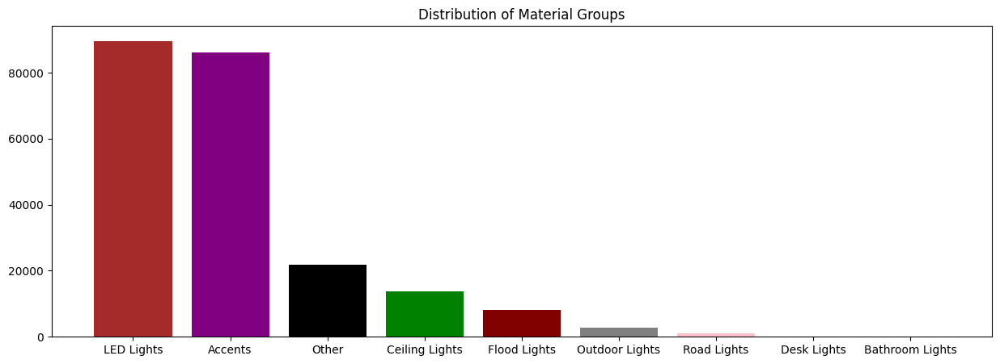

In [ ]:
plt.figure(figsize=(15, 5))
mcounts = file['Material Group'].value_counts()
plt.bar(mcounts.index, mcounts.values, color=[ 'brown','purple', 'black', 'green', 'maroon','grey','pink','yellow','orange'])
plt.title('Distribution of Material Groups')
plt.show()

Order Date - Column

In [ ]:
file['Order Date'].unique()

array([datetime.datetime(2014, 1, 8, 0, 0),
       datetime.datetime(2014, 1, 9, 0, 0),
       datetime.datetime(2014, 1, 10, 0, 0), ...,
       Timestamp('2020-11-27 00:00:00'), Timestamp('2020-11-28 00:00:00'),
       Timestamp('2020-11-30 00:00:00')], dtype=object)

In [ ]:
replace=[43452,43453,43460,43458]
file['Order Date']=file['Order Date'].replace(replace,'2018-12-05') #mapped them through the month and year column

Invoice Date - Column

In [ ]:
file['Invoice Date.2'].unique()

array(['2014-01-08T00:00:00.000000000', '2014-01-09T00:00:00.000000000',
       '2014-01-10T00:00:00.000000000', ...,
       '2020-11-27T00:00:00.000000000', '2020-11-28T00:00:00.000000000',
       '2020-11-30T00:00:00.000000000'], dtype='datetime64[ns]')

In [ ]:
file[file['Invoice Date.2'].isna()]

,PD,DC,MONTH,YEAR,Customer Code,Customer Name,CITY,Invoice #,Invoice Date.2,12NC CODE,...,Qty,Amount,Sales Tax,Gross Amount,BG Code,BU,Sub BG,Order Date,Order #,OFFICE NAME
8752,LIGHT,CONS,APRIL,2014,92000962,SHEIKH TRADERS,GOJRA,9292518094,NaT,929689877801,...,500,134000.0,0.0,148993.425,LS&E,Consumer Products,A16,2014-03-27 00:00:00,1.010702e+09,LAHORE OFFICE
8753,LIGHT,CONS,APRIL,2014,92000962,SHEIKH TRADERS,GOJRA,9292518094,NaT,929689461805,...,240,60000.0,0.0,60000.000,LS&E,Consumer Products,A16,2014-03-27 00:00:00,1.010702e+09,LAHORE OFFICE
8754,LIGHT,CONS,APRIL,2014,92000962,SHEIKH TRADERS,GOJRA,9292518094,NaT,929689451806,...,240,60000.0,0.0,60000.000,LS&E,Consumer Products,A16,2014-03-27 00:00:00,1.010702e+09,LAHORE OFFICE
8836,LIGHT,CONS,APRIL,2014,92000370,BILAL AND COMPANY,TANDLIANWALA,9292518127,NaT,929689451806,...,120,30000.0,0.0,30000.000,LS&E,Consumer Products,A16,2014-03-27 00:00:00,1.010702e+09,LAHORE OFFICE
8837,LIGHT,CONS,APRIL,2014,92000962,SHEIKH TRADERS,GOJRA,9292518128,NaT,929689451806,...,900,225000.0,0.0,225000.000,LS&E,Consumer Products,A16,2014-03-27 00:00:00,1.010702e+09,LAHORE OFFICE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193575,LIGHT,PROF,MARCH,2019,72028939,HIGH COMMISSION OF INDIA,ISLAMABAD,9292604591,NaT,911401876799,...,13,142195.3,0.0,142195.300,Professional,Professional Products,B22,2019-03-27 00:00:00,1.025640e+09,0
193576,LIGHT,PROF,MARCH,2019,92000299,ASIA TECH LIGHTING,ABBOTTABAD,9292604592,NaT,824110154301,...,233,134000.0,0.0,148993.425,Professional,Professional Products,A41,2019-03-27 00:00:00,1.025640e+09,PINDI OFFICE
193577,LIGHT,CONS,APRIL,2019,92000529,CHARAGH TRADERS,PIND DADAN KHAN,9292604615,NaT,929002013669,...,-2,-520.0,0.0,-520.000,LED,Lamp Products,L66,2019-03-28 00:00:00,6.420201e+07,PINDI OFFICE
193578,LIGHT,CONS,APRIL,2019,92000585,ELECTRO LIGHT,OKARA,9292604616,NaT,928048505436,...,-225,-18900.0,-4158.0,-23058.000,Lamps,Conventional Products,PA1,2019-03-28 00:00:00,6.420201e+07,LAHORE OFFICE


In [ ]:
#order date and invoice date were same columns, so we just simply filled invoice date with order date
q = file[file['Invoice Date.2'].isnull()].index
file.loc[q, 'Invoice Date.2'] = file.loc[q, 'Order Date']

In [ ]:
file['Invoice Date.2'] = pd.to_datetime(file['Invoice Date.2'])

In [ ]:
#making sure there is no incosistency in the formatting of the date column, also it is according to the format of the BI Tool
file['Invoice Date.2'] = pd.to_datetime(file['Invoice Date.2'], errors='coerce')
file['Invoice Date.2'] = file['Invoice Date.2'].dt.strftime('%Y-%m-%d %H:%M:%S')

In [ ]:
file.rename(columns={'Invoice Date.2': 'Invoice Date'}, inplace=True)

In [ ]:
#order date was same as invoice so deleted it to avoid redundancy
col=['Order Date']
file = file.drop(col, axis=1)

In [ ]:
def correct_month_vals(file):
    month_mapping = {
        '01': 'JAN',
        '02': 'FEB',
        '03': 'MARCH',
        '04': 'APRIL',
        '05': 'MAY',
        '06': 'JUNE',
        '07': 'JULY',
        '08': 'AUG',
        '09': 'SEPT',
        '10': 'OCT',
        '11': 'NOV',
        '12': 'DEC'
    }

    for year in range(2014, 2018):
        for month in range(1, 13):
            month_str = str(month).zfill(2)
            start_date = f'{year}-{month_str}-01'
            end_date = f'{year}-{month_str}-{calendar.monthrange(year, month)[1]}'
            file.loc[(file['Invoice Date'] >= start_date) & (file['Invoice Date'] <= end_date), 'MONTH'] = month_mapping[month_str]

    return file

In [ ]:
#there were few values in MONTH column that were not according to the invoice date months, hence properly formatting them
correct_month_vals(file)

,PD,DC,MONTH,YEAR,Customer Code,Customer Name,CITY,Invoice #,Invoice Date,12NC CODE,...,Order Type,Qty,Amount,Sales Tax,Gross Amount,BG Code,BU,Sub BG,Order #,OFFICE NAME
0,LIGHT,CONS,JAN,2014,92000559,RAUSHAN ELECTRIC STORES,KARACHI,9292514433,2014-01-08 00:00:00,929689626501,...,ZE01,144,26496.00,0.00,26496.00,LS&E,Consumer Products,A16,1.010241e+09,KARACHI OFFICE
1,LIGHT,CONS,JAN,2014,92000559,RAUSHAN ELECTRIC STORES,KARACHI,9292514433,2014-01-08 00:00:00,929000250007,...,ZE01,90,76500.00,15300.00,91800.00,LS&E,Lamp Products,L66,1.010241e+09,KARACHI OFFICE
2,LIGHT,CONS,JAN,2014,92000559,RAUSHAN ELECTRIC STORES,KARACHI,9292514434,2014-01-08 00:00:00,929000248507,...,ZE01,12,4500.00,900.00,5400.00,LS&E,Lamp Products,L66,1.010241e+09,KARACHI OFFICE
3,LIGHT,CONS,JAN,2014,92000559,RAUSHAN ELECTRIC STORES,KARACHI,9292514434,2014-01-08 00:00:00,929000248807,...,ZE01,24,12600.00,2520.00,15120.00,LS&E,Lamp Products,L66,1.010241e+09,KARACHI OFFICE
4,LIGHT,CONS,JAN,2014,92000559,RAUSHAN ELECTRIC STORES,KARACHI,9292514434,2014-01-08 00:00:00,929000249707,...,ZE01,30,19890.00,3978.00,23868.00,LS&E,Lamp Products,L66,1.010241e+09,KARACHI OFFICE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
223819,LIGHT,CONS,NOV,2020,92000370,BILAL AND COMPANY,TANDLIANWALA,9292623509,2020-10-31 00:00:00,929002345169,...,ZE01,500,134000.00,0.00,331200.00,Dig. Products,LED Products,L66,1.028521e+09,LAHORE OFFICE
223820,LIGHT,CONS,NOV,2020,92000370,BILAL AND COMPANY,TANDLIANWALA,9292623509,2020-10-31 00:00:00,929002344069,...,ZE01,240,55200.00,0.00,55200.00,Dig. Products,LED Products,L66,1.028521e+09,LAHORE OFFICE
223821,LIGHT,PROF,NOV,2020,92000724,BIN MUMTAZ INTERNATIONAL,FAISALABAD,9292623510,2020-10-31 00:00:00,927980283036,...,ZE01,300,39666.00,6743.22,46409.22,Conv. Products,Lamp Products,PA1,1.028484e+09,0
223822,LIGHT,PROF,NOV,2020,92000724,BIN MUMTAZ INTERNATIONAL,FAISALABAD,9292623510,2020-10-31 00:00:00,929689208606,...,ZE01,96,20160.00,0.00,20160.00,Conv. Products,Lamp Products,AU5,1.028484e+09,0


Order # - Column

In [ ]:
file['Order #'].unique()

array([1.01024127e+09, 1.01024127e+09, 1.01024126e+09, ...,
       1.02854954e+09, 1.02852321e+09, 1.02852132e+09])

In [ ]:
file[file['Order #'].isna()]

,PD,DC,MONTH,YEAR,Customer Code,Customer Name,CITY,Invoice #,Invoice Date,12NC CODE,...,Order Type,Qty,Amount,Sales Tax,Gross Amount,BG Code,BU,Sub BG,Order #,OFFICE NAME
179454,LIGHT,CONS,NOV,2018,92000967,JAVED AGNCIES,GILGIT,9292598678,2018-10-24 00:00:00,929676008901,...,ZE01,60,78000.00,0.00,78000.00,Lamps,Consumer Products,O15,NaN,LAHORE OFFICE
179455,LIGHT,CONS,NOV,2018,92000967,JAVED AGNCIES,GILGIT,9292598678,2018-10-24 00:00:00,929689301006,...,ZE01,180,74700.00,0.00,74700.00,Lamps,Consumer Products,O15,NaN,LAHORE OFFICE
179725,LIGHT,CONS,NOV,2018,92000513,SAJJAD ELECTRIC & SANITARY STORE,SKARDU,9292598822,2018-10-25 00:00:00,929001380469,...,ZE01,960,200956.80,0.00,200956.80,LED,Lamp Products,L66,NaN,PINDI OFFICE
179778,LIGHT,CONS,NOV,2018,92000967,JAVED AGNCIES,GILGIT,9292598855,2018-10-25 00:00:00,929001380469,...,ZE01,600,103800.00,22836.00,126636.00,LED,Lamp Products,L66,NaN,LAHORE OFFICE
179779,LIGHT,CONS,NOV,2018,92000967,JAVED AGNCIES,GILGIT,9292598856,2018-10-25 00:00:00,929001380469,...,ZE01,600,125598.00,0.00,125598.00,LED,Lamp Products,L66,NaN,LAHORE OFFICE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184417,LIGHT,PROF,DEC,2018,92000332,KARACHI INTL CONTAINER TERMINAL LIMITED,KARACHI,9292601124,2018-12-05 00:00:00,928392110102,...,ZE0B,-150,-2269.50,-431.21,-2700.71,Lamps,Professional Products,A12,NaN,KARACHI OFFICE
184418,LIGHT,PROF,DEC,2018,92000332,KARACHI INTL CONTAINER TERMINAL LIMITED,KARACHI,9292601125,2018-12-05 00:00:00,927980284036,...,ZE0B,-50,-5341.50,-908.06,-6249.56,Lamps,Professional Products,A10,NaN,KARACHI OFFICE
184419,LIGHT,CONS,DEC,2018,92000184,NASEEM LIGHT CENTRE,KARACHI,9292601188,2018-12-05 00:00:00,929001184638,...,ZE0B,-600,18221.25,0.00,20551.14,LED,Lamp Products,D57,NaN,KARACHI OFFICE
184420,LIGHT,CONS,DEC,2018,92000122,AAMIR TRADERS,KARACHI,9292601192,2018-12-05 00:00:00,929001164937,...,ZE0B,-195,-47248.50,0.00,-47248.50,LED,Lamp Products,L66,NaN,0


In [ ]:
random_numbers = np.random.randint(1, 10, len(file)) #generating random numbers in order to maintain uniquness of order id

# using locf strategy, considering that order numbers will be in an increasing order, so we will copy a number and add a random number to it
file['Order #'] = file['Order #'].fillna(method='pad') + random_numbers

Office Name - Column

In [ ]:
file['OFFICE NAME'].unique()

array(['KARACHI OFFICE', 'LAHORE OFFICE', 'PINDI OFFICE', 0, nan, 'SOUTH',
       'NORTH', 'SOUTH ', 739.4899999999999, 'LAHORE', 'FAISALABAD',
       'OKARA', 'KARACHI', 'RAWALPINDI', 'TEXILA', 'SARGODHA',
       'ABBOTTABAD', 'GUJRAT', 'CHAKWAL', 'Karachi', 'GUJRANWALA',
       'MULTAN', 'SIALKOT', 'BANNU', 'KOTLI', 'QUETTA', 'BAHAWALPUR',
       'MUZAFARABAD', 'HYDERABAD', 'HARIPUR', 'PESHAWAR', 'MARDAN',
       'THARPARKAR', 'BALAKOT', 'TALAGANG', 'Hyderabad', 'R. Y. KHAN',
       'MUZAFFARGARH', 'SUKKUR', 'R.Y.KHAN', 'KHANPUR', 'SADIQABAD',
       'KHANEWAL', 'LARKANA', 'BHAKKAR', 'D.G. KHAN', 'AHMEDPUR EAST',
       'GOJRA', 'MANDI BAHAUDDIN', 'ISLAMABAD', 'ATTOCK', 'MIANWALI',
       'BHAI PHERU', 'KOHAT', 'CHARSADDA', 'D.I.KHAN', 'SKARDU',
       'TANDLIANWALA', 'NAROWAL', 'GUJRANWALA ', 'LAHORE ', 'JHELUM',
       'BAHAWALNAGAR', 'BUREWALA', 'CHICHAWATNI', 'SHAKARGARH', 'GILGIT',
       'PIND DADAN KHAN', 'NAWABSHAH', 'Gujrat', 'WAH CANTT',
       'MIRPUR KHAS', 'HAFIZABAD', '

In [ ]:
#handling inconsistency and inaccuracy
kar=['KARACHI OFFICE','Karachi']
lar=['LAHORE OFFICE','LAHORE ','Lahore']
pind=['PINDI OFFICE','RAWALPINDI']
nul=[0,'SOUTH','NORTH','SOUTH ',739.4899999999999]
file['OFFICE NAME']=file['OFFICE NAME'].replace(nul,np.nan)
file['OFFICE NAME']=file['OFFICE NAME'].replace(kar,'KARACHI')
file['OFFICE NAME']=file['OFFICE NAME'].replace(lar,'LAHORE')
file['OFFICE NAME']=file['OFFICE NAME'].replace(pind,'PINDI')
file['OFFICE NAME']=file['OFFICE NAME'].replace('Hyderabad','HYDERABAD')
file['OFFICE NAME']=file['OFFICE NAME'].replace('R. Y. KHAN','R.Y.KHAN')
file['OFFICE NAME']=file['OFFICE NAME'].replace('RAHIM YAR KHAN','R.Y.KHAN')
file['OFFICE NAME'] = file['OFFICE NAME'].str.upper()

In [ ]:
file[file['OFFICE NAME'].isna()]

,PD,DC,MONTH,YEAR,Customer Code,Customer Name,CITY,Invoice #,Invoice Date,12NC CODE,...,Order Type,Qty,Amount,Sales Tax,Gross Amount,BG Code,BU,Sub BG,Order #,OFFICE NAME
866,LIGHT,CONS,JAN,2014,92000132,IMRAN ENTERPRISES,MIANWALI,9292514704,2014-01-15 00:00:00,928011305430,...,ZE01,500,91250.00,18250.00,109500.000,LS&E,Professional Products,A10,1.010293e+09,NaN
867,LIGHT,CONS,JAN,2014,92000132,IMRAN ENTERPRISES,MIANWALI,9292514704,2014-01-15 00:00:00,928048505436,...,ZE01,750,50250.00,10050.00,60300.000,LS&E,Professional Products,A10,1.010293e+09,NaN
900,LIGHT,CONS,JAN,2014,92000132,IMRAN ENTERPRISES,MIANWALI,9292514721,2014-01-15 00:00:00,929689451806,...,ZE01,120,30000.00,0.00,30000.000,LS&E,Consumer Products,A16,1.010293e+09,NaN
905,LIGHT,CONS,JAN,2014,92000129,FAIZAN TRADERS,GUJRANWALA,9292514725,2014-01-15 00:00:00,929689867803,...,ZE01,600,114000.00,0.00,114000.000,LS&E,Consumer Products,A16,1.010279e+09,NaN
906,LIGHT,CONS,JAN,2014,92000129,FAIZAN TRADERS,GUJRANWALA,9292514725,2014-01-15 00:00:00,929689877801,...,ZE01,600,114000.00,0.00,114000.000,LS&E,Consumer Products,A16,1.010279e+09,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
223809,LIGHT,CONS,NOV,2020,72018111,MALIK TRADERS,WAH CANTT,9292623408,2020-10-28 00:00:00,919052843501,...,ZE01,240,163200.00,0.00,163200.000,Dig. Products,LED Products,G82,1.028446e+09,NaN
223815,LIGHT,PROF,NOV,2020,92000722,INDUS DYEING & MFG CO LTD,MULTAN,9292623473,2020-10-29 00:00:00,929001299408,...,ZE01,300,134000.00,0.00,148993.425,Dig. Products,LED Products,D57,1.028550e+09,NaN
223821,LIGHT,PROF,NOV,2020,92000724,BIN MUMTAZ INTERNATIONAL,FAISALABAD,9292623510,2020-10-31 00:00:00,927980283036,...,ZE01,300,39666.00,6743.22,46409.220,Conv. Products,Lamp Products,PA1,1.028484e+09,NaN
223822,LIGHT,PROF,NOV,2020,92000724,BIN MUMTAZ INTERNATIONAL,FAISALABAD,9292623510,2020-10-31 00:00:00,929689208606,...,ZE01,96,20160.00,0.00,20160.000,Conv. Products,Lamp Products,AU5,1.028484e+09,NaN


In [ ]:
imode1 = file[(file['Customer Name']=='HAMZA MARKETING') & (file['CITY']=='QUETTA') ]['OFFICE NAME'].mode()[0]
#imode1 = file[(file['CITY']=='QUETTA') ]['OFFICE NAME'].mode()[0]
imode1
#lines of code used to map when there was some confusion, on where the product was originally suplues from
#hence used mode to fill in those missing values

'LAHORE'

In [ ]:
#only 6 offices off phillips in the below cities, hence replacing the office names according to the cities each office dstributes too
karachi=['KARACHI','LARKANA','MULTAN','BAHAWALPUR','BHAKKAR','MUZAFFARGARH','SUKKUR','DERA GHAZI KHAN','RAHIM YAR KHAN','AHMEDPUR EAST','KHANEWAL','NAWABSHAH.','SADIQABAD','THARPARKAR',
         'KHANPUR','MAILSI','JAM PUR','SHUJABAD','JAMSHORO','BAHAWALNAGAR','TURBAT']
lahore=['MIANWALI','GUJRANWALA','LAHORE','AZAD KASHMIR','BANNU','OKARA','BHAI PHERU','JHELUM','MARDAN','SIALKOT','FAISALABAD','GILGIT','KOHAT','KASUR','SARGODHA','SHAKARGARH','GUJRAT',
        'MANDI BAHAUDDIN','SHEIKHUPURA','TANDLIANWALA','GOJRA','NAROWAL','SAHIWAL','CHICHAWATNI','PASROOR','BUREWALA','PATTOKI','QUETTA','HAFIZABAD']
pindi=['RAWALPINDI','MUZAFARABAD','ISLAMABAD','PESHAWAR','D.I.KHAN','CHAKWAL','KOTLI','TALAGANG','SKARDU','SWAT','WAH CANTT','CHARSADDA','ABBOTTABAD','ATTOCK','TEXILA','HARIPUR','PIND DADAN KHAN',
       'BALAKOT','MURREE','GUJAR KHAN']
peshawar=['TIMERGIRA']
faisalabad=['MIAN CHANNUU']
hyderabad=['MIRPUR KHAS','HYDERABAD','NAWABSHAH']
cust=['AL QASIM ENTERPRISES','AYAN ENTERPRISES (REL & TRADE LUMN)','JASCO INTERNATIONAL','HAMZA MARKETING']
cust1=['HOUSING DIRECTORATE ARMY CHQ. RWP','HAJI ABDUL MALIK GENERAL STORE','JUBLEE LIGHT HOUSE','FARAZ ENTERPRISES','A&B GENERAL ORDER & SUPPLIER','FASAIL ENTERPRISE']
cust2=['ALLIED TRADING COMPANY','LASANI ENTERPRISES','ZAHID TRADERS','PAK ENTERPRISES','Z.A. TRADERS']
file.loc[file['CITY'].isin(lahore), 'OFFICE NAME'] = 'LAHORE'
file.loc[file['CITY'].isin(karachi), 'OFFICE NAME'] = 'KARACHI'
file.loc[file['CITY'].isin(pindi), 'OFFICE NAME'] = 'PINDI'
file.loc[file['CITY'].isin(hyderabad), 'OFFICE NAME'] = 'HYDERABAD'
file.loc[file['CITY'].isin(faisalabad), 'OFFICE NAME'] = 'FAISALABAD'
file.loc[file['CITY'].isin(peshawar), 'OFFICE NAME'] = 'PESHAWAR'
file.loc[(file['CITY'] == 'RAWALPINDI') & (file['Customer Name'].isin(cust)), 'OFFICE NAME'] = 'LAHORE'
file.loc[(file['CITY'] == 'QUETTA') & (file['Customer Name'].isin(cust)), 'OFFICE NAME'] = 'LAHORE'
file.loc[(file['CITY'] == 'RAWALPINDI') & (file['Customer Name'].isin(cust1)), 'OFFICE NAME'] = 'KARACHI'
file.loc[(file['CITY'] == 'HYDERABAD') & (file['Customer Name'].isin(cust1)), 'OFFICE NAME'] = 'KARACHI'
file.loc[(file['CITY'] == 'QUETTA') & (file['Customer Name'].isin(cust1)), 'OFFICE NAME'] = 'KARACHI'
file.loc[(file['CITY'] == 'HYDERABAD') & (file['Customer Name'].isin(cust2)), 'OFFICE NAME'] = 'HYDERABAD'

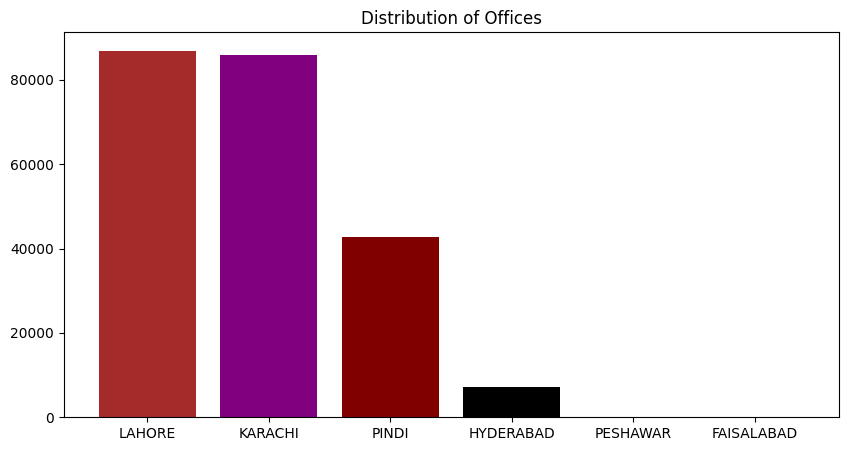

In [ ]:
plt.figure(figsize=(10, 5))
ocounts = file['OFFICE NAME'].value_counts()
plt.bar(ocounts.index, ocounts.values, color=['brown', 'purple', 'maroon', 'black', 'blue','pink'])
plt.title('Distribution of Offices')
plt.show()

In [ ]:
file.isnull().sum() # to verify that everything has been handled

PD                  0
DC                  0
MONTH               0
YEAR                0
Customer Code       0
Customer Name       0
CITY                0
Invoice #           0
Invoice Date        0
12NC CODE           0
Item Description    0
Material Group      0
Branch Plant        0
Order Type          0
Qty                 0
Amount              0
Sales Tax           0
Gross Amount        0
BG Code             0
BU                  0
Sub BG              0
Order #             0
OFFICE NAME         0
dtype: int64

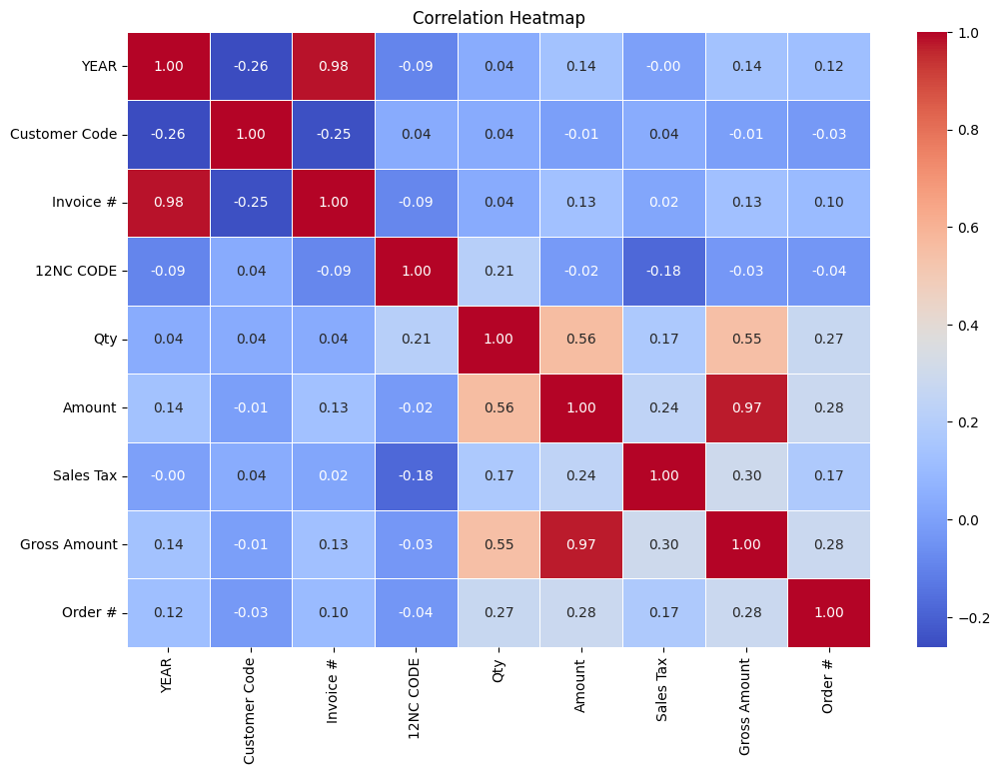

In [ ]:
#defines the relationship between numerical columns
#1 means strong positive corelation and -1 means strong negative relation
correlation_matrix = file.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

In [ ]:
#making a new file with cleaned data
result=file
result.to_csv('Phillips_Cleaned_Data.csv',index=False)

Bi Variate Analysis

Chi Square Test for Categorical Columns

In [ ]:
#extracts the list of categorical columns
cat_cols = file.select_dtypes(include='object').columns
cat_cols

Index(['PD', 'DC', 'MONTH', 'Customer Name', 'CITY', 'Invoice Date',
       'Item Description', 'Material Group', 'Branch Plant', 'Order Type',
       'BG Code', 'BU', 'Sub BG', 'OFFICE NAME'],
      dtype='object')

API for Chi-Square Test

In [ ]:
from scipy.stats import chi2_contingency
def Chi_test1(col, data):

    #extracts the categorical cols
    categorical_cols = [col_name for col_name in data.columns if data[col_name].dtype == 'object']
    categorical_cols.remove(col)

    #chi-square test performance
    for cat_col in categorical_cols:
        observed_data = pd.crosstab(data[col], data[cat_col], margins=False)

        chi_stat, p_val, dof, expected_data = chi2_contingency(observed_data)

        #checking the significane
        alpha = 0.05
        if p_val < alpha:
            print(f"'{col}' & '{cat_col}': Null hypothesis is rejected, Dependent on each other.")
        else:
            print(f"'{col}' & '{cat_col}': Null hypothesis is accepted, Independent of each other.")

        print(f"significance=%.3f, p-value: {p_val:.3f}\n--------------------------------------------------------------------------------")

Chi Square Test between 'PD' and other columns

In [ ]:
Chi_test1('PD',file)

'PD' & 'DC': Null hypothesis is accepted, Independent of each other.
significance=%.3f, p-value: 1.000
--------------------------------------------------------------------------------
'PD' & 'MONTH': Null hypothesis is accepted, Independent of each other.
significance=%.3f, p-value: 1.000
--------------------------------------------------------------------------------
'PD' & 'Customer Name': Null hypothesis is accepted, Independent of each other.
significance=%.3f, p-value: 1.000
--------------------------------------------------------------------------------
'PD' & 'CITY': Null hypothesis is accepted, Independent of each other.
significance=%.3f, p-value: 1.000
--------------------------------------------------------------------------------
'PD' & 'Invoice Date': Null hypothesis is accepted, Independent of each other.
significance=%.3f, p-value: 1.000
--------------------------------------------------------------------------------
'PD' & 'Item Description': Null hypothesis is accepted

Chi Square Test between 'DC' and other columns

In [ ]:
Chi_test1('DC',file)

'DC' & 'PD': Null hypothesis is accepted, Independent of each other.
significance=%.3f, p-value: 1.000
--------------------------------------------------------------------------------
'DC' & 'MONTH': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'DC' & 'Customer Name': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'DC' & 'CITY': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'DC' & 'Invoice Date': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'DC' & 'Item Description': Null hypothesis is rejected, Depend

Chi Square Test between 'MONTH' and other columns

In [ ]:
Chi_test1('MONTH',file)

'MONTH' & 'PD': Null hypothesis is accepted, Independent of each other.
significance=%.3f, p-value: 1.000
--------------------------------------------------------------------------------
'MONTH' & 'DC': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'MONTH' & 'Customer Name': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'MONTH' & 'CITY': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'MONTH' & 'Invoice Date': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'MONTH' & 'Item Description': Null hypothesis is r

Chi Square Test between 'Customer Name' and other columns

In [ ]:
Chi_test1('Customer Name',file)

'Customer Name' & 'PD': Null hypothesis is accepted, Independent of each other.
significance=%.3f, p-value: 1.000
--------------------------------------------------------------------------------
'Customer Name' & 'DC': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'Customer Name' & 'MONTH': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'Customer Name' & 'CITY': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'Customer Name' & 'Invoice Date': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'Customer Name' & 

Chi Square Test between 'CITY' and other columns

In [ ]:
Chi_test1('CITY',file)

'CITY' & 'PD': Null hypothesis is accepted, Independent of each other.
significance=%.3f, p-value: 1.000
--------------------------------------------------------------------------------
'CITY' & 'DC': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'CITY' & 'MONTH': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'CITY' & 'Customer Name': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'CITY' & 'Invoice Date': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'CITY' & 'Item Description': Null hypothesis is reject

Chi Square Test between 'Invoice Date' and other columns

In [ ]:
Chi_test1('Invoice Date',file)

'Invoice Date' & 'PD': Null hypothesis is accepted, Independent of each other.
significance=%.3f, p-value: 1.000
--------------------------------------------------------------------------------
'Invoice Date' & 'DC': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'Invoice Date' & 'MONTH': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'Invoice Date' & 'Customer Name': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'Invoice Date' & 'CITY': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'Invoice Date' & 'Item

Chi Square Test between 'Item Description' and other columns

In [ ]:
Chi_test1('Item Description',file)

'Item Description' & 'PD': Null hypothesis is accepted, Independent of each other.
significance=%.3f, p-value: 1.000
--------------------------------------------------------------------------------
'Item Description' & 'DC': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'Item Description' & 'MONTH': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'Item Description' & 'Customer Name': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'Item Description' & 'CITY': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'I

Chi Square Test between 'Material Group' and other columns

In [ ]:
Chi_test1('Material Group',file)

'Material Group' & 'PD': Null hypothesis is accepted, Independent of each other.
significance=%.3f, p-value: 1.000
--------------------------------------------------------------------------------
'Material Group' & 'DC': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'Material Group' & 'MONTH': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'Material Group' & 'Customer Name': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'Material Group' & 'CITY': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'Material Gr

Chi Square Test between 'Branch Plant' and other columns

In [ ]:
Chi_test1('Branch Plant',file)

'Branch Plant' & 'PD': Null hypothesis is accepted, Independent of each other.
significance=%.3f, p-value: 1.000
--------------------------------------------------------------------------------
'Branch Plant' & 'DC': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'Branch Plant' & 'MONTH': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'Branch Plant' & 'Customer Name': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'Branch Plant' & 'CITY': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'Branch Plant' & 'Invo

Chi Square Test between 'Order Type' and other columns

In [ ]:
Chi_test1('Order Type',file)

'Order Type' & 'PD': Null hypothesis is accepted, Independent of each other.
significance=%.3f, p-value: 1.000
--------------------------------------------------------------------------------
'Order Type' & 'DC': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'Order Type' & 'MONTH': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'Order Type' & 'Customer Name': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'Order Type' & 'CITY': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'Order Type' & 'Invoice Date': N

Chi Square Test between 'BG Code' and other columns

In [ ]:
Chi_test1('BG Code',file)

'BG Code' & 'PD': Null hypothesis is accepted, Independent of each other.
significance=%.3f, p-value: 1.000
--------------------------------------------------------------------------------
'BG Code' & 'DC': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'BG Code' & 'MONTH': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'BG Code' & 'Customer Name': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'BG Code' & 'CITY': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'BG Code' & 'Invoice Date': Null hypothesis is 

Chi Square Test between 'BU' and other columns

In [ ]:
Chi_test1('BU',file)

'BU' & 'PD': Null hypothesis is accepted, Independent of each other.
significance=%.3f, p-value: 1.000
--------------------------------------------------------------------------------
'BU' & 'DC': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'BU' & 'MONTH': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'BU' & 'Customer Name': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'BU' & 'CITY': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'BU' & 'Invoice Date': Null hypothesis is rejected, Dependent on each ot

Chi Square Test between 'Sub BG' and other columns

In [ ]:
Chi_test1('Sub BG',file)

'Sub BG' & 'PD': Null hypothesis is accepted, Independent of each other.
significance=%.3f, p-value: 1.000
--------------------------------------------------------------------------------
'Sub BG' & 'DC': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'Sub BG' & 'MONTH': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'Sub BG' & 'Customer Name': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'Sub BG' & 'CITY': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'Sub BG' & 'Invoice Date': Null hypothesis is reject

Chi Square Test between 'OFFICE NAME' and other columns

In [ ]:
Chi_test1('OFFICE NAME',file)

'OFFICE NAME' & 'PD': Null hypothesis is accepted, Independent of each other.
significance=%.3f, p-value: 1.000
--------------------------------------------------------------------------------
'OFFICE NAME' & 'DC': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'OFFICE NAME' & 'MONTH': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'OFFICE NAME' & 'Customer Name': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'OFFICE NAME' & 'CITY': Null hypothesis is rejected, Dependent on each other.
significance=%.3f, p-value: 0.000
--------------------------------------------------------------------------------
'OFFICE NAME' & 'Invoice Da

Annova Test for Numerical Columns

In [ ]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
#extracts all numerical columns name and makes up a list
num_columns = file.select_dtypes(include=['int32', 'float64','int64']).columns.tolist()
num_columns

['YEAR',
 'Customer Code',
 'Invoice #',
 '12NC CODE',
 'Qty',
 'Amount',
 'Sales Tax',
 'Gross Amount',
 'Order #']

API for Annova Test

In [ ]:
from scipy.stats import f_oneway
def run_anova(file, dependent_var, independent_var):
    groups = file.groupby(independent_var)[dependent_var].apply(list)
    anova_table = f_oneway(*groups.values)
    print(f"\nAnova => {dependent_var} - {independent_var}")
    print("F-value:", anova_table.statistic)
    print("p-value: {:.5e}".format(anova_table.pvalue))  # Print p-value in scientific notation with higher precision
    print(anova_table,"\n\n------------------------------------------------------------------------")

Annova Test between 'YEAR' and other columns

In [ ]:
run_anova(file,'YEAR','Customer Code')
run_anova(file,'YEAR','Invoice #')
run_anova(file,'YEAR','12NC CODE')
run_anova(file,'YEAR','Qty')
run_anova(file,'YEAR','Amount')
run_anova(file,'YEAR','Sales Tax')
run_anova(file,'YEAR','Gross Amount')
run_anova(file,'YEAR','Order #')


Anova => YEAR - Customer Code
F-value: 137.8424929991591
p-value: 0.00000e+00
F_onewayResult(statistic=137.8424929991591, pvalue=0.0) 

------------------------------------------------------------------------

Anova => YEAR - Invoice #
F-value: inf
p-value: 0.00000e+00
F_onewayResult(statistic=inf, pvalue=0.0) 

------------------------------------------------------------------------

Anova => YEAR - 12NC CODE
F-value: 100.1654502735735
p-value: 0.00000e+00
F_onewayResult(statistic=100.1654502735735, pvalue=0.0) 

------------------------------------------------------------------------

Anova => YEAR - Qty
F-value: 4.68624154372606
p-value: 0.00000e+00
F_onewayResult(statistic=4.68624154372606, pvalue=0.0) 

------------------------------------------------------------------------

Anova => YEAR - Amount
F-value: 4.819918010813087
p-value: 0.00000e+00
F_onewayResult(statistic=4.819918010813087, pvalue=0.0) 

------------------------------------------------------------------------

Anov

Annova Test between 'Customer Code' and other columns

In [ ]:
run_anova(file,'Customer Code','YEAR')
run_anova(file,'Customer Code','Invoice #')
run_anova(file,'Customer Code','12NC CODE')
run_anova(file,'Customer Code','Qty')
run_anova(file,'Customer Code','Amount')
run_anova(file,'Customer Code','Sales Tax')
run_anova(file,'Customer Code','Gross Amount')
run_anova(file,'Customer Code','Order #')


Anova => Customer Code - YEAR
F-value: 3577.994593254903
p-value: 0.00000e+00
F_onewayResult(statistic=3577.994593254903, pvalue=0.0) 

------------------------------------------------------------------------

Anova => Customer Code - Invoice #
F-value: inf
p-value: 0.00000e+00
F_onewayResult(statistic=inf, pvalue=0.0) 

------------------------------------------------------------------------

Anova => Customer Code - 12NC CODE
F-value: 10.091768154517492
p-value: 0.00000e+00
F_onewayResult(statistic=10.091768154517492, pvalue=0.0) 

------------------------------------------------------------------------

Anova => Customer Code - Qty
F-value: 2.892365302747007
p-value: 1.83806e-257
F_onewayResult(statistic=2.892365302747007, pvalue=1.838058837617988e-257) 

------------------------------------------------------------------------

Anova => Customer Code - Amount
F-value: 1.749063914031056
p-value: 0.00000e+00
F_onewayResult(statistic=1.749063914031056, pvalue=0.0) 

------------------

Annova Test between 'Invoice #' and other columns

In [ ]:
run_anova(file,'Invoice #','YEAR')
run_anova(file,'Invoice #','Customer Code')
run_anova(file,'Invoice #','12NC CODE')
run_anova(file,'Invoice #','Qty')
run_anova(file,'Invoice #','Amount')
run_anova(file,'Invoice #','Sales Tax')
run_anova(file,'Invoice #','Gross Amount')
run_anova(file,'Invoice #','Order #')


Anova => Invoice # - YEAR
F-value: 1370930.778867189
p-value: 0.00000e+00
F_onewayResult(statistic=1370930.778867189, pvalue=0.0) 

------------------------------------------------------------------------

Anova => Invoice # - Customer Code
F-value: 141.8013246594424
p-value: 0.00000e+00
F_onewayResult(statistic=141.8013246594424, pvalue=0.0) 

------------------------------------------------------------------------

Anova => Invoice # - 12NC CODE
F-value: 102.10671521791004
p-value: 0.00000e+00
F_onewayResult(statistic=102.10671521791004, pvalue=0.0) 

------------------------------------------------------------------------

Anova => Invoice # - Qty
F-value: 4.0887590444233535
p-value: 0.00000e+00
F_onewayResult(statistic=4.0887590444233535, pvalue=0.0) 

------------------------------------------------------------------------

Anova => Invoice # - Amount
F-value: 4.713572897709338
p-value: 0.00000e+00
F_onewayResult(statistic=4.713572897709338, pvalue=0.0) 

------------------------

Annova Test between '12NC CODE' and other columns

In [ ]:
run_anova(file,'12NC CODE','YEAR')
run_anova(file,'12NC CODE','Customer Code')
run_anova(file,'12NC CODE','Invoice #')
run_anova(file,'12NC CODE','Qty')
run_anova(file,'12NC CODE','Amount')
run_anova(file,'12NC CODE','Sales Tax')
run_anova(file,'12NC CODE','Gross Amount')
run_anova(file,'12NC CODE','Order #')


Anova => 12NC CODE - YEAR
F-value: 351.8346378815095
p-value: 0.00000e+00
F_onewayResult(statistic=351.8346378815095, pvalue=0.0) 

------------------------------------------------------------------------

Anova => 12NC CODE - Customer Code
F-value: 164.70119314490037
p-value: 0.00000e+00
F_onewayResult(statistic=164.70119314490037, pvalue=0.0) 

------------------------------------------------------------------------

Anova => 12NC CODE - Invoice #
F-value: 11.601201240536174
p-value: 0.00000e+00
F_onewayResult(statistic=11.601201240536174, pvalue=0.0) 

------------------------------------------------------------------------

Anova => 12NC CODE - Qty
F-value: 32.643415524529345
p-value: 0.00000e+00
F_onewayResult(statistic=32.643415524529345, pvalue=0.0) 

------------------------------------------------------------------------

Anova => 12NC CODE - Amount
F-value: 5.302702000883001
p-value: 0.00000e+00
F_onewayResult(statistic=5.302702000883001, pvalue=0.0) 

----------------------

Annova Test between 'Qty' and other columns

In [ ]:
run_anova(file,'Qty','YEAR')
run_anova(file,'Qty','Customer Code')
run_anova(file,'Qty','Invoice #')
run_anova(file,'Qty','12NC CODE')
run_anova(file,'Qty','Amount')
run_anova(file,'Qty','Sales Tax')
run_anova(file,'Qty','Gross Amount')
run_anova(file,'Qty','Order #')


Anova => Qty - YEAR
F-value: 295.00178406740497
p-value: 0.00000e+00
F_onewayResult(statistic=295.00178406740497, pvalue=0.0) 

------------------------------------------------------------------------

Anova => Qty - Customer Code
F-value: 86.10531789446593
p-value: 0.00000e+00
F_onewayResult(statistic=86.10531789446593, pvalue=0.0) 

------------------------------------------------------------------------

Anova => Qty - Invoice #
F-value: 3.901714966311019
p-value: 0.00000e+00
F_onewayResult(statistic=3.901714966311019, pvalue=0.0) 

------------------------------------------------------------------------

Anova => Qty - 12NC CODE
F-value: 43.152564199378475
p-value: 0.00000e+00
F_onewayResult(statistic=43.152564199378475, pvalue=0.0) 

------------------------------------------------------------------------

Anova => Qty - Amount
F-value: 19.85162782146554
p-value: 0.00000e+00
F_onewayResult(statistic=19.85162782146554, pvalue=0.0) 

------------------------------------------------

Annova Test between 'Amount' and other columns

In [ ]:
run_anova(file,'Amount','YEAR')
run_anova(file,'Amount','Customer Code')
run_anova(file,'Amount','Invoice #')
run_anova(file,'Amount','12NC CODE')
run_anova(file,'Amount','Qty')
run_anova(file,'Amount','Sales Tax')
run_anova(file,'Amount','Gross Amount')
run_anova(file,'Amount','Order #')


Anova => Amount - YEAR
F-value: 977.7561607184738
p-value: 0.00000e+00
F_onewayResult(statistic=977.7561607184738, pvalue=0.0) 

------------------------------------------------------------------------

Anova => Amount - Customer Code
F-value: 80.40518413376184
p-value: 0.00000e+00
F_onewayResult(statistic=80.40518413376184, pvalue=0.0) 

------------------------------------------------------------------------

Anova => Amount - Invoice #
F-value: 3.6124496856948585
p-value: 0.00000e+00
F_onewayResult(statistic=3.6124496856948585, pvalue=0.0) 

------------------------------------------------------------------------

Anova => Amount - 12NC CODE
F-value: 23.795400246792536
p-value: 0.00000e+00
F_onewayResult(statistic=23.795400246792536, pvalue=0.0) 

------------------------------------------------------------------------

Anova => Amount - Qty
F-value: 124.6367992157902
p-value: 0.00000e+00
F_onewayResult(statistic=124.6367992157902, pvalue=0.0) 

------------------------------------

Annova Test between 'Sales Tax' and other columns

In [ ]:
run_anova(file,'Sales Tax','YEAR')
run_anova(file,'Sales Tax','Customer Code')
run_anova(file,'Sales Tax','Invoice #')
run_anova(file,'Sales Tax','12NC CODE')
run_anova(file,'Sales Tax','Qty')
run_anova(file,'Sales Tax','Amount')
run_anova(file,'Sales Tax','Gross Amount')
run_anova(file,'Sales Tax','Order #')


Anova => Sales Tax - YEAR
F-value: 2588.9919765608925
p-value: 0.00000e+00
F_onewayResult(statistic=2588.9919765608925, pvalue=0.0) 

------------------------------------------------------------------------

Anova => Sales Tax - Customer Code
F-value: 102.74169218344974
p-value: 0.00000e+00
F_onewayResult(statistic=102.74169218344974, pvalue=0.0) 

------------------------------------------------------------------------

Anova => Sales Tax - Invoice #
F-value: 4.724760878883915
p-value: 0.00000e+00
F_onewayResult(statistic=4.724760878883915, pvalue=0.0) 

------------------------------------------------------------------------

Anova => Sales Tax - 12NC CODE
F-value: 65.38440789367692
p-value: 0.00000e+00
F_onewayResult(statistic=65.38440789367692, pvalue=0.0) 

------------------------------------------------------------------------

Anova => Sales Tax - Qty
F-value: 21.5204268026462
p-value: 0.00000e+00
F_onewayResult(statistic=21.5204268026462, pvalue=0.0) 

-----------------------

Annova Test between 'Gross Amount' and other columns

In [ ]:
run_anova(file,'Gross Amount','YEAR')
run_anova(file,'Gross Amount','Customer Code')
run_anova(file,'Gross Amount','Invoice #')
run_anova(file,'Gross Amount','12NC CODE')
run_anova(file,'Gross Amount','Qty')
run_anova(file,'Gross Amount','Amount')
run_anova(file,'Gross Amount','Sales Tax')
run_anova(file,'Gross Amount','Order #')


Anova => Gross Amount - YEAR
F-value: 928.6801125905863
p-value: 0.00000e+00
F_onewayResult(statistic=928.6801125905863, pvalue=0.0) 

------------------------------------------------------------------------

Anova => Gross Amount - Customer Code
F-value: 82.18386236790539
p-value: 0.00000e+00
F_onewayResult(statistic=82.18386236790539, pvalue=0.0) 

------------------------------------------------------------------------

Anova => Gross Amount - Invoice #
F-value: 3.616170118488373
p-value: 0.00000e+00
F_onewayResult(statistic=3.616170118488373, pvalue=0.0) 

------------------------------------------------------------------------

Anova => Gross Amount - 12NC CODE
F-value: 22.97151892373438
p-value: 0.00000e+00
F_onewayResult(statistic=22.97151892373438, pvalue=0.0) 

------------------------------------------------------------------------

Anova => Gross Amount - Qty
F-value: 121.14432825097897
p-value: 0.00000e+00
F_onewayResult(statistic=121.14432825097897, pvalue=0.0) 

--------

Annova Test between 'Order #' and other columns

In [ ]:
run_anova(file,'Order #','YEAR')
run_anova(file,'Order #','Customer Code')
run_anova(file,'Order #','Invoice #')
run_anova(file,'Order #','12NC CODE')
run_anova(file,'Order #','Qty')
run_anova(file,'Order #','Amount')
run_anova(file,'Order #','Sales Tax')
run_anova(file,'Order #','Gross Amount')


Anova => Order # - YEAR
F-value: 2559.8693878378613
p-value: 0.00000e+00
F_onewayResult(statistic=2559.8693878378613, pvalue=0.0) 

------------------------------------------------------------------------

Anova => Order # - Customer Code
F-value: 23.521310261375064
p-value: 0.00000e+00
F_onewayResult(statistic=23.521310261375064, pvalue=0.0) 

------------------------------------------------------------------------

Anova => Order # - Invoice #
F-value: 300834671610.0543
p-value: 0.00000e+00
F_onewayResult(statistic=300834671610.0543, pvalue=0.0) 

------------------------------------------------------------------------

Anova => Order # - 12NC CODE
F-value: 7.2987092277015115
p-value: 0.00000e+00
F_onewayResult(statistic=7.2987092277015115, pvalue=0.0) 

------------------------------------------------------------------------

Anova => Order # - Qty
F-value: 1872.985222032677
p-value: 0.00000e+00
F_onewayResult(statistic=1872.985222032677, pvalue=0.0) 

-----------------------------